# Setup and Hardware Configuration

In [ ]:
'''
For Running in local setup (CUDA 12.9 RTX 16GB GPU),
run in LINUX CLI and copy the URL to colab local runtime option

jupyter notebook --no-browser --ip=127.0.0.1 --port=8888 \
  --ServerApp.websocket_ping_interval=36000 \
  --ServerApp.websocket_ping_timeout=0

'''
# pip install nbconvert
# !ls
# !jupyter nbconvert colab18Sep2359b.ipynb --to html
# # if running in drive, uncomment
# import os
# os.getcwd()
# %cd '/content/drive/MyDrive/Colab Notebooks/Restormer_1209/Denoising'

'\nFor Running in local setup (CUDA 12.9 RTX 16GB GPU),\nrun in LINUX CLI and copy the URL to colab local runtime option\n\njupyter notebook --no-browser --ip=127.0.0.1 --port=8888   --ServerApp.websocket_ping_interval=36000   --ServerApp.websocket_ping_timeout=0\n\n'

In [1]:
# Setup For CT physics

import numpy as np
import torch
print(torch.__version__, '# torch')
print(torch.version.cuda,'# cuda')
print(torch.cuda.get_arch_list() , '# cuda arch')
# !pip install astra-toolbox
import astra
print(astra.__version__, '# astra')
print(astra.get_gpu_info())
print('cuda available,', torch.cuda.is_available() ) # test pytorch is functioning with cuda
# !pip install odl
import odl
print(odl.__version__, '# odl')

# NOTE # PLACE IN A SEPERATE SECTION with desc
from dival.reconstructors.odl_reconstructors import FBPReconstructor

2.8.0+cu129 # torch
12.9 # cuda
['sm_70', 'sm_75', 'sm_80', 'sm_86', 'sm_90', 'sm_100', 'sm_120', 'compute_120'] # cuda arch
2.3.1 # astra
GPU #0: NVIDIA GeForce RTX 5060 Ti, with 16310MB, CUDA compute capability 12.0
cuda available, True
0.8.2 # odl


2025-09-23 07:09:13.048629: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-09-23 07:09:13.224785: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1758607753.294163     496 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1758607753.314285     496 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1758607753.464302     496 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

In [2]:
# Dataset Manipulation utilities

# !pip install dival
from dival import get_standard_dataset
from dival.util.plot import plot_images
from dival.data import DataPairs

# For operator discretization
from dival.util.odl_utility import uniform_discr_element

In [3]:
# for CNN Architectures

import time
from datetime import datetime
from collections import OrderedDict
# !pip install hdf5storage
import hdf5storage
import os
import os.path as osp
import sys
import matplotlib.pyplot as plt

In [4]:
# for Gaussian Denoisers on CNN

# import pip
# !pip install opencv-python
# import cv2 # prerequisite for utils_image
import logging

In [5]:
# for Transformer architecture

import numpy as np
import os
import argparse
from tqdm import tqdm
from skimage import img_as_ubyte
from natsort import natsorted
from glob import glob
from runpy import run_path
# !pip install opencv-python
import cv2

import os
# !pip install einops
import einops
import shutil

import torch.nn as nn
import torch
import torch.nn.functional as F

In [6]:
# For Transformer training

# !pip install pyyaml
import yaml
import argparse
import random
from pathlib import Path
import pprint
# !pip install lmdb
from pdb import set_trace as stx
import yaml

In [7]:
# For Evaluations

from dival.evaluation import TaskTable
from dival.measure import PSNR
from dival.measure import SSIM
from dival.measure import L2

In [8]:
# another import with clashing names
# Importing utils and utils in order

%cd
if os.getcwd() != '/home/hiran':
  raise ImportError
from utils import utils_logger
from utils import utils_model
from utils import utils_image as utilsImg

from utils import utils_deblur
from utils import utils_pnp as pnp
from utils import utils_sisr_beforepytorchversion8 as sr # utils_sisr as sr # deprecated library

if utilsImg.__file__ != '/home/hiran/utils/utils_image.py':
  raise ImportError

import Restormer.Denoising.utils as utilsDn
if utilsDn.__file__ != '/home/hiran/Restormer/Denoising/utils.py':
  raise ImportError

%cd Restormer/Denoising
if os.getcwd() != '/home/hiran/Restormer/Denoising':
  raise ImportError

sys.path.append('/home/hiran/Restormer')
from basicsr.models.archs.restormer_arch import Restormer

/home/hiran/miniconda3/envs/ctrecn3/lib/python3.10/site-packages/IPython/core/magics/osm.py:393: UserWarning: This is now an optional IPython functionality, using bookmarks requires you to install the `pickleshare` library.
  bkms = self.shell.db.get('bookmarks', {})
/home/hiran/miniconda3/envs/ctrecn3/lib/python3.10/site-packages/IPython/core/magics/osm.py:428: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


/home/hiran
/home/hiran/Restormer/Denoising


/home/hiran/miniconda3/envs/ctrecn3/lib/python3.10/site-packages/IPython/core/magics/osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [9]:
# other micallaneous imports

# from dival import Reconstructor

In [10]:
# import pip
# !pip install hdf5storage
# !pip uninstall torch torchvision torchaudio -y
# !pip install torch torchvision --index-url https://download.pytorch.org/whl/cu129
# !pip uninstall odl -y
# !pip install git+https://github.com/odlgroup/odl.git #code to installing night build 1 since AVOID_UNNECESSARY_COPY issue in example DeepImagePrior, but finally issue fixed via odlt.AVOID_UNNECESSARY_COPY = False - below
# pip install --force-reinstall git+https://github.com/odlgroup/odl.git@master
# pip install odl --no-cache-dir

# Data Loading and Preprocessing

In [11]:
# ellipses data
dataset_ellipses = get_standard_dataset('ellipses', impl='astra_cuda')
test_data_ellipses = dataset_ellipses.get_data_pairs('test', 10)
# test_data_ellipses_all = dataset_ellipses.get_data_pairs('test')

# lodopab data (70K CT lq, gt images - 106GB)
IMPL = 'astra_cuda'
dataset = get_standard_dataset('lodopab', impl=IMPL) # on disk, not RAM
test_data_2 = dataset.get_data_pairs('test', 2)
# test_data_50 = dataset.get_data_pairs('test', 50)
test_data_10 = dataset.get_data_pairs('test', 10)
# test_data_30 = dataset.get_data_pairs('test', 30)
test_data = dataset.get_data_pairs('test', 256)

# test_data_all = dataset.get_data_pairs('test', 1000)
# train_ds = dataset.get_data_pairs('train', 6000) # loads 6000 lq, gt pairs - 13GB RAM
train_2 = dataset.get_data_pairs('train', 2)
# validation_data = dataset.get_data_pairs('validation') # loads 3522 validation pairs - 13GB RAM

# del test_data_all # save RAM
# del train_ds # save RAM
# del validation_data # save RAM
# del test_data_ellipses # save RAM

# CT Physics - Inverse Radon Transformation and Back Projections

#### Defining Discrete Reconstruction Spaces and Radon Transformations for the 3 Datasets

In [12]:
# ray_trafo = dataset.get_ray_trafo(impl=IMPL)
ray_trafo_lodopab = dataset.get_ray_trafo(impl=IMPL)
ray_trafo_ellipses = dataset_ellipses.get_ray_trafo(impl=IMPL)

# Sinogram projection spaces

reco_space_lodopab = ray_trafo_lodopab.domain # .zero()
reco_space_ellipses = ray_trafo_ellipses.domain # .zero()
reco_space_shepp = odl.uniform_discr(
    min_pt=[-20, -20], max_pt=[20, 20], shape=[300, 300],
    dtype='float32') # .zero() # x,y dimension min & max # grid lines

geometry = odl.tomo.cone_beam_geometry(reco_space_shepp, 40, 40, 360) # build our ct machine geometry using odl # object = human cross section space, source = ray emmiter radius from origin = human , likewise radius from origin to detect, optional no.of angles in our geometry

# radon transform function ( build sinogram from a ct scan )
ray_trafo_shepp = odl.tomo.RayTransform(reco_space_shepp, geometry, impl=IMPL)

# setting up shepp_logan phantom as a testing platform
phantom = odl.phantom.shepp_logan(reco_space_shepp, modified=True) # import standard scientific sample ct named shpp logan. that's our gt
ground_truth = phantom
proj_data = ray_trafo_shepp(phantom) # call the function to build the sinogram
observation = (proj_data + np.random.poisson(0.3, proj_data.shape)).asarray()
test_data_shepp = DataPairs(observation, ground_truth, name='shepp-logan + pois')

#### Filtered Back Projection

In [13]:
# back projection model original version https://odlgroup.github.io/odl/

from dival.reference_reconstructors import (
    check_for_params, download_params, get_params_path)

from dival.reconstructors import Reconstructor, IterativeReconstructor
from dival.reconstructors.odl_reconstructors import FBPReconstructor

reconstructor_lodopab = FBPReconstructor(dataset.get_ray_trafo(impl=IMPL))
reconstructor_ellipses = FBPReconstructor(dataset_ellipses.ray_trafo)
reconstructor_shepp = FBPReconstructor(ray_trafo_shepp)

reconstructor_lodopab_tuned = FBPReconstructor(ray_trafo_lodopab, hyper_params={
    'filter_type': 'Hann',
    'frequency_scaling': 0.8})

In [14]:
#  FBP model: using odl lib, mapping projection into a given reconstruction space

class FBPReconstructor_demo(Reconstructor):
    HYPER_PARAMS = {
        'filter_type':
            {'default': 'Ram-Lak',
             'choices': ['Ram-Lak', 'Shepp-Logan', 'Cosine', 'Hamming',
                         'Hann']},
        'frequency_scaling':
            {'default': 1.,
             'range': [0, 1],
             'grid_search_options': {'num_samples': 11}}
    }

    """Reconstructor applying filtered back-projection.

    Attributes
    ----------
    fbp_op : `odl.operator.Operator`
        The operator applying filtered back-projection.
        It is computed in the constructor, and is recomputed for each
        reconstruction if ``recompute_fbp_op == True`` (since parameters could
        change).
    """
    def __init__(self, ray_trafo, padding=True, hyper_params=None,
                 pre_processor=None, post_processor=None,
                 recompute_fbp_op=True, **kwargs):
        """
        Parameters
        ----------
        ray_trafo : `odl.tomo.operators.RayTransform`
            The forward operator. See `odl.tomo.fbp_op` for details.
        padding : bool, optional
            Whether to use padding (the default is ``True``).
            See `odl.tomo.fbp_op` for details.
        pre_processor : callable, optional
            Callable that takes the observation and returns the sinogram that
            is passed to the filtered back-projection operator.
        post_processor : callable, optional
            Callable that takes the filtered back-projection and returns the
            final reconstruction.
        recompute_fbp_op : bool, optional
            Whether :attr:`fbp_op` should be recomputed on each call to
            :meth:`reconstruct`. Must be ``True`` (default) if changes to
            :attr:`ray_trafo`, :attr:`hyper_params` or :attr:`padding` are
            planned in order to use the updated values in :meth:`reconstruct`.
            If none of these attributes will change, you may specify
            ``recompute_fbp_op==False``, so :attr:`fbp_op` can be computed
            only once, improving reconstruction time efficiency.
        """
        self.ray_trafo = ray_trafo
        self.padding = padding
        self.pre_processor = pre_processor
        self.post_processor = post_processor
        super().__init__(
            reco_space=ray_trafo.domain, observation_space=ray_trafo.range,
            hyper_params=hyper_params, **kwargs)
        self.fbp_op = fbp_op(self.ray_trafo, padding=self.padding,
                             **self.hyper_params)
        self.recompute_fbp_op = recompute_fbp_op

    def _reconstruct(self, observation, out):
        if self.pre_processor is not None:
            observation = self.pre_processor(observation)
        if self.recompute_fbp_op:
            self.fbp_op = fbp_op(self.ray_trafo, padding=self.padding,
                                 **self.hyper_params)
        if out in self.reco_space:
            self.fbp_op(observation, out=out)
        else:  # out is e.g. numpy array, cannot be passed to fbp_op
            out[:] = self.fbp_op(observation)
        if self.post_processor is not None:
            out[:] = self.post_processor(out)

#### Hyper Parameter tuning in Filtered Back Projections

running task 0/1 ...
sub-task 0/6 ...
sub-task 1/6 ...
sub-task 2/6 ...
sub-task 3/6 ...
sub-task 4/6 ...
sub-task 5/6 ...
ResultTable(results=
                          reconstructor       test_data                     measure_values                                                                 misc
task_ind sub_task_ind                                                                                                                                          
0        0             FBPReconstructor  test part 0:10  mean: {psnr: 21.93, ssim: 0.4675}  {'hp_choice': {'filter_type': 'Ram-Lak', 'frequency_scaling': 0.8}}
         1             FBPReconstructor  test part 0:10  mean: {psnr: 21.52, ssim: 0.4508}  {'hp_choice': {'filter_type': 'Ram-Lak', 'frequency_scaling': 0.9}}
         2             FBPReconstructor  test part 0:10  mean: {psnr: 21.08, ssim: 0.4341}  {'hp_choice': {'filter_type': 'Ram-Lak', 'frequency_scaling': 1.0}}
         3             FBPReconstructor  test part 0:10 

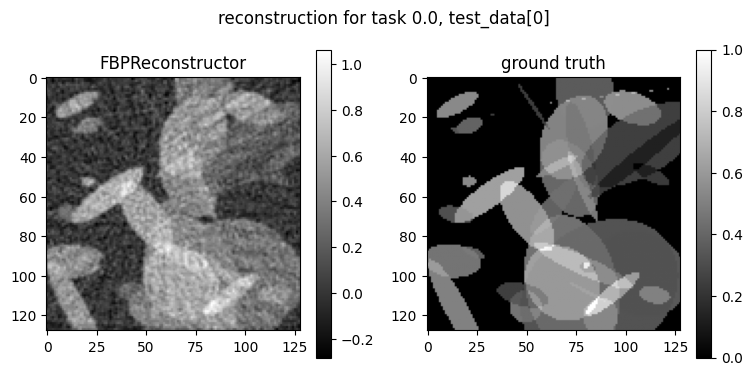

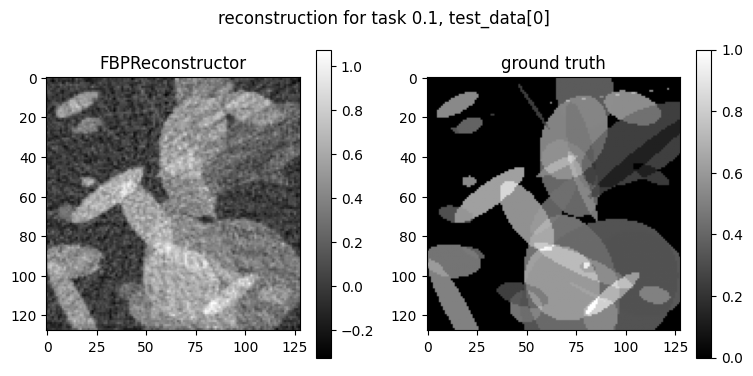

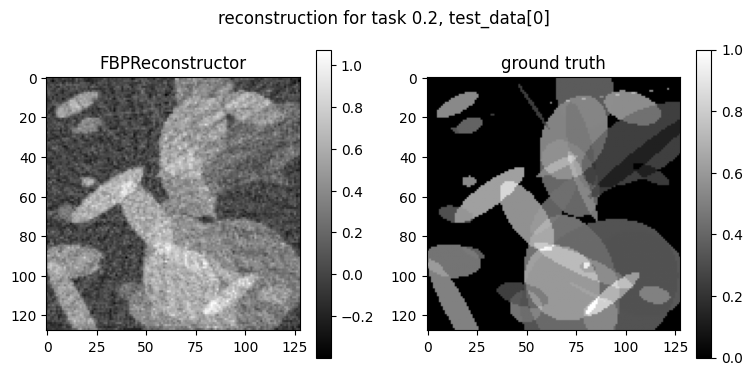

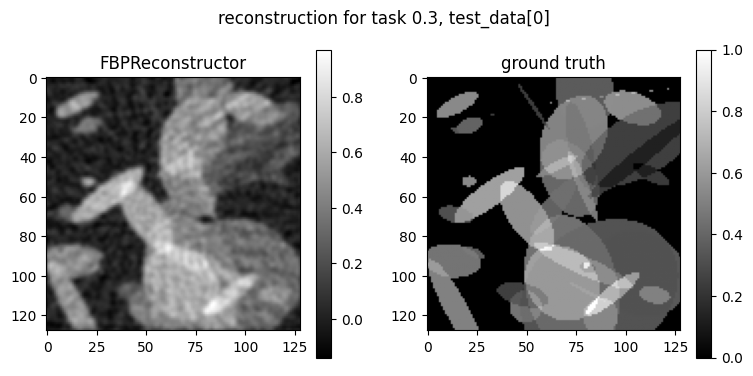

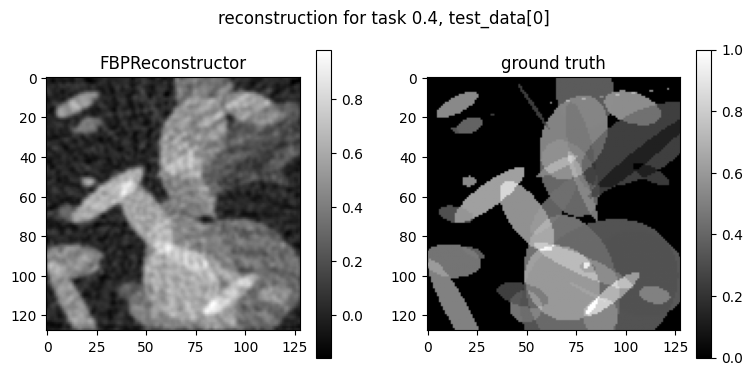

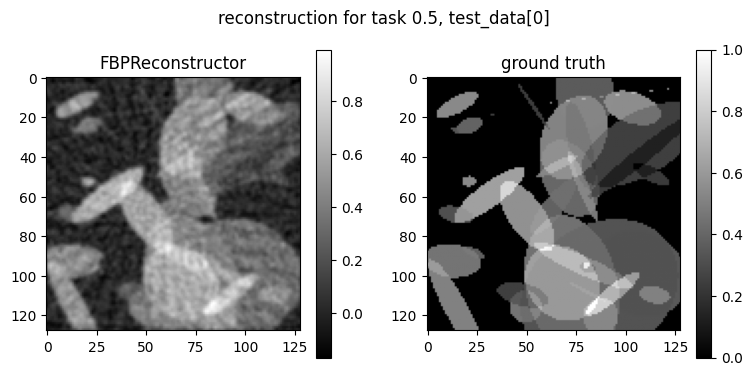

In [15]:
np.random.seed(0)

reconstructor_ = reconstructor_ellipses
# reconstructor_ = reconstructor_lodopab

test_data_ = test_data_ellipses
# test_data_ = test_data_10

# %% task table and reconstructors
eval_tt = TaskTable()

eval_tt.append(reconstructor=reconstructor_, measures=[PSNR, SSIM],
               test_data=test_data_,
               hyper_param_choices={'filter_type': ['Ram-Lak', 'Hann'],
                                    'frequency_scaling': [0.8, 0.9, 1.]})

# %% run task table
results = eval_tt.run()
print(results.to_string(show_columns=['misc']))  # best param : Hann 0.8

# %% plot reconstructions
fig = results.plot_all_reconstructions(test_ind=range(1),
                                       fig_size=(9, 4), vrange='individual')

running task 0/1 ...
sub-task 0/6 ...
sub-task 1/6 ...
sub-task 2/6 ...
sub-task 3/6 ...
sub-task 4/6 ...
sub-task 5/6 ...
ResultTable(results=
                          reconstructor       test_data                     measure_values                                                                 misc
task_ind sub_task_ind                                                                                                                                          
0        0             FBPReconstructor  test part 0:10  mean: {psnr: 27.08, ssim: 0.5211}  {'hp_choice': {'filter_type': 'Ram-Lak', 'frequency_scaling': 0.8}}
         1             FBPReconstructor  test part 0:10   mean: {psnr: 26.23, ssim: 0.487}  {'hp_choice': {'filter_type': 'Ram-Lak', 'frequency_scaling': 0.9}}
         2             FBPReconstructor  test part 0:10   mean: {psnr: 25.4, ssim: 0.4552}  {'hp_choice': {'filter_type': 'Ram-Lak', 'frequency_scaling': 1.0}}
         3             FBPReconstructor  test part 0:10 

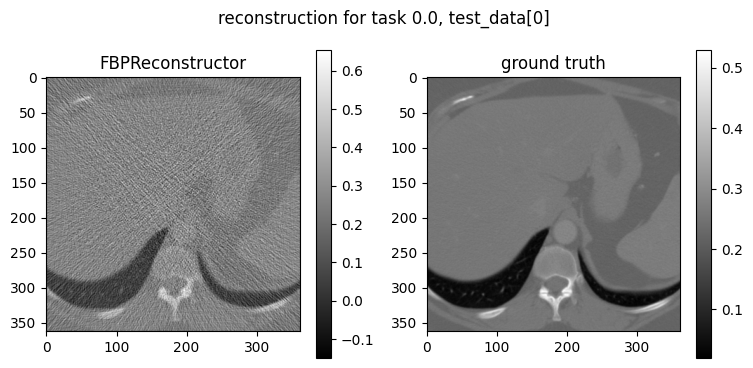

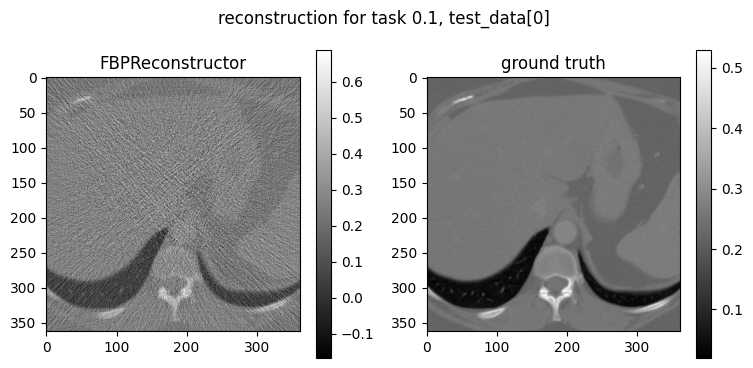

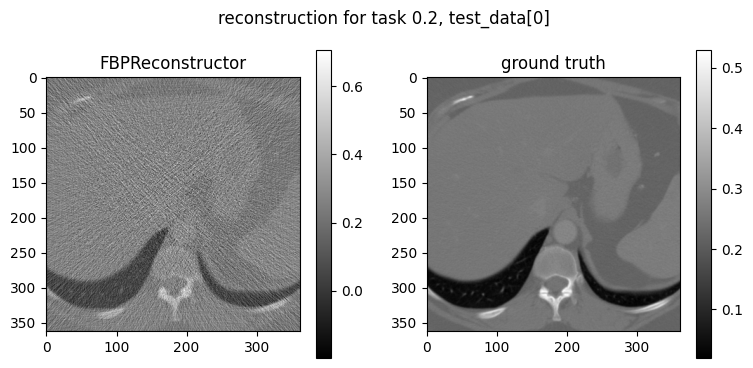

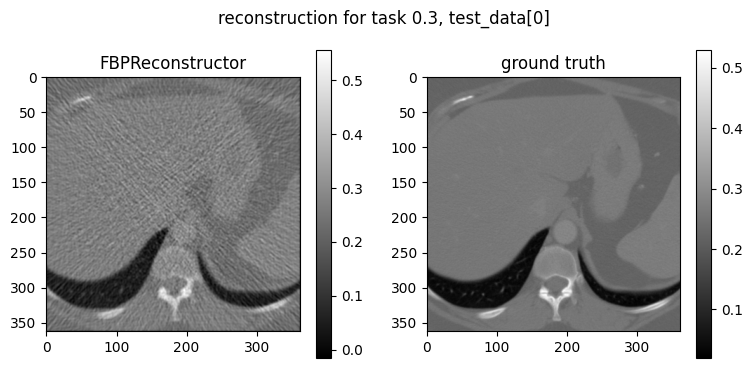

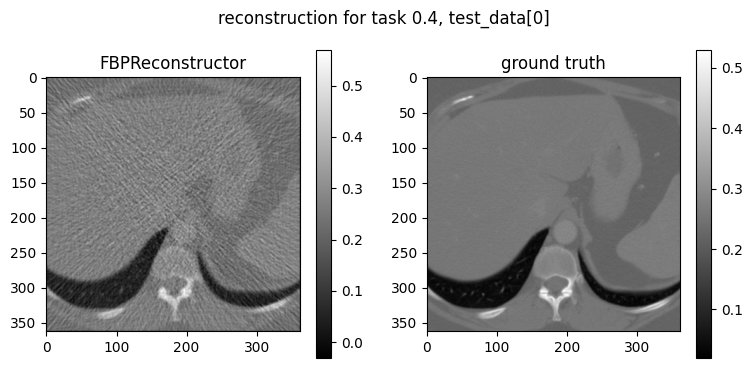

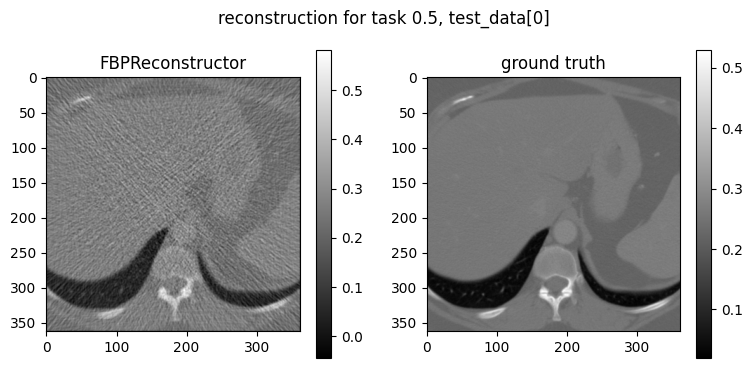

In [16]:
# %% task table and reconstructors
eval_tt = TaskTable()

eval_tt.append(reconstructor=reconstructor_lodopab, measures=[PSNR, SSIM],
               test_data=test_data_10,
               hyper_param_choices={'filter_type': ['Ram-Lak', 'Hann'],
                                    'frequency_scaling': [0.8, 0.9, 1.]})

# %% run task table
results = eval_tt.run()
print(results.to_string(show_columns=['misc'])) # best param : Hann 0.8

# %% plot reconstructions
fig = results.plot_all_reconstructions(test_ind=range(1),
                                       fig_size=(9, 4), vrange='individual')

running task 0/1 ...
sub-task 0/6 ...
sub-task 1/6 ...
sub-task 2/6 ...
sub-task 3/6 ...
sub-task 4/6 ...
sub-task 5/6 ...
ResultTable(results=
                          reconstructor           test_data                      measure_values                                                                 misc
task_ind sub_task_ind                                                                                                                                               
0        0             FBPReconstructor  shepp-logan + pois   mean: {psnr: 13.85, ssim: 0.1108}  {'hp_choice': {'filter_type': 'Ram-Lak', 'frequency_scaling': 0.8}}
         1             FBPReconstructor  shepp-logan + pois   mean: {psnr: 12.84, ssim: 0.1027}  {'hp_choice': {'filter_type': 'Ram-Lak', 'frequency_scaling': 0.9}}
         2             FBPReconstructor  shepp-logan + pois  mean: {psnr: 11.93, ssim: 0.09524}  {'hp_choice': {'filter_type': 'Ram-Lak', 'frequency_scaling': 1.0}}
         3             FBPRecon

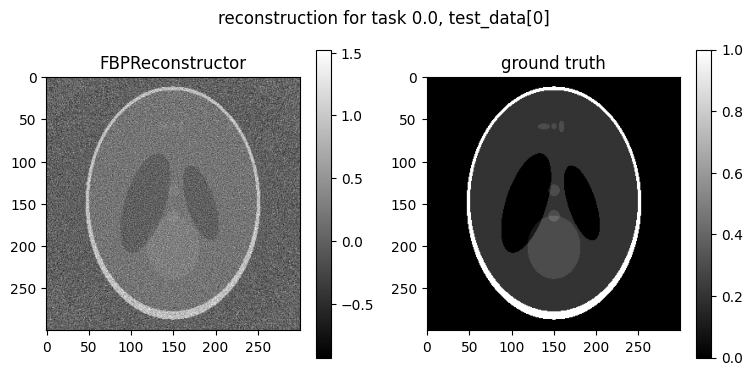

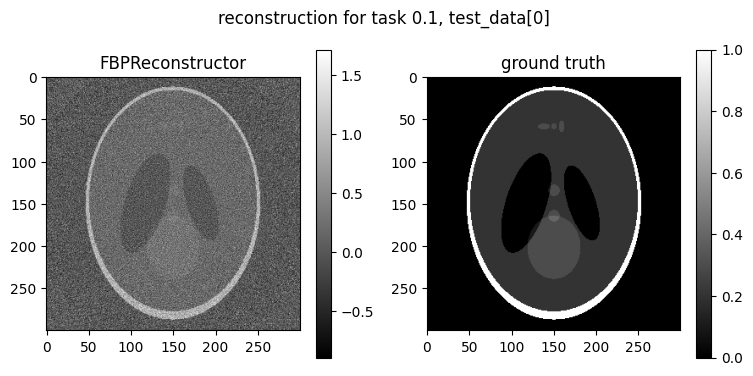

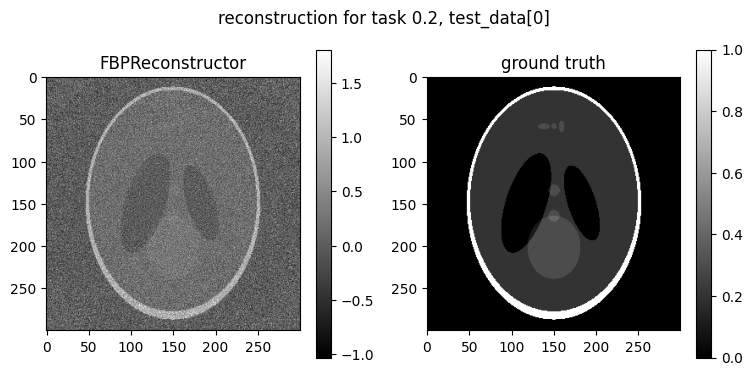

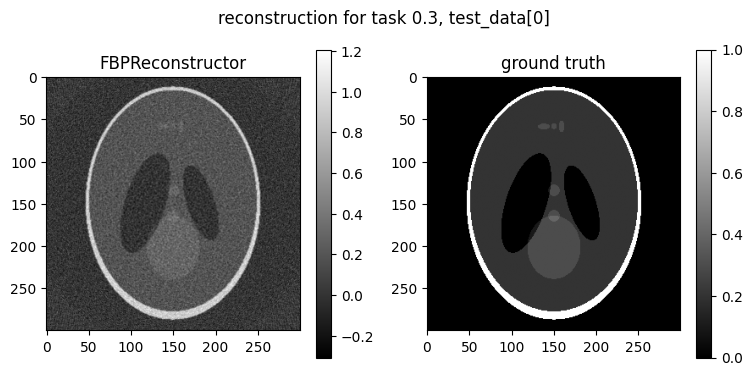

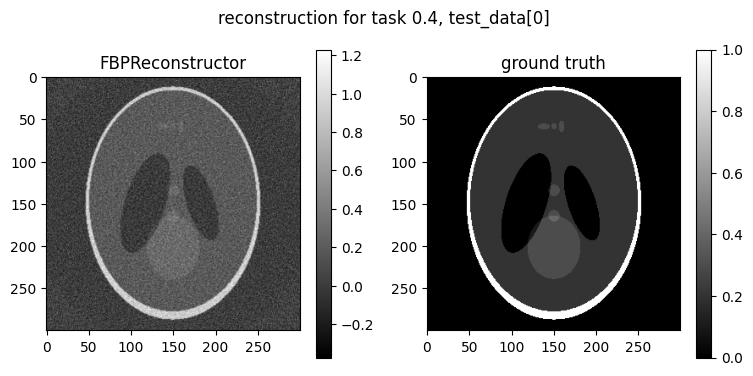

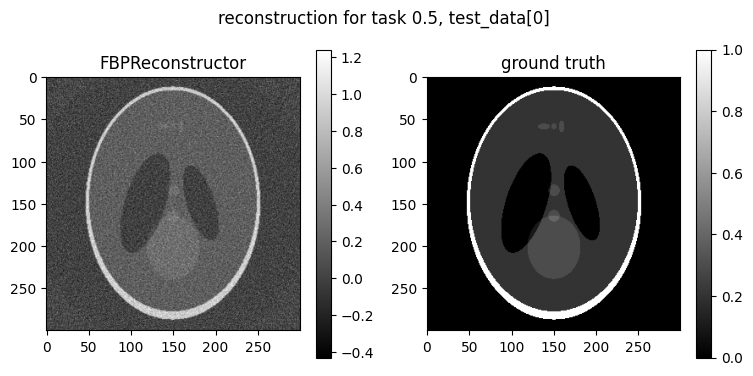

In [17]:
# %% task table and reconstructors
eval_tt = TaskTable()

eval_tt.append(reconstructor=reconstructor_shepp, measures=[PSNR, SSIM],
               test_data=test_data_shepp,
               hyper_param_choices={'filter_type': ['Ram-Lak', 'Hann'],
                                    'frequency_scaling': [0.8, 0.9, 1.]})

# %% run task table
results = eval_tt.run()
print(results.to_string(show_columns=['misc']))

# %% plot reconstructions
fig = results.plot_all_reconstructions(test_ind=range(1),
                                       fig_size=(9, 4), vrange='individual')

# EDA - Exploratory Data Analysis

In [18]:
def plot_ctrecn(test_data, recos2, psnrs_= None, visuals = 2):
  """takes in a datasset for gt, recos_ for obs, psnrs_ and visualize many images as defined."""
  print('whole eval mean psnr: {:f}'.format(np.mean(psnrs_))) if psnrs_ != None else None
  for i in range(visuals):
      _, ax = plot_images([recos2[i], test_data.ground_truth[i]],
                          fig_size=(10, 4))
      ax[0].set_xlabel('PSNR: {:.2f}'.format(psnrs_[i])) if psnrs_ != None else None
      ax[0].set_title('Reconstruction')
      ax[1].set_title('ground truth')
      ax[0].figure.suptitle('test sample {:d}'.format(i))

In [19]:
recos2 = []
# del reconstructor
# borrowing the reconstructor model for the moment
reconstructor = reconstructor_lodopab # (
    # ray_trafo_lodopab , hyper_params={'filter_type': 'Ram-Lak','frequency_scaling': 1.0}

with torch.no_grad(): # save memory by not calculating gradient
  for obs, gt in test_data_10:
      torch.cuda.ipc_collect() # collects unnecessary inter-process comm.s and free VRAM
      torch.cuda.empty_cache() # clear cache while iteration
      reco = reconstructor_lodopab.reconstruct(obs) # return odl elem H,W with normalized pixel vals
      recos2.append(reco)

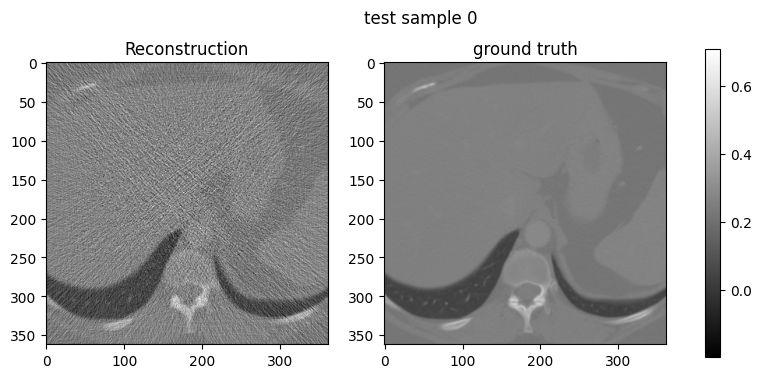

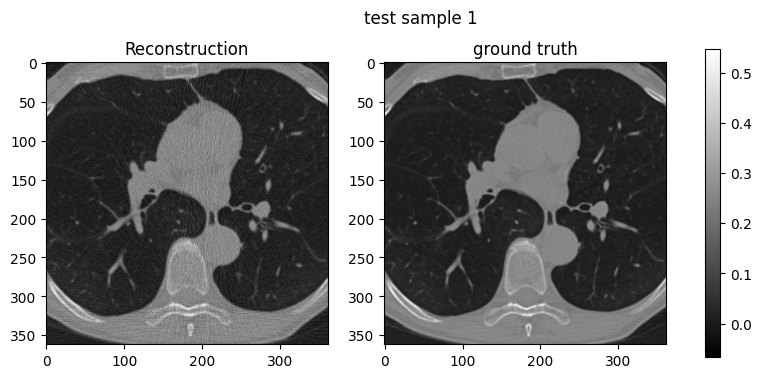

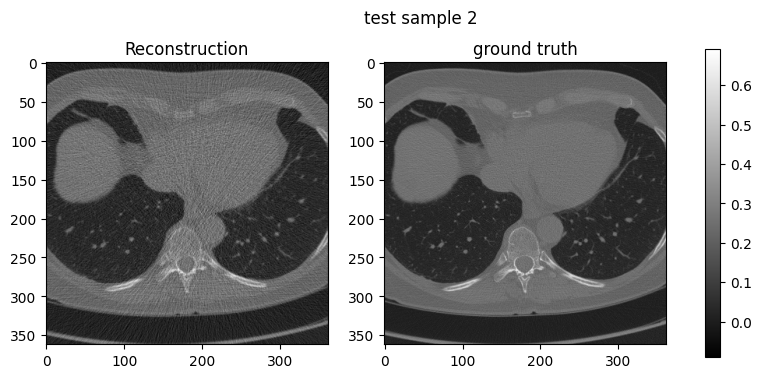

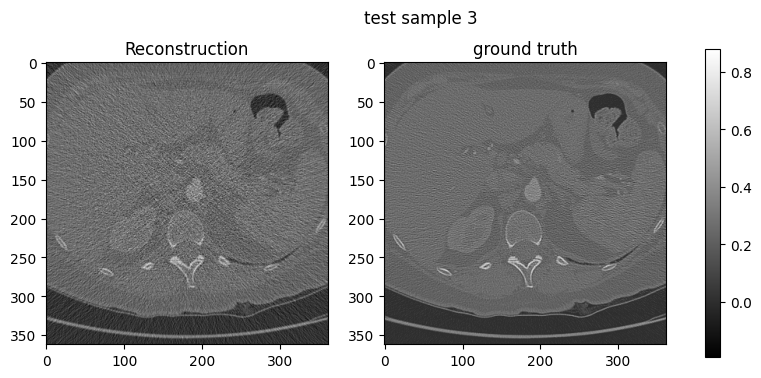

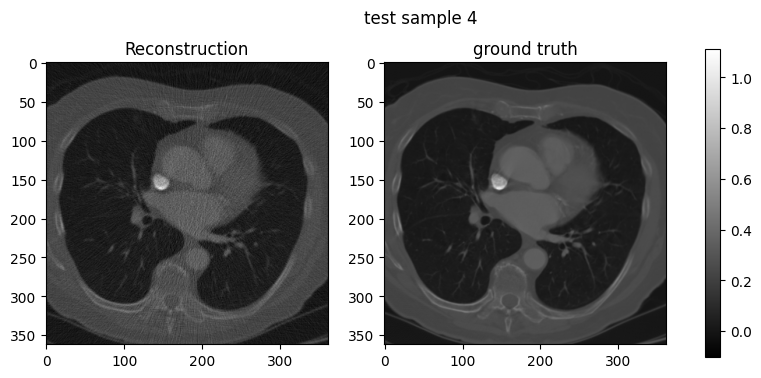

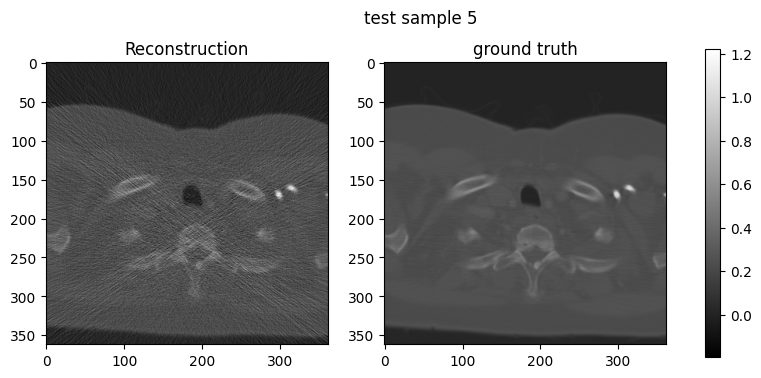

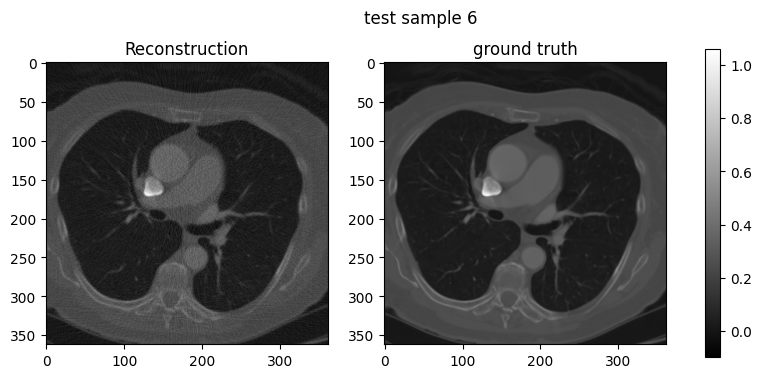

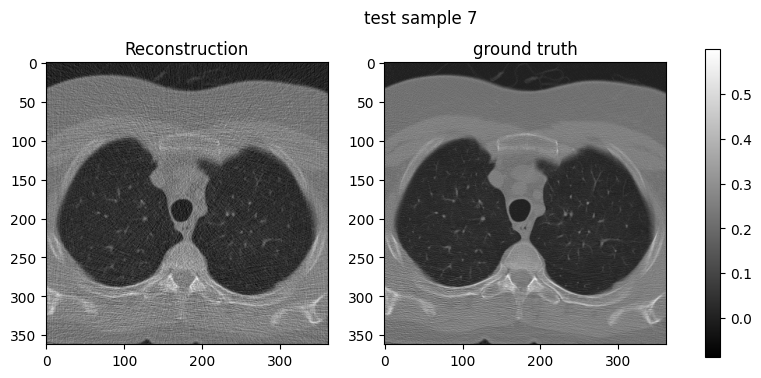

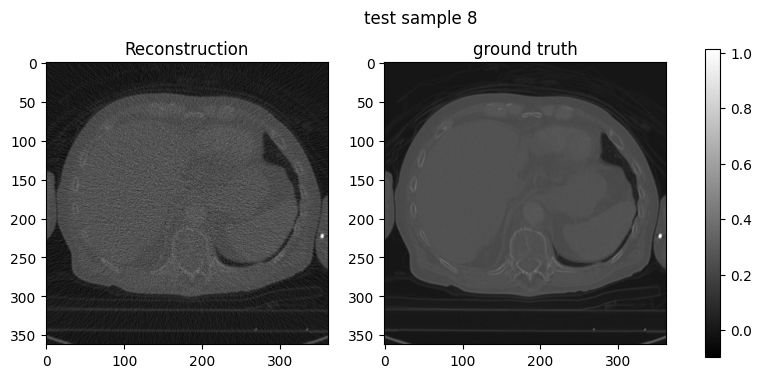

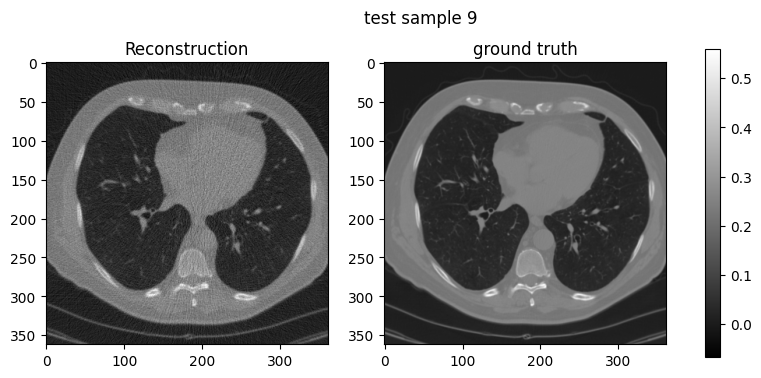

In [ ]:
plot_ctrecn(test_data_10, recos2,  visuals = 10)

# Experiment - simple Network

In [ ]:
# test cuda is running
x = torch.rand(5, 3)
print(x, '\n# test pytorch is functioning with cuda')

tensor([[0.9525, 0.6503, 0.9497],
        [0.2197, 0.3869, 0.6673],
        [0.5443, 0.8283, 0.7626],
        [0.9766, 0.0579, 0.6842],
        [0.3690, 0.5183, 0.7585]]) 
# test pytorch is functioning with cuda


In [ ]:
# from dival.util.odl_utility import uniform_discr_element
print( uniform_discr_element([0, 1, 2, 3, 4, 5, 6] ) )

[ 0.,  1.,  2., ...,  4.,  5.,  6.]


In [ ]:
uniform_discr_element([0, 1.5, 2.5, 3, 4, 5, 6] )

uniform_discr(-3.5, 3.5, 7).element(
    [ 0. ,  1.5,  2.5, ...,  4. ,  5. ,  6. ]
)

In [ ]:
L = np.random.rand(15)
L_discrete = uniform_discr_element(L)
print( L_discrete)

[ 0.5488135 ,  0.71518937,  0.60276338, ...,  0.56804456,  0.92559664,
  0.07103606]


In [ ]:
type( uniform_discr_element(L) )

odl.discr.discr_space.DiscretizedSpaceElement

In [ ]:
np.random.seed(1)

ground_truth = uniform_discr_element([0, 1, 2, 3, 4, 5, 6])
observation = ground_truth + 1
observation += np.random.normal(size=observation.shape)
test_data = DataPairs(observation, ground_truth, name='x + 1 + normal')
eval_tt = TaskTable()

running task 0/1 ...
ResultTable(results=
                      reconstructor       test_data     measure_values
task_ind sub_task_ind                                                 
0        0                      y-1  x + 1 + normal  mean: {l2: 3.679}
)


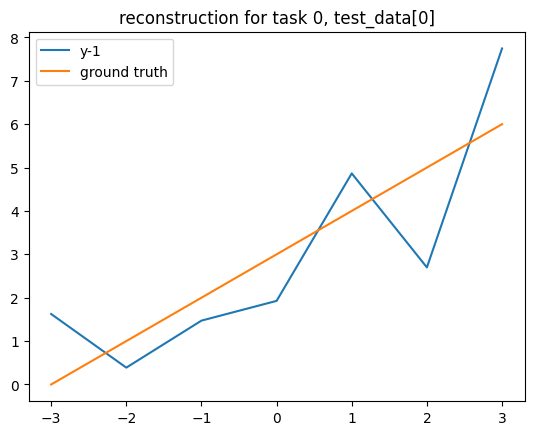

In [ ]:
class MinusOneReconstructor(Reconstructor):
    def reconstruct(self, observation):
        return observation - 1


reconstructor = MinusOneReconstructor(name='y-1')
eval_tt.append(reconstructor=reconstructor, test_data=test_data,
               measures=[L2])
results = eval_tt.run()
results.plot_reconstruction(0)
print(results)

# Experiment - Inferencing using published Networks and shepp-logan phantom CT scan

In [40]:
from dival.reconstructors.odl_reconstructors import (FBPReconstructor,
                                                     CGReconstructor,
                                                     GaussNewtonReconstructor,
                                                     LandweberReconstructor,
                                                     MLEMReconstructor,
                                                     ISTAReconstructor,
                                                     PDHGReconstructor,
                                                     DouglasRachfordReconstructor,
                                                     ForwardBackwardReconstructor,
                                                     ADMMReconstructor,
                                                     BFGSReconstructor)

In [ ]:
# print( np.random.seed(0) )
# odl.tomo.cone_beam_geometry?
# DataPairs?
# TaskTable?

running task 0/8 ...
running task 1/8 ...
running task 2/8 ...
running task 3/8 ...
running task 4/8 ...
running task 5/8 ...
running task 6/8 ...
running task 7/8 ...
ResultTable(results=
                                  reconstructor           test_data                      measure_values
task_ind sub_task_ind                                                                                  
0        0                     FBPReconstructor  shepp-logan + pois  mean: {psnr: 11.89, ssim: 0.09516}
1        0                      CGReconstructor  shepp-logan + pois   mean: {psnr: 17.73, ssim: 0.5474}
2        0             GaussNewtonReconstructor  shepp-logan + pois    mean: {psnr: 21.2, ssim: 0.4112}
3        0               LandweberReconstructor  shepp-logan + pois   mean: {psnr: 16.52, ssim: 0.3932}
4        0                    MLEMReconstructor  shepp-logan + pois   mean: {psnr: 14.26, ssim: 0.3239}
5        0                    ISTAReconstructor  shepp-logan + pois   mean: {psnr: 

<Axes: title={'center': 'peak signal-to-noise ratio'}>

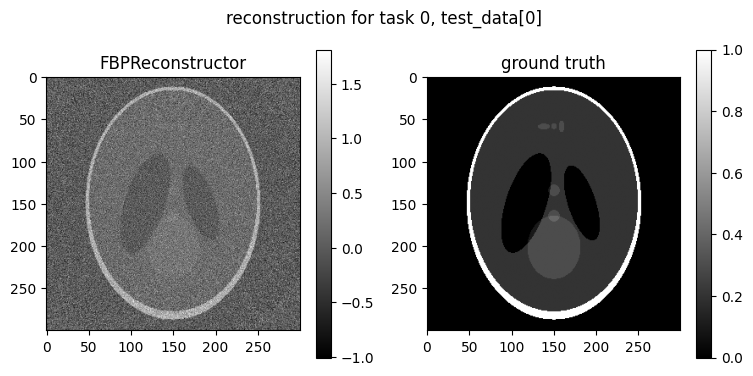

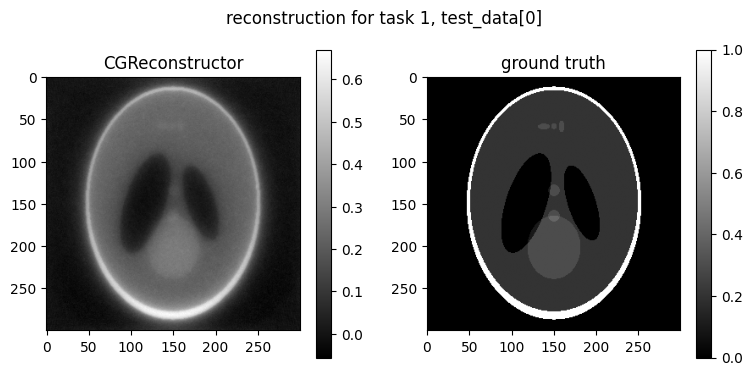

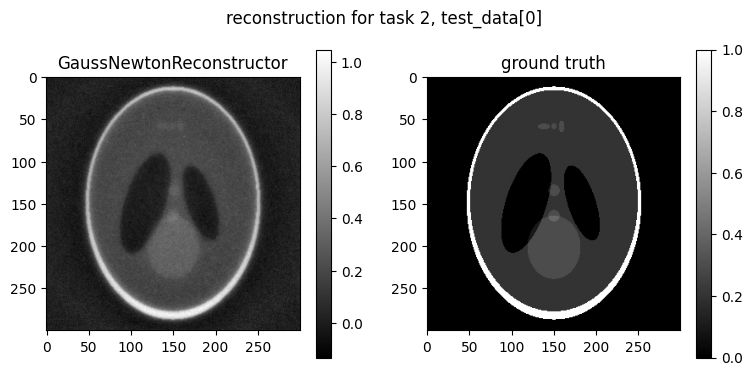

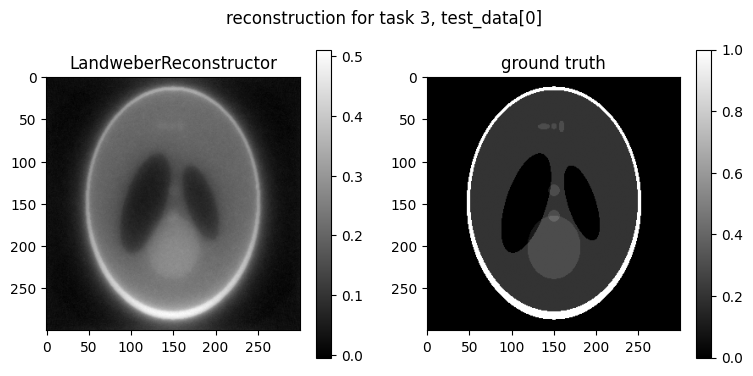

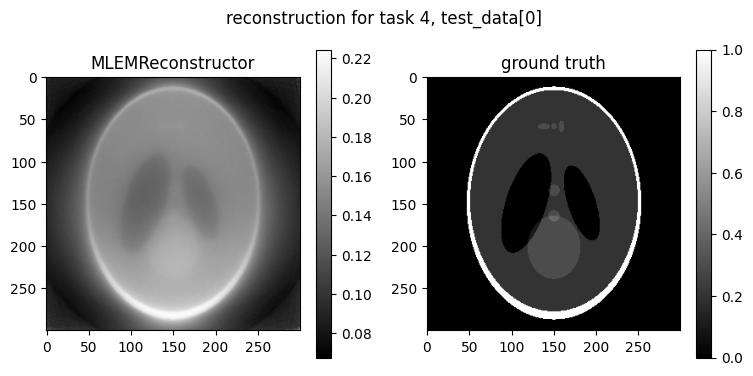

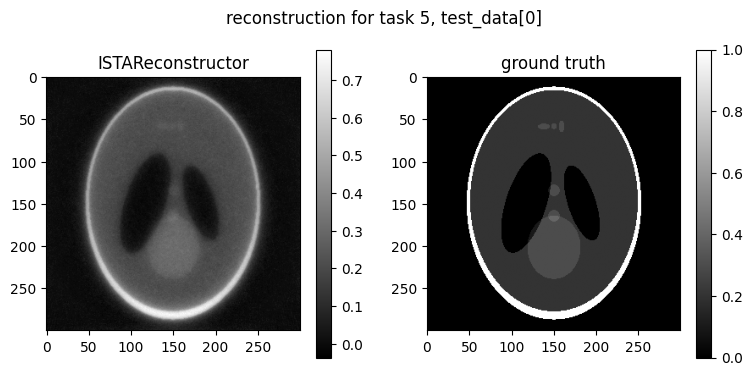

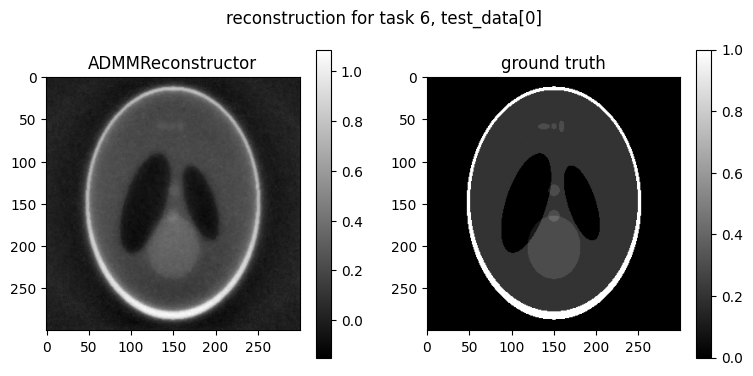

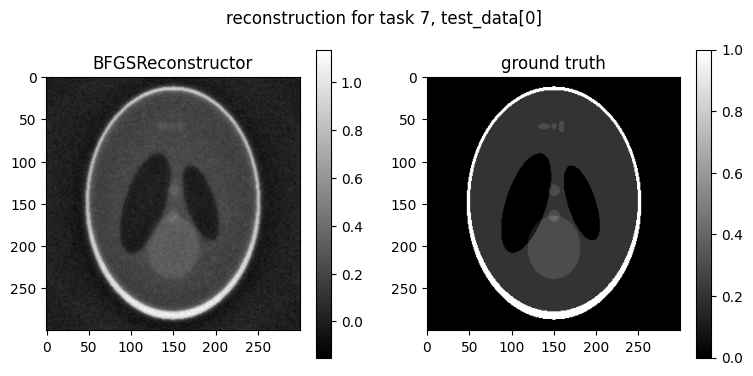

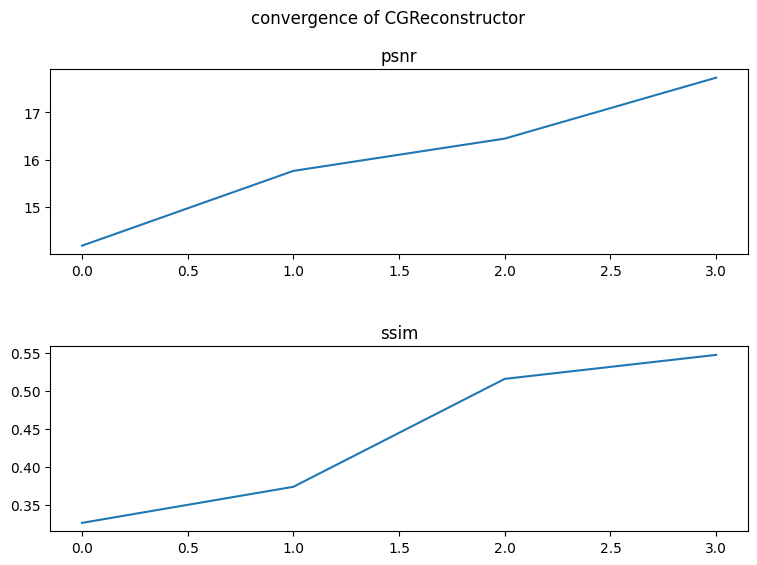

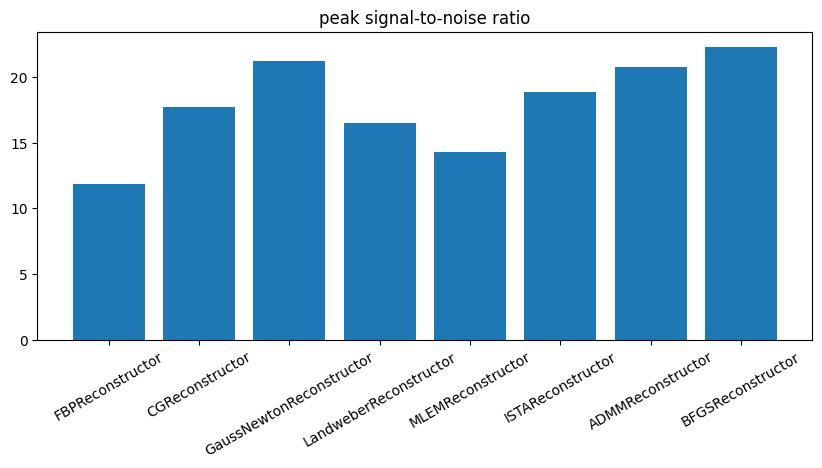

In [ ]:
np.random.seed(0) # to make pois noise in obs is consistent throughout reconstructors; fair evaluation hence.


# %% task table and reconstructors
eval_tt = TaskTable()
fbp_reconstructor = FBPReconstructor(ray_trafo_shepp)
cg_reconstructor = CGReconstructor(ray_trafo_shepp, reco_space_shepp.zero(), 4)
gn_reconstructor = GaussNewtonReconstructor(ray_trafo_shepp, reco_space_shepp.zero(), 2)
lw_reconstructor = LandweberReconstructor(ray_trafo_shepp, reco_space_shepp.zero(), 8)
mlem_reconstructor = MLEMReconstructor(ray_trafo_shepp, 0.5*reco_space_shepp.one(), 1)
ista_reconstructor = ISTAReconstructor(ray_trafo_shepp,reco_space_shepp.zero(), 10) # works
pdhg_reconstructor = PDHGReconstructor(ray_trafo_shepp, reco_space_shepp.zero(), 10) # operand issue
dougrach_reconstructor = DouglasRachfordReconstructor(ray_trafo_shepp,
                                                      reco_space_shepp.zero(), 10) # operand issue
forwardbackward_reconstructor = ForwardBackwardReconstructor(ray_trafo_shepp,
                                                      reco_space_shepp.zero(), 10) # operand issue
admm_reconstructor = ADMMReconstructor(ray_trafo_shepp, reco_space_shepp.zero(), 10) # works
bfgs_reconstructor = BFGSReconstructor(ray_trafo_shepp, reco_space_shepp.zero(), 10) # works

reconstructors = [fbp_reconstructor, cg_reconstructor, gn_reconstructor,
                  lw_reconstructor, mlem_reconstructor , ista_reconstructor , admm_reconstructor, bfgs_reconstructor] #,   pdhg_reconstructor, dougrach_reconstructor ,forwardbackward_reconstructor ]
                  # removed at 6-8 due to unsupported operand type(s) for +: 'MultiplyOperator' and 'DiscretizedSpaceElement'

options = {'save_iterates': True}

eval_tt.append_all_combinations(reconstructors=reconstructors,
                                test_data=[test_data_shepp], options=options) # original

# testing one reconstructor
# eval_tt.append_all_combinations(reconstructors=[dougrach_reconstructor],
#                                 test_data=[test_data_shepp], options=options)

# %% run task table
results = eval_tt.run()
results.apply_measures([PSNR, SSIM])
print(results)

# %% plot reconstructions
fig = results.plot_all_reconstructions(fig_size=(9, 4), vrange='individual')

# %% plot convergence of CG # comment out if testing one reconstructor
results.plot_convergence(1, fig_size=(9, 6), gridspec_kw={'hspace': 0.5})

# %% plot performance
results.plot_performance(PSNR, figsize=(10, 4))

In [ ]:
def inference_by_dataset_model (dataset_ = test_data_shepp, ray_trafo_=ray_trafo_shepp, reco_space_=reco_space_shepp):
  np.random.seed(0) # to make pois noise in obs is consistent throughout reconstructors; fair evaluation hence.
  # %% task table and reconstructors
  eval_tt = TaskTable()
  fbp_reconstructor = FBPReconstructor(ray_trafo_)
  cg_reconstructor = CGReconstructor(ray_trafo_, reco_space_.zero(), 4)
  gn_reconstructor = GaussNewtonReconstructor(ray_trafo_, reco_space_.zero(), 2)
  lw_reconstructor = LandweberReconstructor(ray_trafo_, reco_space_.zero(), 8)
  mlem_reconstructor = MLEMReconstructor(ray_trafo_, 0.5*reco_space_.one(), 1)
  ista_reconstructor = ISTAReconstructor(ray_trafo_,reco_space_.zero(), 10) # works
  pdhg_reconstructor = PDHGReconstructor(ray_trafo_, reco_space_.zero(), 10) # operand issue
  dougrach_reconstructor = DouglasRachfordReconstructor(ray_trafo_,
                                                        reco_space_.zero(), 10) # operand issue
  forwardbackward_reconstructor = ForwardBackwardReconstructor(ray_trafo_,
                                                        reco_space_.zero(), 10) # operand issue
  admm_reconstructor = ADMMReconstructor(ray_trafo_, reco_space_.zero(), 10) # works
  bfgs_reconstructor = BFGSReconstructor(ray_trafo_, reco_space_.zero(), 10) # works

  reconstructors = [fbp_reconstructor, cg_reconstructor, gn_reconstructor,
                    lw_reconstructor, mlem_reconstructor , ista_reconstructor , admm_reconstructor, bfgs_reconstructor] #,   pdhg_reconstructor, dougrach_reconstructor ,forwardbackward_reconstructor ]
                    # removed at 6-8 due to unsupported operand type(s) for +: 'MultiplyOperator' and 'DiscretizedSpaceElement'

  options = {'save_iterates': True, 'training': False}

  eval_tt.append_all_combinations(reconstructors=reconstructors,
                                  test_data= [dataset_], options=options) # original


  # %% run task table
  results = eval_tt.run()
  results.apply_measures([PSNR, SSIM])
  print(results)

  # # %% plot reconstructions
  # fig = results.plot_all_reconstructions(fig_size=(9, 4), vrange='individual')

  # # %% plot convergence of CG # comment out if testing one reconstructor
  # results.plot_convergence(1, fig_size=(9, 6), gridspec_kw={'hspace': 0.5})

  # # %% plot performance
  # results.plot_performance(PSNR, figsize=(10, 4))


In [ ]:
# inference_by_dataset_model()

running task 0/8 ...
running task 1/8 ...
running task 2/8 ...
running task 3/8 ...
running task 4/8 ...
running task 5/8 ...
running task 6/8 ...
running task 7/8 ...
ResultTable(results=
                                  reconstructor           test_data                      measure_values
task_ind sub_task_ind                                                                                  
0        0                     FBPReconstructor  shepp-logan + pois  mean: {psnr: 11.89, ssim: 0.09516}
1        0                      CGReconstructor  shepp-logan + pois   mean: {psnr: 17.73, ssim: 0.5474}
2        0             GaussNewtonReconstructor  shepp-logan + pois    mean: {psnr: 21.2, ssim: 0.4112}
3        0               LandweberReconstructor  shepp-logan + pois   mean: {psnr: 16.52, ssim: 0.3932}
4        0                    MLEMReconstructor  shepp-logan + pois   mean: {psnr: 14.26, ssim: 0.3239}
5        0                    ISTAReconstructor  shepp-logan + pois   mean: {psnr: 

In [69]:
def inference_by_mult_datasets_models( inf_published = True, oth_recons=[], dataset_list = [dataset_ellipses, dataset], test_data_list = [test_data_ellipses, test_data_10], plot = False):

  for i in range(len(dataset_list)):

    def inference_by_dataset_model_core (test_data_ = test_data_list[i], ray_trafo_=dataset_list[i].get_ray_trafo(impl=IMPL), reco_space_=dataset_list[i].get_ray_trafo(impl=IMPL).domain):

      np.random.seed(0) # to make pois noise in obs is consistent throughout reconstructors; fair evaluation hence.
      # %% task table

      eval_tt = TaskTable()

      fbp_reconstructor = FBPReconstructor(ray_trafo_)
      cg_reconstructor = CGReconstructor(ray_trafo_, reco_space_.zero(), 4)
      gn_reconstructor = GaussNewtonReconstructor(ray_trafo_, reco_space_.zero(), 2)
      lw_reconstructor = LandweberReconstructor(ray_trafo_, reco_space_.zero(), 8)
      mlem_reconstructor = MLEMReconstructor(ray_trafo_, 0.5*reco_space_.one(), 1)
      ista_reconstructor = ISTAReconstructor(ray_trafo_,reco_space_.zero(), 10) # works
      pdhg_reconstructor = PDHGReconstructor(ray_trafo_, reco_space_.zero(), 10) # operand issue
      dougrach_reconstructor = DouglasRachfordReconstructor(ray_trafo_,
                                                            reco_space_.zero(), 10) # operand issue
      forwardbackward_reconstructor = ForwardBackwardReconstructor(ray_trafo_,
                                                            reco_space_.zero(), 10) # operand issue
      admm_reconstructor = ADMMReconstructor(ray_trafo_, reco_space_.zero(), 10) # works
      bfgs_reconstructor = BFGSReconstructor(ray_trafo_, reco_space_.zero(), 10) # works

      options = {'save_iterates': True, 'skip_training': True}

      # admm_reconstructor, ,  bfgs_reconstructor - runs into a loop when run for whole dataset
      recons_published = [ fbp_reconstructor, gn_reconstructor, ista_reconstructor, cg_reconstructor, lw_reconstructor, mlem_reconstructor, admm_reconstructor ,  bfgs_reconstructor ] #,  admm_reconstructor ,  bfgs_reconstructor - runs into OOM when run for whole dataset # cg_reconstructor, lw_reconstructor, mlem_reconstructor , OOM only when run for lodopab whole # pdhg_reconstructor, dougrach_reconstructor ,forwardbackward_reconstructor was
                        # removed at 6-8 due to unsupported operand type(s) for +: 'MultiplyOperator' and 'DiscretizedSpaceElement' # working w/ low mem - fbp_reconstructor, gn_reconstructor,

      recons=[]
      if inf_published:
        recons=recons_published
      recons = recons+oth_recons

      eval_tt.append_all_combinations(reconstructors=recons,
                                      test_data= [test_data_], options=options)


      # %% run task table
      results = eval_tt.run()
      results.apply_measures([PSNR, SSIM])
      print(results)

      if plot:
        # %% plot reconstructions
        fig = results.plot_all_reconstructions(fig_size=(9, 4), vrange='individual')

        # %% plot convergence of CG # comment out if testing one reconstructor
        # results.plot_convergence(1, fig_size=(9, 6), gridspec_kw={'hspace': 0.5})
        # cannot iterate over results in oth models

        # %% plot performance
        results.plot_performance(PSNR, figsize=(10, 4))

    inference_by_dataset_model_core()

In [67]:
inference_by_mult_datasets_models( dataset_list = [dataset_ellipses, dataset], test_data_list = [test_data_ellipses, test_data_2], plot=True) # Beware of OOM Out of Memory

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# inference_by_mult_datasets_models( dataset_list = [dataset], test_data_list = [test_data_all])

running task 0/1 ...
ResultTable(results=
                           reconstructor  test_data                      measure_values
task_ind sub_task_ind                                                                  
0        0             ISTAReconstructor  test part  mean: {psnr: 10.25, ssim: 0.07306}
)


In [ ]:
print( type(  L_discrete))
L2 = [ L_discrete + (-1) * L_discrete for i in range (5) ]
print (L2 )

<class 'odl.discr.discr_space.DiscretizedSpaceElement'>
[uniform_discr(-7.5, 7.5, 15).element(
    [ 0.,  0.,  0., ...,  0.,  0.,  0.]
), uniform_discr(-7.5, 7.5, 15).element(
    [ 0.,  0.,  0., ...,  0.,  0.,  0.]
), uniform_discr(-7.5, 7.5, 15).element(
    [ 0.,  0.,  0., ...,  0.,  0.,  0.]
), uniform_discr(-7.5, 7.5, 15).element(
    [ 0.,  0.,  0., ...,  0.,  0.,  0.]
), uniform_discr(-7.5, 7.5, 15).element(
    [ 0.,  0.,  0., ...,  0.,  0.,  0.]
)]


In [ ]:
L2 = uniform_discr_element(L2)
(-1) * L_discrete

uniform_discr(-7.5, 7.5, 15).element(
    [-0.5488135 , -0.71518937, -0.60276338, ..., -0.56804456, -0.92559664,
     -0.07103606]
)

# Experiment - Training CT reconstruction Networks - IradonMap: an Inverse Radon Map model

In [20]:
"""
Train IRadonMapReconstructor on 'lodopab'.
"""
from dival.reconstructors.iradonmap_reconstructor import IRadonMapReconstructor
from dival.reference_reconstructors import (
    check_for_params, download_params, get_hyper_params_path)

In [21]:
# del LOG_DIR
# del SAVE_BEST_LEARNED_PARAMS_PATH

LOG_DIR_iradonmap = '../../logs_17Sep/lodopab_iradonmap'
SAVE_BEST_LEARNED_PARAMS_PATH_iradonmap = '../../params_17Sep/lodopab_iradonmap'

In [22]:
iradonmap_reconstructor = IRadonMapReconstructor(
    ray_trafo_lodopab, log_dir=LOG_DIR_iradonmap,
    save_best_learned_params_path=SAVE_BEST_LEARNED_PARAMS_PATH_iradonmap)

#%% TRAIN - obtain reference hyper parameters
if not check_for_params('iradonmap', 'lodopab', include_learned=True): # learned True to down wts
    download_params('iradonmap', 'lodopab', include_learned=True)
hyper_params_path = get_hyper_params_path('iradonmap', 'lodopab')
iradonmap_reconstructor.load_hyper_params(hyper_params_path)

In [ ]:
print( iradonmap_reconstructor.hyper_params )

{'epochs': 150, 'batch_size': 2, 'lr': 0.01, 'normalize_by_opnorm': False, 'scales': 5, 'skip_channels': 4, 'fully_learned': True, 'use_sigmoid': False}


In [ ]:
iradonmap_reconstructor.hyper_params['epochs'] = 1
# iradonmap_reconstructor.hyper_params['batch_size'] = 2 # OOM when more than 2
print( iradonmap_reconstructor.hyper_params )

{'epochs': 1, 'batch_size': 2, 'lr': 0.01, 'normalize_by_opnorm': False, 'scales': 5, 'skip_channels': 4, 'fully_learned': True, 'use_sigmoid': False}


In [ ]:
#%% TRAINING MODEL
# iradonmap_reconstructor.train(dataset) # make sure 14GB VRAM is available

In [ ]:
"""
To use the trained model for inference without retraining, you need to load the saved parameters. The `IRadonMapReconstructor` saves the best learned parameters during training to the path specified by `save_best_learned_params_path`. You can then load these parameters using the `load_learned_params` method and use the `reconstruct` method on new observations.
"""

'\nTo use the trained model for inference without retraining, you need to load the saved parameters. The `IRadonMapReconstructor` saves the best learned parameters during training to the path specified by `save_best_learned_params_path`. You can then load these parameters using the `load_learned_params` method and use the `reconstruct` method on new observations.\n'

In [23]:
# Load the trained parameters if u've already trained the model
iradonmap_reconstructor.load_learned_params(SAVE_BEST_LEARNED_PARAMS_PATH_iradonmap)

# Hyper param load
# iradonmap_reconstructor.load_params(SAVE_BEST_LEARNED_PARAMS_PATH_iradonmap)

# Assuming you have a new observation 'new_obs'
# new_obs = ...

# Reconstruct using the loaded model
# reconstructed_image = reconstructor.reconstruct(new_obs)

# You can then evaluate the reconstructed image as needed
# psnr = PSNR(reconstructed_image, ground_truth_of_new_obs)
# print('PSNR for new observation: {:f}'.format(psnr))

mean psnr: 30.403244


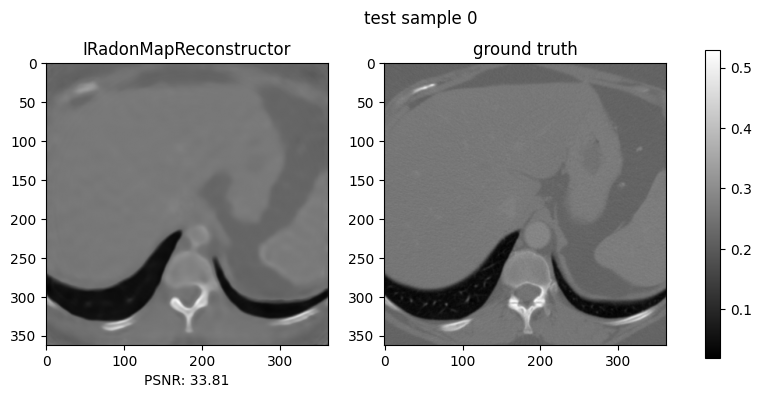

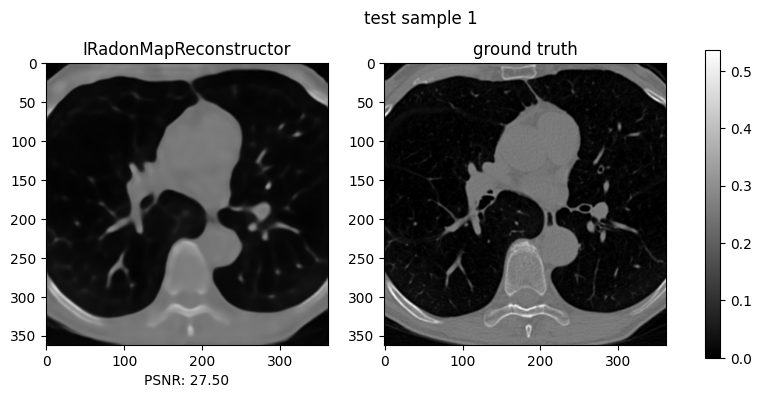

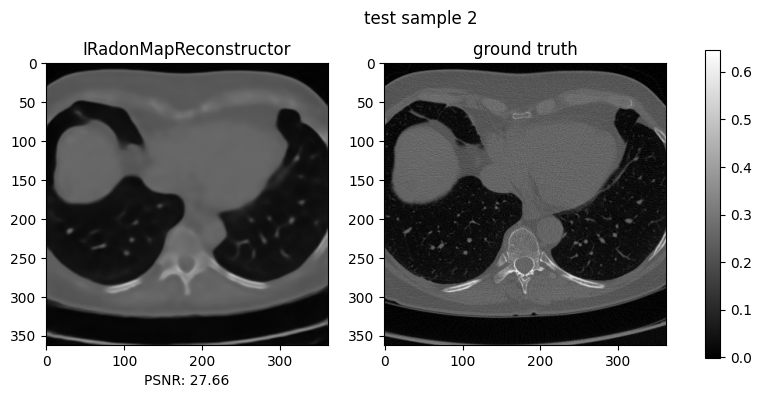

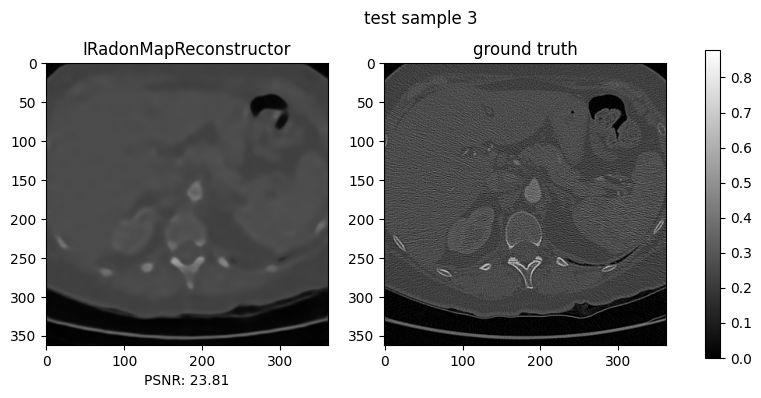

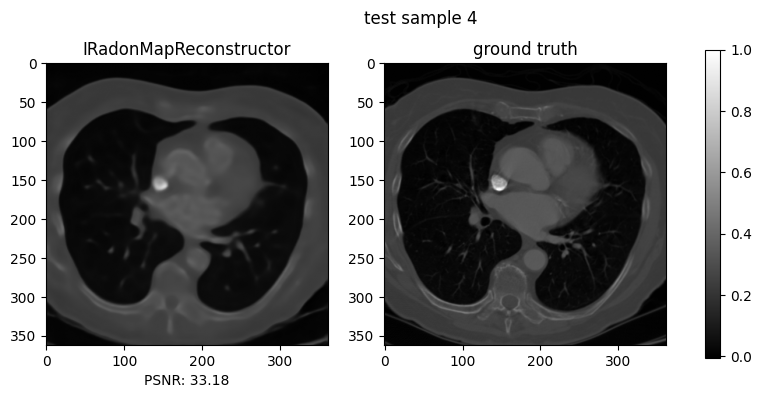

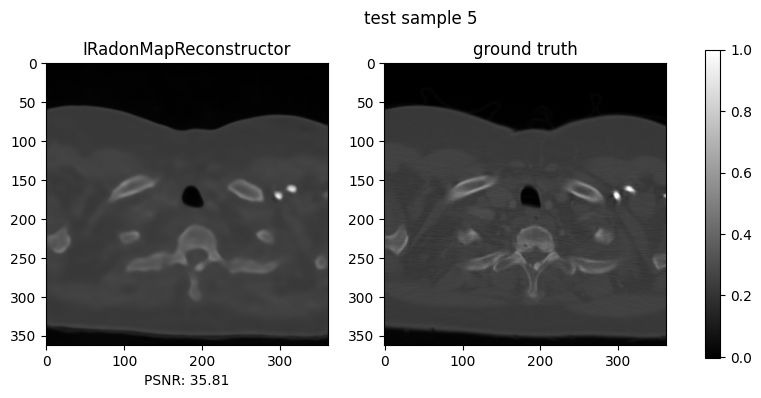

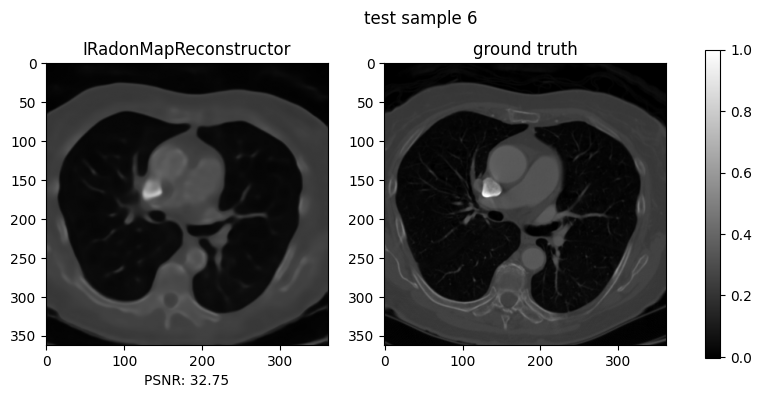

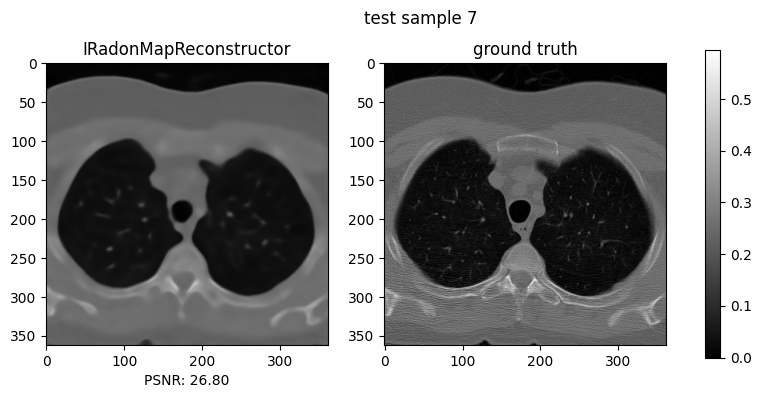

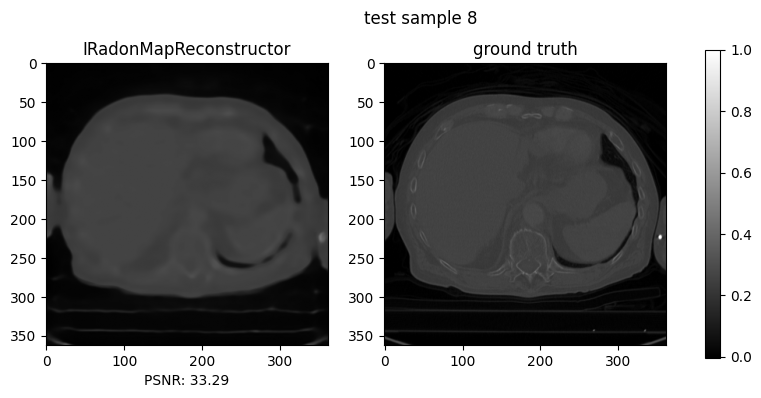

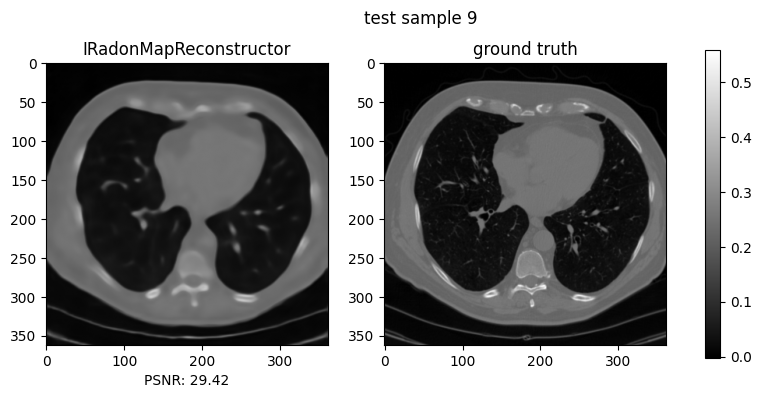

In [24]:
#%% evaluate
recos = []
psnrs = []
for obs, gt in test_data_10:
    reco = iradonmap_reconstructor.reconstruct(obs)
    recos.append(reco)
    psnrs.append(PSNR(reco, gt))

print('mean psnr: {:f}'.format(np.mean(psnrs)))

for i in range(10):
    _, ax = plot_images([recos[i], test_data_10.ground_truth[i]],
                        fig_size=(10, 4))
    ax[0].set_xlabel('PSNR: {:.2f}'.format(psnrs[i]))
    ax[0].set_title('IRadonMapReconstructor')
    ax[1].set_title('ground truth')
    ax[0].figure.suptitle('test sample {:d}'.format(i))

# Experiment - Training Grand Challenge winner - LearnedPrimalDual Neural Network

In [92]:
"""
Train LearnedPDReconstructor on 'lodopab'.
"""
from dival.reconstructors.learnedpd_reconstructor import LearnedPDReconstructor
from dival.reference_reconstructors import (
    check_for_params, download_params, get_hyper_params_path)

In [93]:
# pip install git+https://github.com/odlgroup/odl.git # went from odl stable 0.82 to for the night build 1.00dev

In [94]:
# import odl.contrib.torch.operator as odlt # fix notes below
"""
  issue fix for This comes from odl/contrib/torch/operator.py in your odl==0.8.2 installation.
  That means in this release, the symbol AVOID_UNNECESSARY_COPY was referenced but not actually defined or imported properly.

  if not hasattr(odlt, "AVOID_UNNECESSARY_COPY"):
      # False is the safe option: numpy.astype(copy=False) avoids forced copies.
      # If you find correctness issues, set to True (forces a copy).
      odlt.AVOID_UNNECESSARY_COPY = False
"""

'\n  issue fix for This comes from odl/contrib/torch/operator.py in your odl==0.8.2 installation.\n  That means in this release, the symbol AVOID_UNNECESSARY_COPY was referenced but not actually defined or imported properly.\n\n  if not hasattr(odlt, "AVOID_UNNECESSARY_COPY"):\n      # False is the safe option: numpy.astype(copy=False) avoids forced copies.\n      # If you find correctness issues, set to True (forces a copy).\n      odlt.AVOID_UNNECESSARY_COPY = False\n'

In [95]:
# if not hasattr(odlt, "AVOID_UNNECESSARY_COPY"): # fix notes above
    # False is the safe option: numpy.astype(copy=False) avoids forced copies.
    # If you find correctness issues, set to True (forces a copy).
    # odlt.AVOID_UNNECESSARY_COPY = False

In [96]:
# bug fix in reconstructor.train(dataset)
# NameError: name 'AVOID_UNNECESSARY_COPY' is raised because the variable AVOID_UNNECESSARY_COPYis referenced insideodl.contrib.torch.operator.OperatorFunction.forwardbut is not defined in the module namespace at runtime. In plain terms: the ODL torch wrapper code expects a module-global boolean namedAVOID_UNNECESSARY_COPYbut it isn’t there (either because of a packaging/version mismatch or a missing import/initialization), so when execution reaches the line that uses it (used as thecopy=argument tonp.astype(...)) Python raises NameError. The ODL torch operator layer code lives in odl.contrib.torch.operator` (example code in the repo).

import odl.contrib.torch.operator as odl_op
# Set to False to allow numpy astype to not copy when possible.
# Set to True if you want to force copies (safer if you see strange in-place behavior).
odl_op.AVOID_UNNECESSARY_COPY = False

In [97]:
# IMPL = 'astra_cpu' # for drive CPUs

# if running locally
# os.getcwd()
LOG_DIR_learnedpd = '../../logs/lodopab_learnedpd'
SAVE_BEST_LEARNED_PARAMS_PATH_learnedpd = '../../params/lodopab_learnedpd'

# # if running in drive
# # os.getcwd()
# # %cd '/content/drive/MyDrive/Colab Notebooks/Restormer_1209/Denoising'
# LOG_DIR = '/content/drive/MyDrive/Colab Notebooks/Restormer_1209/Denoising/experiments/lodopab_learnedpd/logs'
# SAVE_BEST_LEARNED_PARAMS_PATH = '/content/drive/MyDrive/Colab Notebooks/Restormer_1209/Denoising/experiments/lodopab_learnedpd/params'

# del reconstructor
# if in drive give dir: /content/drive/MyDrive/Colab Notebooks/Restormer_1209/Denoising/y
learnedpd_reconstructor = LearnedPDReconstructor(
    ray_trafo_lodopab, log_dir=LOG_DIR_learnedpd,
    save_best_learned_params_path=SAVE_BEST_LEARNED_PARAMS_PATH_learnedpd)

#%% obtain reference hyper parameters if training, else comment out

# if not check_for_params('learnedpd', 'lodopab', include_learned=False): # learned True -> down wts/ pt?
    # download_params('learnedpd', 'lodopab', include_learned=False)
# hyper_params_path = get_hyper_params_path('learnedpd', 'lodopab')
# learnedpd_reconstructor.load_hyper_params(hyper_params_path)

In [98]:
print( learnedpd_reconstructor.hyper_params )
learnedpd_reconstructor.hyper_params['epochs'] = 1
print( learnedpd_reconstructor.hyper_params )

{'epochs': 20, 'batch_size': 5, 'lr': 0.001, 'normalize_by_opnorm': True, 'lr_min': 0.0, 'niter': 10, 'init_fbp': False, 'init_filter_type': 'Hann', 'init_frequency_scaling': 0.4, 'nprimal': 5, 'ndual': 5, 'use_sigmoid': False, 'nlayer': 3, 'internal_ch': 32, 'kernel_size': 3, 'batch_norm': False, 'prelu': True, 'lrelu_coeff': 0.2}
{'epochs': 1, 'batch_size': 5, 'lr': 0.001, 'normalize_by_opnorm': True, 'lr_min': 0.0, 'niter': 10, 'init_fbp': False, 'init_filter_type': 'Hann', 'init_frequency_scaling': 0.4, 'nprimal': 5, 'ndual': 5, 'use_sigmoid': False, 'nlayer': 3, 'internal_ch': 32, 'kernel_size': 3, 'batch_norm': False, 'prelu': True, 'lrelu_coeff': 0.2}


In [ ]:
#%% TRAINING MODEL
# learnedpd_reconstructor.train(dataset)

epoch 1: 100%|██████████████████████████| 3522/3522 [12:50<00:00,  4.57it/s, phase=validation, loss=0.000123, psnr=36.5]

Best val psnr: 36.529610


In [100]:
# if already trained, load weights

if not check_for_params('learnedpd', 'lodopab'):
    download_params('learnedpd', 'lodopab')
params_path = get_params_path('learnedpd', 'lodopab')
learnedpd_reconstructor.load_params(params_path)
# pt path '/home/hiran/.dival/reference_params/lodopab/lodopab_learnedpd'

mean psnr: 37.218575


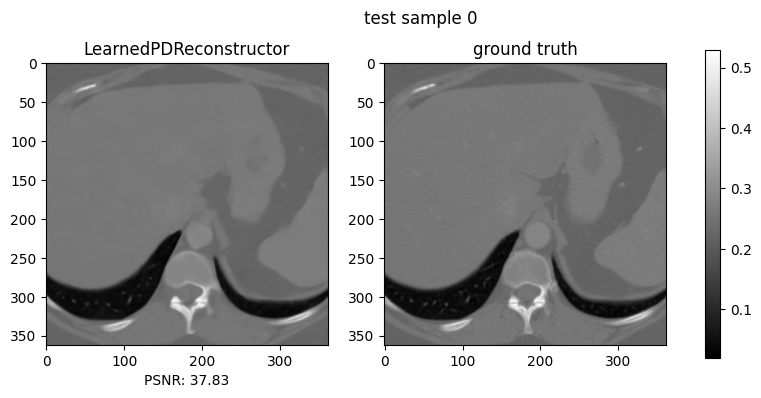

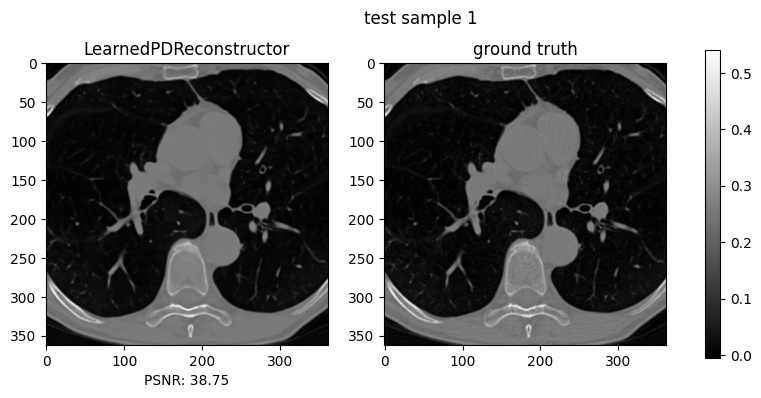

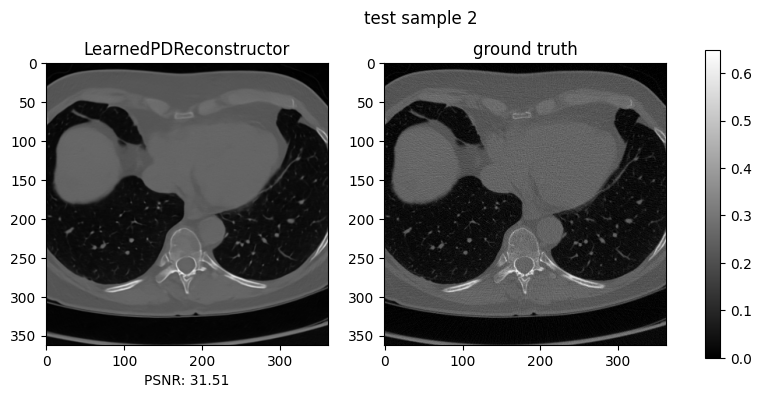

In [101]:
#%% evaluate
recos = []
psnrs = []
for obs, gt in test_data_10:
    reco = learnedpd_reconstructor.reconstruct(obs)
    recos.append(reco)
    psnrs.append(PSNR(reco, gt))

print('mean psnr: {:f}'.format(np.mean(psnrs)))

for i in range(3):
    _, ax = plot_images([recos[i], test_data_10.ground_truth[i]],
                        fig_size=(10, 4))
    ax[0].set_xlabel('PSNR: {:.2f}'.format(psnrs[i]))
    ax[0].set_title('LearnedPDReconstructor')
    ax[1].set_title('ground truth')
    ax[0].figure.suptitle('test sample {:d}'.format(i))

#### Experimenting on training setup

- epoch 1: 100%|███████████████████████████| 35820/35820 [5:17:38<00:00,  1.88it/s, phase=train, loss=0.000176, psnr=35.4]
- epoch 1: 100%|██████████████████████████| 3522/3522 [12:50<00:00,  4.57it/s, phase=validation, loss=0.000123, psnr=36.5]Best val psnr: 36.529610

In [ ]:
learnedpd_reconstructor.train??
type(learnedpd_reconstructor)

dival.reconstructors.learnedpd_reconstructor.LearnedPDReconstructor

#### Learnedpd train code - original

In [ ]:
# Learned Primal-Dual Reconstruction
# Adler J, Öktem O
# IEEE Transactions on Medical Imaging (2018)

# Signature: reconstructor.train(dataset)
# File:      /usr/local/lib/python3.12/dist-packages/dival/reconstructors/standard_learned_reconstructor.py

# -*- coding: utf-8 -*-

try:
    import torch
except ImportError:
    raise ImportError('missing PyTorch')

# import os
import copy
from copy import deepcopy
from math import ceil
# import odl
# import numpy as np
# from tqdm import tqdm

from torch.utils.data import DataLoader
try:
    from torch.utils.tensorboard import SummaryWriter
except ImportError:
    TENSORBOARD_AVAILABLE = False
else:
    TENSORBOARD_AVAILABLE = True
from torch.optim.lr_scheduler import CyclicLR, OneCycleLR

from dival.reconstructors import LearnedReconstructor
from dival.util.torch_utility import load_state_dict_convert_data_parallel
from copy import deepcopy

class StandardLearnedReconstructor_demo(LearnedReconstructor):
    """
    Standard learned reconstructor base class.

    Provides a default implementation that only requires subclasses to
    implement :meth:`init_model`.

    By default, the Adam optimizer is used. This can be changed by
    reimplementing :meth:`init_optimizer`.
    Also, a OneCycleLR scheduler is used by default, which can be changed by
    reimplementing :meth:`init_scheduler`.

    The training implementation selects the best model reached after an integer
    number of epochs based on the validation set.

    The hyper parameter ``'normalize_by_opnorm'`` selects whether
    :attr:`op` should be normalized by the operator norm.
    In this case, the inputs to :attr:`model` are divided by the operator norm.

    Attributes
    ----------
    model : :class:`torch.nn.Module` or `None`
        The neural network.
        Must be initialized by the subclass :meth:`init_model` implementation.
    non_normed_op : :class:`odl.operator.Operator`
        The original `op` passed to :meth:`__init__`, regardless of
        ``self.hyper_params['normalize_by_opnorm']``.
        See also :attr:`op`.
    """

    HYPER_PARAMS = deepcopy(LearnedReconstructor.HYPER_PARAMS)
    HYPER_PARAMS.update({
        'epochs': {
            'default': 20,
            'retrain': True
        },
        'batch_size': {
            'default': 64,
            'retrain': True
        },
        'lr': {
            'default': 0.01,
            'retrain': True
        },
        'normalize_by_opnorm': {
            'default': False,
            'retrain': True
        }
    })

    def __init__(self, op, hyper_params=None, num_data_loader_workers=8,
                 use_cuda=True, show_pbar=True, log_dir=None,
                 log_num_validation_samples=0,
                 save_best_learned_params_path=None, torch_manual_seed=1,
                 shuffle='auto', worker_init_fn=None, **kwargs):
        """
        Parameters
        ----------
        op : :class:`odl.operator.Operator`
            Forward operator.
        num_data_loader_workers : int, optional
            Number of parallel workers to use for loading data.
        use_cuda : bool, optional
            Whether to use cuda for the U-Net.
        show_pbar : bool, optional
            Whether to show tqdm progress bars during the epochs.
        log_dir : str, optional
            Tensorboard log directory (name of sub-directory in utils/logs).
            If `None`, no logs are written.
        log_num_valiation_samples : int, optional
            Number of validation images to store in tensorboard logs.
            This option only takes effect if ``log_dir is not None``.
        save_best_learned_params_path : str, optional
            Save best model weights during training under the specified path by
            calling :meth:`save_learned_params`.
        torch_manual_seed : int, optional
            Fixed seed to set by ``torch.manual_seed`` before training.
            The default is `1`. It can be set to `None` or `False` to disable
            the manual seed.
        shuffle : {``'auto'``, ``False``, ``True``}, optional
            Whether to use shuffling when loading data.
            When ``'auto'`` is specified (the default), ``True`` is used iff
            the dataset passed to :meth:`train` supports random access.
        worker_init_fn : callable, optional
            Callable `worker_init_fn` passed to
            :meth:`torch.utils.data.DataLoader.__init__`, which can be used to
            configure the dataset copies for different worker instances
            (cf. `torch's IterableDataset docs <https://pytorch.org/docs/stable/data.html#torch.utils.data.IterableDataset>`_)
        """
        super().__init__(reco_space=op.domain,
                         observation_space=op.range,
                         hyper_params=hyper_params, **kwargs)
        self.non_normed_op = op
        self.num_data_loader_workers = num_data_loader_workers
        self.use_cuda = use_cuda
        self.show_pbar = show_pbar
        self.log_dir = log_dir
        self.log_num_validation_samples = log_num_validation_samples
        self.save_best_learned_params_path = save_best_learned_params_path
        self.torch_manual_seed = torch_manual_seed
        self.shuffle = shuffle
        self.worker_init_fn = worker_init_fn
        self.model = None
        self._optimizer = None
        self._scheduler = None

        self._opnorm = None

        self.device = (torch.device('cuda:0')
                       if self.use_cuda and torch.cuda.is_available() else
                       torch.device('cpu'))

    @property
    def opnorm(self):
        if self._opnorm is None:
            self._opnorm = odl.power_method_opnorm(self.non_normed_op)
        return self._opnorm

    @property
    def op(self):
        """
        :class:`odl.operator.Operator` :
        The forward operator, normalized if
        ``self.hyper_params['normalize_by_opnorm']`` is ``True``.
        """
        if self.normalize_by_opnorm:
            return (1./self.opnorm) * self.non_normed_op
        return self.non_normed_op

    def eval(self, test_data):
        self.model.eval()

        running_psnr = 0.0
        with tqdm(test_data, desc='test ',
                  disable=not self.show_pbar) as pbar:
            for obs, gt in pbar:
                rec = self.reconstruct(obs)
                running_psnr += PSNR(rec, gt)

        return running_psnr / len(test_data)

    def train(self, dataset):
        if self.torch_manual_seed:
            torch.random.manual_seed(self.torch_manual_seed)

        self.init_transform(dataset=dataset) # initiate transformation, see what meth does below

        # create PyTorch datasets # from parameter dataset - 'lodopab' # enables torch meth
        dataset_train = dataset.create_torch_dataset(
            part='train', reshape=((1,) + dataset.space[0].shape,
                                   (1,) + dataset.space[1].shape),
            transform=self._transform)
        # reshaped ( (1, 1000, 513) , (1, 362, 362) ) # added chanel? dim

        dataset_validation = dataset.create_torch_dataset(
            part='validation', reshape=((1,) + dataset.space[0].shape,
                                        (1,) + dataset.space[1].shape))

        # reset model before training
        self.init_model() # grad function = True # trn mode

        criterion = torch.nn.MSELoss() # loss function
        self.init_optimizer(dataset_train=dataset_train)

        # create PyTorch dataloaders
        shuffle = (dataset.supports_random_access() if self.shuffle == 'auto'
                   else self.shuffle)
        data_loaders = {
            'train': DataLoader(
                dataset_train, batch_size=self.batch_size,
                num_workers=self.num_data_loader_workers, shuffle=shuffle,
                pin_memory=True, worker_init_fn=self.worker_init_fn),
            'validation': DataLoader(
                dataset_validation, batch_size=self.batch_size,
                num_workers=self.num_data_loader_workers, shuffle=shuffle,
                pin_memory=True, worker_init_fn=self.worker_init_fn)}

        dataset_sizes = {'train': len(dataset_train),
                         'validation': len(dataset_validation)}

        self.init_scheduler(dataset_train=dataset_train)
        if self._scheduler is not None:
            schedule_every_batch = isinstance(
                self._scheduler, (CyclicLR, OneCycleLR))

        best_model_wts = deepcopy(self.model.state_dict())
        best_psnr = 0

        if self.log_dir is not None:
            if not TENSORBOARD_AVAILABLE:
                raise ImportError(
                    'Missing tensorboard. Please install it or disable '
                    'logging by specifying `log_dir=None`.')
            writer = SummaryWriter(log_dir=self.log_dir, max_queue=0)
            validation_samples = dataset.get_data_pairs(
                'validation', self.log_num_validation_samples)

        self.model.to(self.device)
        self.model.train()

        for epoch in range(self.epochs):
            # Each epoch has a training and validation phase
            for phase in ['train', 'validation']:
                if phase == 'train':
                    self.model.train()  # Set model to training mode
                else:
                    self.model.eval()  # Set model to evaluate mode

                running_psnr = 0.0
                running_loss = 0.0
                running_size = 0
                with tqdm(data_loaders[phase],
                          desc='epoch {:d}'.format(epoch + 1),
                          disable=not self.show_pbar) as pbar:
                    for inputs, labels in pbar:
                        if self.normalize_by_opnorm:
                            inputs = (1./self.opnorm) * inputs
                        inputs = inputs.to(self.device)
                        labels = labels.to(self.device)

                        # zero the parameter gradients
                        self._optimizer.zero_grad()

                        # forward
                        # track gradients only if in train phase
                        with torch.set_grad_enabled(phase == 'train'):
                            outputs = self.model(inputs)
                            loss = criterion(outputs, labels)

                            # backward + optimize only if in training phase
                            if phase == 'train':
                                loss.backward()
                                torch.nn.utils.clip_grad_norm_(
                                    self.model.parameters(), max_norm=1)
                                self._optimizer.step()
                                if (self._scheduler is not None and
                                        schedule_every_batch):
                                    self._scheduler.step()

                        for i in range(outputs.shape[0]):
                            labels_ = labels[i, 0].detach().cpu().numpy()
                            outputs_ = outputs[i, 0].detach().cpu().numpy()
                            running_psnr += PSNR(outputs_, labels_)

                        # statistics
                        running_loss += loss.item() * outputs.shape[0]
                        running_size += outputs.shape[0]

                        pbar.set_postfix({'phase': phase,
                                          'loss': running_loss/running_size,
                                          'psnr': running_psnr/running_size})
                        if self.log_dir is not None and phase == 'train':
                            step = (epoch * ceil(dataset_sizes['train']
                                                 / self.batch_size)
                                    + ceil(running_size / self.batch_size))
                            writer.add_scalar(
                                'loss/{}'.format(phase),
                                torch.tensor(running_loss/running_size), step)
                            writer.add_scalar(
                                'psnr/{}'.format(phase),
                                torch.tensor(running_psnr/running_size), step)

                    if (self._scheduler is not None
                            and not schedule_every_batch):
                        self._scheduler.step()

                    epoch_loss = running_loss / dataset_sizes[phase]
                    epoch_psnr = running_psnr / dataset_sizes[phase]

                    if self.log_dir is not None and phase == 'validation':
                        step = (epoch+1) * ceil(dataset_sizes['train']
                                                / self.batch_size)
                        writer.add_scalar('loss/{}'.format(phase),
                                          epoch_loss, step)
                        writer.add_scalar('psnr/{}'.format(phase),
                                          epoch_psnr, step)

                    # deep copy the model (if it is the best one seen so far)
                    if phase == 'validation' and epoch_psnr > best_psnr:
                        best_psnr = epoch_psnr
                        best_model_wts = deepcopy(self.model.state_dict())
                        if self.save_best_learned_params_path is not None:
                            self.save_learned_params(
                                self.save_best_learned_params_path)

                if (phase == 'validation' and self.log_dir is not None and
                        self.log_num_validation_samples > 0):
                    with torch.no_grad():
                        val_images = []
                        for (y, x) in validation_samples:
                            y = torch.from_numpy(
                                np.asarray(y))[None, None].to(self.device)
                            x = torch.from_numpy(
                                np.asarray(x))[None, None].to(self.device)
                            reco = self.model(y)
                            reco -= torch.min(reco)
                            reco /= torch.max(reco)
                            val_images += [reco, x]
                        writer.add_images(
                            'validation_samples', torch.cat(val_images),
                            (epoch + 1) * (ceil(dataset_sizes['train'] /
                                                self.batch_size)),
                            dataformats='NCWH')

        print('Best val psnr: {:4f}'.format(best_psnr))
        self.model.load_state_dict(best_model_wts)

    def init_transform(self, dataset):
        """
        Initialize the transform (:attr:`_transform`) that is applied on each
        training sample, e.g. for data augmentation.
        In the default implementation of :meth:`train`, it is passed to
        :meth:`Dataset.create_torch_dataset` when creating the training (but
        not the validation) torch dataset, which applies the transform to the
        (tuple of) torch tensor(s) right before returning, i.e. after reshaping
        to ``(1,) + orig_shape``.

        The default implementation of this method disables the transform by
        assigning `None`.
        Called in :meth:`train` at the beginning, i.e. before calling
        :meth:`init_model`, :meth:`init_optimizer` and :meth:`init_scheduler`.

        Parameters
        ----------
        dataset : :class:`dival.datasets.dataset.Dataset`
            The dival dataset passed to :meth:`train`.
        """
        self._transform = None

    @property
    def transform(self):
        """
        callable :
        Transform that is applied on each sample, usually set by
        :meth:`init_transform`, which gets called in :meth:`train`.
        """
        return self._transform

    @transform.setter
    def transform(self, value):
        self._transform = value

    def init_model(self):
        """
        Initialize :attr:`model`.
        Called in :meth:`train` after calling :meth:`init_transform`, but
        before calling :meth:`init_optimizer` and :meth:`init_scheduler`.
        """
        raise NotImplementedError

    def init_optimizer(self, dataset_train):
        """
        Initialize the optimizer.
        Called in :meth:`train`, after calling :meth:`init_transform` and
        :meth:`init_model`, but before calling :meth:`init_scheduler`.

        Parameters
        ----------
        dataset_train : :class:`torch.utils.data.Dataset`
            The training (torch) dataset constructed in :meth:`train`.
        """
        self._optimizer = torch.optim.Adam(self.model.parameters(), lr=self.lr)

    @property
    def optimizer(self):
        """
        :class:`torch.optim.Optimizer` :
        The optimizer, usually set by :meth:`init_optimizer`, which gets called
        in :meth:`train`.
        """
        return self._optimizer

    @optimizer.setter
    def optimizer(self, value):
        self._optimizer = value

    def init_scheduler(self, dataset_train):
        """
        Initialize the learning rate scheduler.
        Called in :meth:`train`, after calling :meth:`init_transform`,
        :meth:`init_model` and :meth:`init_optimizer`.

        Parameters
        ----------
        dataset_train : :class:`torch.utils.data.Dataset`
            The training (torch) dataset constructed in :meth:`train`.
        """
        self._scheduler = torch.optim.lr_scheduler.OneCycleLR(
            self._optimizer, max_lr=self.lr,
            steps_per_epoch=ceil(len(dataset_train) / self.batch_size),
            epochs=self.epochs)

    @property
    def scheduler(self):
        """
        torch learning rate scheduler :
        The scheduler, usually set by :meth:`init_scheduler`, which gets called
        in :meth:`train`.
        """
        return self._scheduler

    @scheduler.setter
    def scheduler(self, value):
        self._scheduler = value

    def _reconstruct(self, observation):
        self.model.eval()
        with torch.set_grad_enabled(False):
            obs_tensor = torch.from_numpy(
                np.asarray(observation)[None, None])
            if self.normalize_by_opnorm:
                obs_tensor = obs_tensor / self.opnorm
            obs_tensor = obs_tensor.to(self.device)
            reco_tensor = self.model(obs_tensor)
            reconstruction = reco_tensor.cpu().detach().numpy()[0, 0]
        return self.reco_space.element(reconstruction)

    def save_learned_params(self, path):
        path = path if path.endswith('.pt') else path + '.pt'
        path = os.path.abspath(path)
        os.makedirs(os.path.dirname(path), exist_ok=True)
        torch.save(self.model.state_dict(), path)

    def load_learned_params(self, path, convert_data_parallel='auto'):
        """Load learned parameters from file.

        Parameters
        ----------
        path : str
            Path at which the learned parameters are stored.
            Implementations may interpret this as a file path or as a directory
            path for multiple files.
            If the implementation expects a file path, it should accept it
            without file ending.
        convert_data_parallel : bool or {``'auto'``, ``'keep'``}, optional
            Whether to automatically convert the model weight names if
            :attr:`model` is a :class:`nn.DataParallel`-model but the stored
            state dict stems from a non-data-parallel model, or vice versa.

                ``'auto'`` or ``True``:
                    Auto-convert weight names, depending on the type of
                    :attr:`model`.
                ``'keep'`` or ``False``:
                    Do not convert weight names.
                    Convert to plain weight names.
        """
        path = path if path.endswith('.pt') else path + '.pt'
        self.init_model()
        map_location = ('cuda:0' if self.use_cuda and torch.cuda.is_available()
                        else 'cpu')
        state_dict = torch.load(path, map_location=map_location)

        if convert_data_parallel == 'auto' or convert_data_parallel == True:
            load_state_dict_convert_data_parallel(self.model, state_dict)
        elif convert_data_parallel == 'keep' or convert_data_parallel == False:
            self.model.load_state_dict(state_dict)
        else:
            raise ValueError("Unknown option '{}' for `convert_data_parallel`"
                             .format(convert_data_parallel))


In [73]:
# experimenting on data feed to training

# self = reconstructor
# print(self._scheduler)
# dataset.supports_random_access()
# self.shuffle

# print('\n', dataset_train.__getitem__(0) ) # ?? # torch.datasets
# # print('\n',dataset.__getitem__(0) ) # err since lodopab Dtst
# print('\n', dataset_train.dataset.get_sample(0, part='train') )
# print('\n', dataset_train.dataset.get_sample(0) ) # same as above since there is no pt in ds_trn

print('\n', dataset.get_sample(0, part='validation') ) # no need to call .dts since lodopab syntx
print('\n', dataset.get_sample(0) ) # has to call .dataset for torchRandDatast




 (uniform_discr(
    [ 0.        , -0.18384776], [ 3.14159265,  0.18384776],
    (1000, 513),
    dtype='float32'
).element(
    [[ 0.00005112,  0.00005112,  0.0002455 , ...,  0.00001201, -0.00017578,
       0.00007223],
     [ 0.00025775,  0.00009943, -0.00025834, ..., -0.000003  ,  0.0001692 ,
      -0.00014913],
     [ 0.00025469, -0.00004493,  0.00001501, ...,  0.00014489,  0.00022409,
      -0.00001499],
     ..., 
     [-0.00002997,  0.00020882,  0.00022103, ...,  0.00000901, -0.0000897 ,
      -0.00015506],
     [-0.00020828, -0.00010458, -0.00013133, ...,  0.00039643,  0.00008431,
       0.0001692 ],
     [-0.00008374, -0.00019057,  0.00017833, ...,  0.00012668, -0.00019352,
      -0.00032281]]
), uniform_discr(
    [-0.13, -0.13], [ 0.13,  0.13], (362, 362), dtype='float32'
).element(
    [[ 0.00261918,  0.00156398,  0.0019433 , ...,  0.1303666 ,  0.07036828,
       0.03579117],
     [ 0.00025373,  0.00038949,  0.00038206, ...,  0.1641931 ,  0.11035281,
       0.05525199],
  

#### Experimenting on training setup - contd

In [ ]:
LearnedReconstructor??

In [ ]:
# how to shuffle and model torch DataLoaders

shuffle = (dataset.supports_random_access() if learnedpd_reconstructor.shuffle == 'auto'
            else reconstructor.shuffle)
"""
data_loaders = {'train': DataLoader(
        dataset_trainT, batch_size=reconstructor.batch_size,
        num_workers=reconstructor.num_data_loader_workers, shuffle=shuffle,
        pin_memory=True, worker_init_fn=reconstructor.worker_init_fn),'validation': DataLoader(
        dataset_validationT, batch_size=reconstructor.batch_size,
        num_workers=reconstructor.num_data_loader_workers, shuffle=shuffle,
        pin_memory=True, worker_init_fn=reconstructor.worker_init_fn)} # replaced self. with recn.

type(data_loaders['train'])
"""

"\ndata_loaders = {'train': DataLoader(\n        dataset_trainT, batch_size=reconstructor.batch_size,\n        num_workers=reconstructor.num_data_loader_workers, shuffle=shuffle,\n        pin_memory=True, worker_init_fn=reconstructor.worker_init_fn),'validation': DataLoader(\n        dataset_validationT, batch_size=reconstructor.batch_size,\n        num_workers=reconstructor.num_data_loader_workers, shuffle=shuffle,\n        pin_memory=True, worker_init_fn=reconstructor.worker_init_fn)} # replaced self. with recn.\n\ntype(data_loaders['train'])\n"

# Experiment Inferencing with DeepImagePrior

In [ ]:
from dival.reconstructors.dip_ct_reconstructor import (
    DeepImagePriorCTReconstructor)

In [ ]:
TEST_SAMPLE = 0
obs, gt = dataset.get_sample(TEST_SAMPLE, 'test')

def callback_func(iteration, reconstruction, loss):
    _, ax = plot_images([reconstruction, gt],
                        fig_size=(10, 4))
    ax[0].set_xlabel('loss: {:f}'.format(loss))
    ax[0].set_title('DIP iteration {:d}'.format(iteration))
    ax[1].set_title('ground truth')
    ax[0].figure.suptitle('test sample {:d}'.format(TEST_SAMPLE))
    plt.show()

In [ ]:
# Defining DipTV Model
diptv_reconstructor = DeepImagePriorCTReconstructor(
    dataset.get_ray_trafo(impl=IMPL),
    callback_func=callback_func, callback_func_interval=4000)

#%% obtain reference hyper parameters
if not check_for_params('diptv', 'lodopab'):
    download_params('diptv', 'lodopab')
params_path = get_params_path('diptv', 'lodopab')
diptv_reconstructor.load_params(params_path)

DIP:   0%|                                                                                    | 0/17000 [00:00<?, ?it/s]

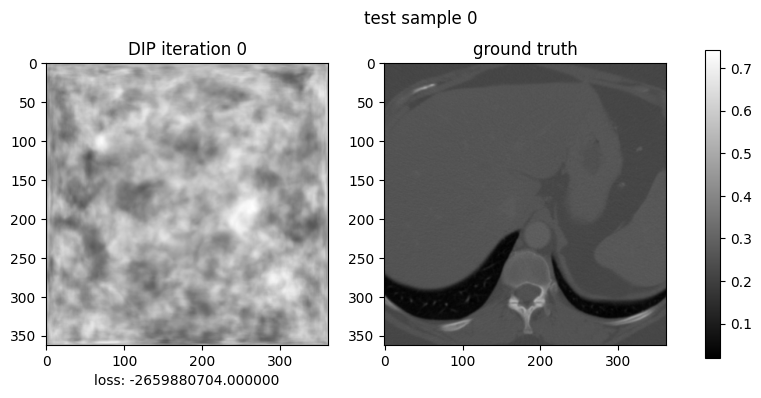

DIP:  11%|████████                                                                 | 1883/17000 [01:54<15:16, 16.49it/s]

KeyboardInterrupt



In [ ]:
# Testing pipeline
#%% evaluate
reco = diptv_reconstructor.reconstruct(obs)
psnr = PSNR(reco, gt)

print('psnr: {:f}'.format(psnr))
_, ax = plot_images([reco, gt],
                    fig_size=(10, 4))
ax[0].set_xlabel('PSNR: {:.2f}'.format(psnr))
ax[0].set_title('DeepImagePriorCTReconstructor')
ax[1].set_title('ground truth')
ax[0].figure.suptitle('test sample {:d}'.format(TEST_SAMPLE))

# Transition layer needed for a Hybrid Architecture - Build Phase

In [25]:
def odl_elem_to_torch(elem, device=None):
    """
    Convert an odl.discr.discr_space.DiscretizedSpaceElement `elem`
    to a torch.Tensor with shape (1, C, H, W) and dtype torch.float32.

    - Uses np.asarray(elem) to obtain a numpy view/copy.
    - Ensures contiguous memory and float32 dtype.
    - If the numpy array is 2D -> treated as (H, W) -> becomes (1, H, W).
    - If the numpy array is HWC (e.g. (H, W, C)) it will be transposed to (C, H, W).
    """
    arr = np.asarray(elem)                  # get numpy view/copy of ODL element
    arr = np.ascontiguousarray(arr)        # ensure contiguous memory

    # make dtype compatible with torch.from_numpy
    if not np.issubdtype(arr.dtype, np.floating):
        arr = arr.astype(np.float32)
    else:
        arr = arr.astype(np.float32, copy=False)

    # normalize shape to (C, H, W)
    if arr.ndim == 2:           # (H, W) -> (1, H, W)
        arr = arr[None, ...]
    elif arr.ndim == 3:
        # if last dim is small (1,3,4) it's probably HWC -> transpose
        if arr.shape[2] in (1, 3, 4):
            arr = arr.transpose(2, 0, 1)  # HWC -> CHW
        # else assume it's already (C, H, W)

    # create tensor and add batch dim -> (1, C, H, W)
    tensor = torch.from_numpy(arr)
    tensor = tensor.unsqueeze(0)  # batch dim

    if device is not None:
        tensor = tensor.to(device)

    return tensor

def odl_to_single(elem):    # shape change (H, W) -> (H, W, 1)
    """
    Convert an odl.discr.discr_space.DiscretizedSpaceElement `elem`
    to a single precision float32 with shape (H, W, 1) and dtype np.float32.

    - Uses np.asarray(elem) to obtain a numpy view/copy.
    - Ensures contiguous memory and float32 dtype.

    - If the numpy array is 2D -> treated as (H, W) -> becomes (1, H, W).
    - If the numpy array is HWC (e.g. (H, W, C)) it will be transposed to (C, H, W).
    """
    arr = np.asarray(elem)                  # get numpy view/copy of ODL element
    arr = np.ascontiguousarray(arr)        # ensure contiguous memory

    # make dtype compatible with torch.from_numpy
    if not np.issubdtype(arr.dtype, np.floating):
        arr = arr.astype(np.float32)
    else:
        arr = arr.astype(np.float32, copy=False)

    # normalize shape to (H, W, C)
    if arr.ndim == 2:           # shape change (H, W) -> (H, W, 1)
        arr = arr[..., None]

    return arr

# Implementing Hybrid Architectures - FBP on top of DRUnet

In [ ]:
# from Restormer/ Denoising to root '/home/hiran'
if os.getcwd() != '/home/hiran':
  %cd '/home/hiran'

/home/hiran


/home/hiran/miniconda3/envs/ctrecn3/lib/python3.10/site-packages/IPython/core/magics/osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


#### Gaussian Denoiser Codebase & Methods, 2021

In [ ]:
# git clone utils, model_zoo, models subversions from Kai Zhang repo at https://github.com/cszn/DPIR.git , Associate Professor of the School of Intelligence Science and Technology at Nanjing University.

In [ ]:
# Experimenting with Drunet model with phantom noice input as the model's 2nd dimension

"""
Kai Zhang (cskaizhang@gmail.com)
github: https://github.com/cszn/DPIR
        https://github.com/cszn/IRCNN
        https://github.com/cszn/KAIR
@article{zhang2020plug,
  title={Plug-and-Play Image Restoration with Deep Denoiser Prior},
  author={Zhang, Kai and Li, Yawei and Zuo, Wangmeng and Zhang, Lei and Van Gool, Luc and Timofte, Radu},
  journal={arXiv preprint},
  year={2020}
}
"""
# IMPORTANT

def main():

    # ----------------------------------------
    # Preparation
    # ----------------------------------------

    noise_level_img = 15                 # set AWGN noise level for noisy image
    noise_level_model = noise_level_img  # set noise level for model
    model_name = 'drunet_gray'           # set denoiser model, 'drunet_gray' | 'drunet_color'
    testset_name = 'set12' # 'bsd68'               # set test set,  'bsd68' | 'cbsd68' | 'set12'
    x8 = False                           # default: False, x8 to boost performance
    show_img = True # False                     # default: False
    border = 0                           # shave boader to calculate PSNR and SSIM

    if 'color' in model_name:
        n_channels = 3                   # 3 for color image
    else:
        n_channels = 1                   # 1 for grayscale image

    model_pool = 'model_zoo'             # fixed
    testsets = 'testsets'                # fixed
    results = 'results'                  # fixed
    task_current = 'dn'                  # 'dn' for denoising
    result_name = testset_name + '_' + task_current + '_' + model_name

    model_path = os.path.join(model_pool, model_name+'.pth')
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    torch.cuda.empty_cache()

    # ----------------------------------------
    # L_path, E_path, H_path
    # ----------------------------------------

    L_path = os.path.join(testsets, testset_name) # L_path, for Low-quality images
    E_path = os.path.join(results, result_name)   # E_path, for Estimated images
    utilsImg.mkdir(E_path)

    logger_name = result_name
    utils_logger.logger_info(logger_name, log_path=os.path.join(E_path, logger_name+'.log'))
    logger = logging.getLogger(logger_name)

    # ----------------------------------------
    # load model
    # ----------------------------------------

    from models.network_unet import UNetRes as net
    model = net(in_nc=n_channels+1, out_nc=n_channels, nc=[64, 128, 256, 512], nb=4, act_mode='R', downsample_mode="strideconv", upsample_mode="convtranspose")
    model_path = './model_zoo/drunet_gray.pth' # added path
    model.load_state_dict(torch.load(model_path), strict=True)
    model.eval()
    for k, v in model.named_parameters():
        v.requires_grad = False
    model = model.to(device)
    logger.info('Model path: {:s}'.format(model_path))
    number_parameters = sum(map(lambda x: x.numel(), model.parameters()))
    logger.info('Params number: {}'.format(number_parameters))

    test_results = OrderedDict()
    test_results['psnr'] = []
    test_results['ssim'] = []

    logger.info('model_name:{}, model sigma:{}, image sigma:{}'.format(model_name, noise_level_img, noise_level_model))
    logger.info(L_path)
    L_paths = utilsImg.get_image_paths(L_path)

    for idx, img in enumerate(L_paths):

        # ------------------------------------
        # (1) img_L
        # ------------------------------------

        img_name, ext = os.path.splitext(os.path.basename(img))
        # logger.info('{:->4d}--> {:>10s}'.format(idx+1, img_name+ext))
        img_H = utilsImg.imread_uint(img, n_channels=n_channels)# img_read_w_unsign_int
        img_L = utilsImg.uint2single(img_H) # invoke to unsign_int_w_single_precision

        # Add noise without clipping
        np.random.seed(seed=0)  # for reproducibility
        img_L += np.random.normal(0, noise_level_img/255., img_L.shape) # adding an array of Gaussian noise to img L. Noise params (mean, sd, shape)

        utilsImg.imshow(utilsImg.single2uint(img_L), title='Noisy image with noise level {}'.format(noise_level_img)) if show_img else None

        img_L = utilsImg.single2tensor4(img_L) # invoke img in single_precision to a tensor_w_4_dimensions # shape (batch_no, channel_no, height, width)?
        img_L = torch.cat((img_L, torch.FloatTensor([noise_level_model/255.]).repeat(1, 1, img_L.shape[2], img_L.shape[3])), dim=1) # a new tensor where img is dimension 0 and noise_tensor_in_same_shape is dim 1       # noise tensor shape match img shape (batch_no, channel_no, height, width)?
        img_L = img_L.to(device)

        # ------------------------------------
        # (2) img_E
        # ------------------------------------

        if not x8 and img_L.size(2)//8==0 and img_L.size(3)//8==0:
            img_E = model(img_L)
        elif not x8 and (img_L.size(2)//8!=0 or img_L.size(3)//8!=0):
            img_E = utils_model.test_mode(model, img_L, refield=64, mode=5)
        elif x8:
            img_E = utils_model.test_mode(model, img_L, mode=3)

        img_E = utilsImg.tensor2uint(img_E)

        # --------------------------------
        # PSNR and SSIM
        # --------------------------------

        if n_channels == 1:
            img_H = img_H.squeeze()
        psnr = utilsImg.calculate_psnr(img_E, img_H, border=border)
        ssim = utilsImg.calculate_ssim(img_E, img_H, border=border)
        test_results['psnr'].append(psnr)
        test_results['ssim'].append(ssim)
        logger.info('{:s} - PSNR: {:.2f} dB; SSIM: {:.4f}.'.format(img_name+ext, psnr, ssim))

        # ------------------------------------
        # save results
        # ------------------------------------

        utilsImg.imsave(img_E, os.path.join(E_path, img_name+ext))

    ave_psnr = sum(test_results['psnr']) / len(test_results['psnr'])
    ave_ssim = sum(test_results['ssim']) / len(test_results['ssim'])
    logger.info('Average PSNR/SSIM(RGB) - {} - PSNR: {:.2f} dB; SSIM: {:.4f}'.format(result_name, ave_psnr, ave_ssim))


# if __name__ == '__main__':

#     main()

In [ ]:
# expanding the model and experiment:

# ----------------------------------------
# Preparation
# ----------------------------------------

noise_level_img = 15                 # set AWGN noise level for noisy image ##
noise_level_model = noise_level_img  # set noise level for model ##
model_name = 'drunet_gray'           # set denoiser model, 'drunet_gray' | 'drunet_color'
testset_name = 'set12' # 'bsd68'               # set test set,  'bsd68' | 'cbsd68' | 'set12'
x8 = False                           # default: False, x8 to boost performance
show_img = True # False                     # default: False
border = 0                           # shave boader to calculate PSNR and SSIM

if 'color' in model_name:
    n_channels = 3                   # 3 for color image
else:
    n_channels = 1                   # 1 for grayscale image

model_pool = 'model_zoo'             # fixed
testsets = 'testsets'                # fixed ##
results = 'results'                  # fixed
task_current = 'dn'                  # 'dn' for denoising
result_name = testset_name + '_' + task_current + '_' + model_name ##

model_path = os.path.join(model_pool, model_name+'.pth')
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
torch.cuda.empty_cache()

# ----------------------------------------
# L_path, E_path, H_path
# ----------------------------------------

L_path = os.path.join(testsets, testset_name) # L_path, for Low-quality images
E_path = os.path.join(results, result_name)   # E_path, for Estimated images
utilsImg.mkdir(E_path) # util

logger_name = result_name
utils_logger.logger_info(logger_name, log_path=os.path.join(E_path, logger_name+'.log'))
logger = logging.getLogger(logger_name)

# ----------------------------------------
# load model
# ----------------------------------------

from models.network_unet import UNetRes as net
model = net(in_nc=n_channels+1, out_nc=n_channels, nc=[64, 128, 256, 512], nb=4, act_mode='R', downsample_mode="strideconv", upsample_mode="convtranspose")
model_path = './model_zoo/drunet_gray.pth' # param path
model.load_state_dict(torch.load(model_path), strict=True)
model.eval()
for k, v in model.named_parameters():
    v.requires_grad = False
model = model.to(device)
logger.info('Model path: {:s}'.format(model_path))
number_parameters = sum(map(lambda x: x.numel(), model.parameters()))
logger.info('Params number: {}'.format(number_parameters))

test_results = OrderedDict()
test_results['psnr'] = []
test_results['ssim'] = []

logger.info('model_name:{}, model sigma:{}, image sigma:{}'.format(model_name, noise_level_img, noise_level_model))
logger.info(L_path)
L_paths = utilsImg.get_image_paths(L_path) # util

LogHandlers setup!


25-09-20 20:37:20.774 : Model path: ./model_zoo/drunet_gray.pth
25-09-20 20:37:20.775 : Params number: 32638656
25-09-20 20:37:20.776 : model_name:drunet_gray, model sigma:15, image sigma:15
25-09-20 20:37:20.776 : testsets/set12


In [ ]:
# testing DRUnet
# iteration over test dataset

for idx, img in enumerate(L_paths):

    # ------------------------------------
    # (1) img_L
    # ------------------------------------

    img_name, ext = os.path.splitext(os.path.basename(img))
    # logger.info('{:->4d}--> {:>10s}'.format(idx+1, img_name+ext))
    img_H = utilsImg.imread_uint(img, n_channels=n_channels) # gt img_read_w_unsign_int
    img_L = utilsImg.uint2single(img_H) # invoke unsign_int to single_precision # np.float32

    # Add noise without clipping
    np.random.seed(seed=0)  # for reproducibility
    img_L += np.random.normal(0, noise_level_img/255., img_L.shape) # adding an array of Gaussian noise to img L. Noise params (mean, sd, shape)

    utilsImg.imshow(utilsImg.single2uint(img_L), title='Noisy image with noise level {}'.format(noise_level_img)) if show_img else None

    img_L = utilsImg.single2tensor4(img_L) # invoke img in single_precision to a tensor_w_4_dimensions # shape (batch_no, channel_no, height, width)?
    img_L = torch.cat((img_L, torch.FloatTensor([noise_level_model/255.]).repeat(1, 1, img_L.shape[2], img_L.shape[3])), dim=1) # a new tensor where img is dimension 0 and noise_tensor_in_same_shape is dim 1       # noise tensor shape match img shape (batch_no, channel_no, height, width)?
    img_L = img_L.to(device)

    # ------------------------------------
    # (2) img_E
    # ------------------------------------

    if not x8 and img_L.size(2)//8==0 and img_L.size(3)//8==0:
        img_E = model(img_L)
    elif not x8 and (img_L.size(2)//8!=0 or img_L.size(3)//8!=0):
        img_E = utils_model.test_mode(model, img_L, refield=64, mode=5)
    elif x8:
        img_E = utils_model.test_mode(model, img_L, mode=3)

    img_E = utilsImg.tensor2uint(img_E)

    # --------------------------------
    # PSNR and SSIM
    # --------------------------------

    if n_channels == 1:
        img_H = img_H.squeeze() # gt squeeze out channel
    psnr = utilsImg.calculate_psnr(img_E, img_H, border=border)
    ssim = utilsImg.calculate_ssim(img_E, img_H, border=border)
    test_results['psnr'].append(psnr)
    test_results['ssim'].append(ssim)
    logger.info('{:s} - PSNR: {:.2f} dB; SSIM: {:.4f}.'.format(img_name+ext, psnr, ssim))

    # ------------------------------------
    # save results
    # ------------------------------------

    utilsImg.imsave(img_E, os.path.join(E_path, img_name+ext))

ave_psnr = sum(test_results['psnr']) / len(test_results['psnr'])
ave_ssim = sum(test_results['ssim']) / len(test_results['ssim'])
logger.info('Average PSNR/SSIM(RGB) - {} - PSNR: {:.2f} dB; SSIM: {:.4f}'.format(result_name, ave_psnr, ave_ssim))

Output hidden; open in https://colab.research.google.com to view.

#### Modifying DRUnet pipeline to fit our purpose and for 2025

In [ ]:
# updating DruNet from 2021 libraries and bugfixing and testing the fitness for purpose

In [ ]:
# working on the version of the model where noice dimension in input tensor is calculated - blind

# def main():
# def DruNet_diversion(img_in_single_prec):

"""
# ----------------------------------------------------------------------------------
# In real applications, we should set proper
# - "noise_level_img": from [3, 25], set 3 for clean image, try 15 for very noisy LR images
# - "k" (or "kernel_width"): blur kernel is very important!!!  kernel_width from [0.6, 3.0]
# to get the best performance.
# ----------------------------------------------------------------------------------
"""
##############################################################################

testset_name = 'set3c'               # set test set,  'set5' | 'srbsd68'
noise_level_img = 3                  # set noise level of image, from [3, 25], set 3 for clean image
model_name = 'drunet_gray' # 'drunet_color' # 'ircnn_color'         # set denoiser, | 'drunet_color' | 'ircnn_gray' | 'drunet_gray' | 'ircnn_color'
sf = 1 # 2                               # set scale factor, 1, 2, 3, 4
iter_num = 24                        # set number of iterations, default: 24 for SISR

# --------------------------------
# set blur kernel
# --------------------------------
kernel_width_default_x1234 = [0.6, 0.9, 1.7, 2.2] # Gaussian kernel widths for x1, x2, x3, x4
noise_level_model = noise_level_img/255.  # noise level of model
kernel_width = kernel_width_default_x1234[sf-1]

"""
# set your own kernel width !!!!!!!!!!
"""
# kernel_width = 1.0


k = utils_deblur.fspecial('gaussian', 25, kernel_width)
k = sr.shift_pixel(k, sf)  # sr.shift_pixel modified # shift the kernel
k /= np.sum(k)

##############################################################################

show_img = True # False
utilsImg.surf(k) if show_img else None
x8 = False # True                            # default: False, x8 to boost performance
modelSigma1 = 49                     # set sigma_1, default: 49
modelSigma2 = max(sf, noise_level_model*255.)
classical_degradation = True         # set classical degradation or bicubic degradation

task_current = 'dn' # 'dn' for denoising # 'sr' # 'sr' for super-resolution
n_channels = 1 if 'gray' in model_name else 3  # fixed
model_zoo = 'model_zoo'              # fixed
testsets = 'testsets'                # fixed
results = 'results'                  # fixed
result_name = testset_name + '_realapplications_' + task_current + '_' + model_name
model_path = os.path.join(model_zoo, model_name+'.pth')
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
torch.cuda.empty_cache()

# ----------------------------------------
# L_path, E_path, H_path
# ----------------------------------------
L_path = os.path.join(testsets, testset_name) # L_path, for Low-quality images
E_path = os.path.join(results, result_name)   # E_path, for Estimated images
utilsImg.mkdir(E_path)

logger_name = result_name
utils_logger.logger_info(logger_name, log_path=os.path.join(E_path, logger_name+'.log'))
logger = logging.getLogger(logger_name)

# ----------------------------------------
# load model
# ----------------------------------------
if 'drunet' in model_name:
    from models.network_unet import UNetRes as net
    model = net(in_nc=n_channels+1, out_nc=n_channels, nc=[64, 128, 256, 512], nb=4, act_mode='R', downsample_mode="strideconv", upsample_mode="convtranspose")
    model.load_state_dict(torch.load(model_path), strict=True)
    model.eval()
    for _, v in model.named_parameters():
        v.requires_grad = False
    model = model.to(device)
elif 'ircnn' in model_name:
    from models.network_dncnn import IRCNN as net
    model = net(in_nc=n_channels, out_nc=n_channels, nc=64)
    model25 = torch.load(model_path)
    former_idx = 0

logger.info('model_name:{}, image sigma:{:.3f}, model sigma:{:.3f}'.format(model_name, noise_level_img, noise_level_model))
logger.info('Model path: {:s}'.format(model_path))
logger.info(L_path)
L_paths = utilsImg.get_image_paths(L_path)
#
for idx, img in enumerate(L_paths):

    # --------------------------------
    # (1) get img_L
    # --------------------------------
    logger.info('Model path: {:s} Image: {:s}'.format(model_path, img))
    img_name, ext = os.path.splitext(os.path.basename(img))
    img_L = utilsImg.imread_uint(img, n_channels=n_channels)
    img_L = utilsImg.uint2single(img_L)

    print('img_L.shape: {}'.format(img_L.shape))
    print(img_L[0,0,0])
    img_L = utilsImg.modcrop(img_L, 8)  # modcrop
    print(img_L[0,0,0])
    print('img_L.shape: {}'.format(img_L.shape))
    # match indent of DruNet diversion code block to re-build complete DruNet pipeline
    # rm def, imgL overlap, imgsave, return

    # diverting DruNet to lodopab functionality

    # img_L = utilsImg.modcrop(img_in_single_prec, 8)  # modcrop # uncomment for divert function
    print('img_L.shape: {}'.format(img_L.shape))


    # --------------------------------
    # (2) get rhos and sigmas
    # --------------------------------
    rhos, sigmas = pnp.get_rho_sigma(sigma=max(0.255/255., noise_level_model), iter_num=iter_num, modelSigma1=modelSigma1, modelSigma2=modelSigma2, w=1)
    rhos, sigmas = torch.tensor(rhos).to(device), torch.tensor(sigmas).to(device)

    # --------------------------------
    # (3) initialize x, and pre-calculation
    # --------------------------------
    x = cv2.resize(img_L, (img_L.shape[1]*sf, img_L.shape[0]*sf), interpolation=cv2.INTER_CUBIC) # scaling up

    if np.ndim(x)==2:
        x = x[..., None]

    if classical_degradation:
        x = sr. shift_pixel(x, sf) # sr.shift_pixel modified due to libraries deprecated
    x = utilsImg.single2tensor4(x).to(device)

    img_L_tensor, k_tensor = utilsImg.single2tensor4(img_L), utilsImg.single2tensor4(np.expand_dims(k, 2)) # note that this is the default size img and k is utils_deblur.fspecial('gaussian', 25, kernel_width)
    [k_tensor, img_L_tensor] = utilsImg.todevice([k_tensor, img_L_tensor], device)
    FB, FBC, F2B, FBFy = sr.pre_calculate(img_L_tensor, k_tensor, sf)

    # --------------------------------
    # (4) main iterations
    # --------------------------------
    for i in range(iter_num):

        # print('Iter: {} / {}'.format(i, iter_num))

        # --------------------------------
        # step 1, FFT
        # --------------------------------
        tau = rhos[i].float().repeat(1, 1, 1, 1)
        x = sr.data_solution(x, FB, FBC, F2B, FBFy, tau, sf)

        if 'ircnn' in model_name:
            current_idx = np.int(np.ceil(sigmas[i].cpu().numpy()*255./2.)-1)

            if current_idx != former_idx:
                model.load_state_dict(model25[str(current_idx)], strict=True)
                model.eval()
                for _, v in model.named_parameters():
                    v.requires_grad = False
                model = model.to(device)
            former_idx = current_idx

        # --------------------------------
        # step 2, denoiser
        # --------------------------------
        if x8:
            x = utilsImg.augment_img_tensor4(x, i % 8) # augmenting 8 ways

        if 'drunet' in model_name:
            x = torch.cat((x, sigmas[i].repeat(1, 1, x.shape[2], x.shape[3])), dim=1)
            x = utils_model.test_mode(model, x, mode=2, refield=64, min_size=256, modulo=16)
        elif 'ircnn' in model_name:
            x = model(x)

        if x8:
            if i % 8 == 3 or i % 8 == 5:
                x = utilsImg.augment_img_tensor4(x, 8 - i % 8)
            else:
                x = utilsImg.augment_img_tensor4(x, i % 8)

    # --------------------------------
    # (3) img_E
    # --------------------------------
    img_E = utilsImg.tensor2uint(x)
    utilsImg.imsave(img_E, os.path.join(E_path, img_name+'_x'+str(sf)+'_'+model_name+'.png'))

    # Diverting the Drunet model output to lodopab translation layer
    # divert = utilsImg.tensor2single(x)
    # return divert

# if __name__ == '__main__':

#     main()

<Figure size 640x480 with 0 Axes>

LogHandlers setup!


25-09-20 20:37:52.337 : model_name:drunet_gray, image sigma:3.000, model sigma:0.012
25-09-20 20:37:52.341 : Model path: model_zoo/drunet_gray.pth
25-09-20 20:37:52.342 : testsets/set3c
25-09-20 20:37:52.343 : Model path: model_zoo/drunet_gray.pth Image: testsets/set3c/butterfly.png


img_L.shape: (256, 256, 1)
0.12549
0.12549
img_L.shape: (256, 256, 1)
img_L.shape: (256, 256, 1)


25-09-20 20:37:53.240 : Model path: model_zoo/drunet_gray.pth Image: testsets/set3c/leaves.png


img_L.shape: (256, 256, 1)
0.909804
0.909804
img_L.shape: (256, 256, 1)
img_L.shape: (256, 256, 1)


25-09-20 20:37:53.754 : Model path: model_zoo/drunet_gray.pth Image: testsets/set3c/starfish.png


img_L.shape: (256, 256, 1)
0.466667
0.466667
img_L.shape: (256, 256, 1)
img_L.shape: (256, 256, 1)


#### Model Definition and Compilation

In [ ]:
# Let's join DICHOM Images to FBP to Transition layer to DRUnet Denoising now.

def DruNet_diversion(img_in_single_prec):

  """
  # ----------------------------------------------------------------------------------
  # In real applications, you should set proper
  # - "noise_level_img": from [3, 25], set 3 for clean image, try 15 for very noisy LR images
  # - "k" (or "kernel_width"): blur kernel is very important!!!  kernel_width from [0.6, 3.0]
  # to get the best performance.
  # ----------------------------------------------------------------------------------
  """
  ##############################################################################

  testset_name = 'set3c'               # set test set,  'set5' | 'srbsd68'
  noise_level_img = 12 # 8 psnr 23 # 3              # set noise level of image, from [3, 25], set 3 for clean image
  model_name = 'drunet_gray' # 'drunet_color' # 'ircnn_color'         # set denoiser, | 'drunet_color' | 'ircnn_gray' | 'drunet_gray' | 'ircnn_color'
  sf = 1 # 2                               # set scale factor, 1, 2, 3, 4
  iter_num = 24                        # set number of iterations, default: 24 for SISR

  # --------------------------------
  # set blur kernel
  # --------------------------------
  kernel_width_default_x1234 = [0.6, 0.9, 1.7, 2.2] # Gaussian kernel widths for x1, x2, x3, x4
  noise_level_model = noise_level_img/255.  # noise level of model
  kernel_width = kernel_width_default_x1234[sf-1]

  """
  # set your own kernel width !!!!!!!!!!
  """
  # kernel_width = 1.0


  k = utils_deblur.fspecial('gaussian', 25, kernel_width)
  k = sr.shift_pixel(k, sf)  # sr.shift_pixel modified # shift the kernel
  k /= np.sum(k)

  ##############################################################################

  show_img = False # True
  utilsImg.surf(k) if show_img else None
  x8 = False # True                            # default: False, x8 to boost performance
  modelSigma1 = 49                     # set sigma_1, default: 49
  modelSigma2 = max(sf, noise_level_model*255.)
  classical_degradation = True         # set classical degradation or bicubic degradation

  task_current = 'dn' # 'dn' for denoising # 'sr' # 'sr' for super-resolution
  n_channels = 1 if 'gray' in model_name else 3  # fixed
  model_zoo = 'model_zoo'              # fixed
  testsets = 'testsets'                # fixed
  results = 'results'                  # fixed
  result_name = testset_name + '_realapplications_' + task_current + '_' + model_name
  model_path = os.path.join(model_zoo, model_name+'.pth')
  device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
  torch.cuda.empty_cache()

  # ----------------------------------------
  # L_path, E_path, H_path
  # ----------------------------------------
  L_path = os.path.join(testsets, testset_name) # L_path, for Low-quality images
  E_path = os.path.join(results, result_name)   # E_path, for Estimated images
  utilsImg.mkdir(E_path)

  logger_name = result_name
  utils_logger.logger_info(logger_name, log_path=os.path.join(E_path, logger_name+'.log'))
  logger = logging.getLogger(logger_name)

  # ----------------------------------------
  # load model
  # ----------------------------------------
  if 'drunet' in model_name:
      from models.network_unet import UNetRes as net
      model = net(in_nc=n_channels+1, out_nc=n_channels, nc=[64, 128, 256, 512], nb=4, act_mode='R', downsample_mode="strideconv", upsample_mode="convtranspose")
      model.load_state_dict(torch.load(model_path), strict=True)
      model.eval()
      for _, v in model.named_parameters():
          v.requires_grad = False
      model = model.to(device)
  elif 'ircnn' in model_name:
      from models.network_dncnn import IRCNN as net
      model = net(in_nc=n_channels, out_nc=n_channels, nc=64)
      model25 = torch.load(model_path)
      former_idx = 0

  # logger.info('model_name:{}, image sigma:{:.3f}, model sigma:{:.3f}'.format(model_name, noise_level_img, noise_level_model))
  # logger.info('Model path: {:s}'.format(model_path))
  logger.info(L_path)
  L_paths = utilsImg.get_image_paths(L_path)
  #
  # for idx, img in enumerate(L_paths):

  # --------------------------------
  # (1) get img_L
  # --------------------------------

  # logger.info('Model path: {:s} Image: {:s}'.format(model_path, img))
  # img_name, ext = os.path.splitext(os.path.basename(img))
  # img_L = utilsImg.imread_uint(img, n_channels=n_channels)
  # img_L = utilsImg.uint2single(img_L)

  # print('img_L.shape: {}'.format(img_L.shape))
  # print(img_L[0,0,0])
  # img_L = utilsImg.modcrop(img_L, 8)  # modcrop
  # print(img_L[0,0,0])
  # print('img_L.shape: {}'.format(img_L.shape))
  # match indent of DruNet diversion code block to re-build complete DruNet pipeline
  # rm def, imgL overlap, imgsave, return

  # diverting DruNet to lodopab functionality

  img_L = utilsImg.modcrop(img_in_single_prec, 8)  # modcrop
  # print('img_L.shape: {}'.format(img_L.shape))


  # --------------------------------
  # (2) get rhos and sigmas
  # --------------------------------
  rhos, sigmas = pnp.get_rho_sigma(sigma=max(0.255/255., noise_level_model), iter_num=iter_num, modelSigma1=modelSigma1, modelSigma2=modelSigma2, w=1)
  rhos, sigmas = torch.tensor(rhos).to(device), torch.tensor(sigmas).to(device)

  # --------------------------------
  # (3) initialize x, and pre-calculation
  # --------------------------------
  x = cv2.resize(img_L, (img_L.shape[1]*sf, img_L.shape[0]*sf), interpolation=cv2.INTER_CUBIC) # scaling up

  if np.ndim(x)==2:
      x = x[..., None]

  if classical_degradation:
      x = sr. shift_pixel(x, sf) # sr.shift_pixel modified due to libraries deprecated
  x = utilsImg.single2tensor4(x).to(device)

  img_L_tensor, k_tensor = utilsImg.single2tensor4(img_L), utilsImg.single2tensor4(np.expand_dims(k, 2)) # note that this is the default size img and k is utils_deblur.fspecial('gaussian', 25, kernel_width)
  [k_tensor, img_L_tensor] = utilsImg.todevice([k_tensor, img_L_tensor], device)
  FB, FBC, F2B, FBFy = sr.pre_calculate(img_L_tensor, k_tensor, sf)

  # --------------------------------
  # (4) main iterations
  # --------------------------------
  for i in range(iter_num):

      # print('Iter: {} / {}'.format(i, iter_num))

      # --------------------------------
      # step 1, FFT
      # --------------------------------
      tau = rhos[i].float().repeat(1, 1, 1, 1)
      x = sr.data_solution(x, FB, FBC, F2B, FBFy, tau, sf)

      # if 'ircnn' in model_name:
      #     current_idx = np.int(np.ceil(sigmas[i].cpu().numpy()*255./2.)-1)

      #     if current_idx != former_idx:
      #         model.load_state_dict(model25[str(current_idx)], strict=True)
      #         model.eval()
      #         for _, v in model.named_parameters():
      #             v.requires_grad = False
      #         model = model.to(device)
      #     former_idx = current_idx

      # --------------------------------
      # step 2, denoiser
      # --------------------------------
      if x8:
          x = utilsImg.augment_img_tensor4(x, i % 8) # augmenting 8 ways

      if 'drunet' in model_name:
          x = torch.cat((x, sigmas[i].repeat(1, 1, x.shape[2], x.shape[3])), dim=1)
          x = utils_model.test_mode(model, x, mode=2, refield=64, min_size=256, modulo=16)
      elif 'ircnn' in model_name:
          x = model(x)

      if x8:
          if i % 8 == 3 or i % 8 == 5:
              x = utilsImg.augment_img_tensor4(x, 8 - i % 8)
          else:
              x = utilsImg.augment_img_tensor4(x, i % 8)

  # --------------------------------
  # (3) img_E
  # --------------------------------
  # img_E = utilsImg.tensor2uint(x)
  # utilsImg.imsave(img_E, os.path.join(E_path, img_name+'_x'+str(sf)+'_'+model_name+'.png'))

  # Diverting the Drunet model output to lodopab translation layer
  divert = utilsImg.tensor2single(x) # shape H, W
  # divert = divert[..., None] # shape H, W, 1
  return divert

#### Apply Gaussian Denoicing model on top of the FBP model

In [ ]:
"""
Implement DruNet on 'lodopab'.
"""
LOG_DIR2 = './logs/lodopab_drunet'
SAVE_BEST_LEARNED_PARAMS_PATH2 = './params/lodopab_drunet'

In [ ]:
# load drunet model

from models.network_unet import UNetRes as net
model2 = net(in_nc=2, out_nc=1, nc=[64, 128, 256, 512], nb=4, act_mode='R', downsample_mode="strideconv", upsample_mode="convtranspose")
model2_path = './model_zoo/drunet_gray.pth' # param path
model2.load_state_dict(torch.load(model2_path), strict=True)
model2.eval()
for k, v in model2.named_parameters():
    v.requires_grad = False
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
torch.cuda.empty_cache()
model2 = model2.to(device)

LogHandlers exists!


25-09-20 20:43:41.401 : testsets/set3c
25-09-20 20:43:42.833 : testsets/set3c


LogHandlers exists!


25-09-20 20:43:44.177 : testsets/set3c


LogHandlers exists!
LogHandlers exists!


25-09-20 20:43:45.535 : testsets/set3c
25-09-20 20:43:46.867 : testsets/set3c


LogHandlers exists!


25-09-20 20:43:48.203 : testsets/set3c


LogHandlers exists!


25-09-20 20:43:49.555 : testsets/set3c


LogHandlers exists!


25-09-20 20:43:50.877 : testsets/set3c


LogHandlers exists!


25-09-20 20:43:52.216 : testsets/set3c


LogHandlers exists!


25-09-20 20:43:53.552 : testsets/set3c


LogHandlers exists!
mean psnr: 26.474400


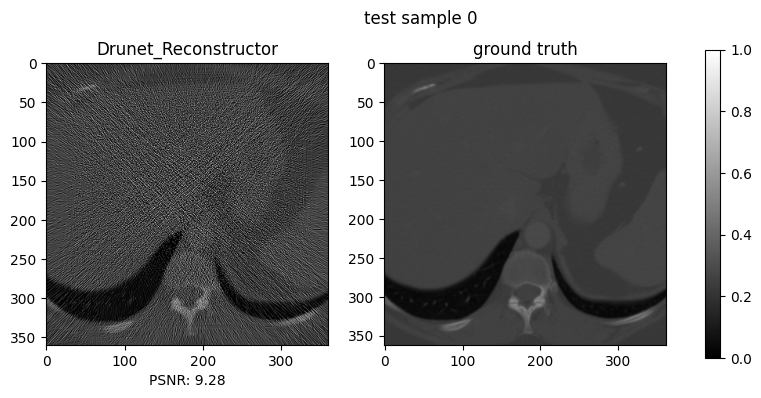

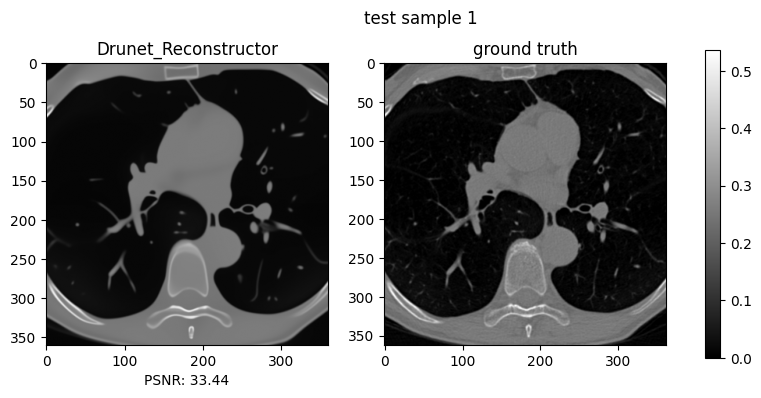

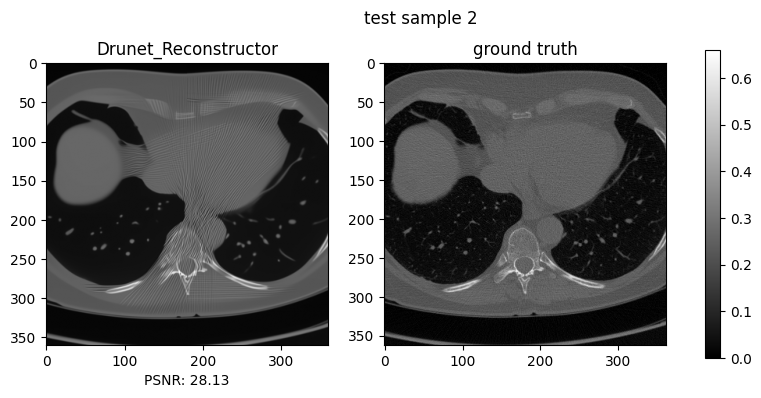

In [ ]:
#%% evaluate
try:
  del recos2
  del psnrs2
except:
  print('no recos2')
finally:
  recos2 = []
  psnrs2 = []

recos2 = []
psnrs2 = []
for obs, gt in test_data_10:
    reco = reconstructor_lodopab.reconstruct(obs)

    # applying the transition layer and Denoicing model on top
    # print(reco[0,0])
    # print(reco.shape)
    reco = odl_to_single(reco) # shape change (H, W) -> (H, W, 1)
    reco2 = DruNet_diversion(reco)  # out shape (H, W, 1)
    # print(reco2[0,0])
    # print(reco2.shape)
    gt = utilsImg.modcrop(gt, 8) # match shape of reco2 modcropped in DruNet

    # resume default pipeline
    recos2.append(reco2)
    psnrs2.append(PSNR(reco2, gt))

print('mean psnr: {:f}'.format(np.mean(psnrs2)))

for i in range(3):
    _, ax = plot_images([recos2[i], test_data_10.ground_truth[i]],
                        fig_size=(10, 4))
    ax[0].set_xlabel('PSNR: {:.2f}'.format(psnrs2[i]))
    ax[0].set_title('Drunet_Reconstructor')
    ax[1].set_title('ground truth')
    ax[0].figure.suptitle('test sample {:d}'.format(i))

#### Saving as a Class - the first Hybrid Model: CNN Gausian Denoising NN on top of FBP Model

In [26]:
if os.getcwd() != '/home/hiran':
  %cd '/home/hiran'

/home/hiran


/home/hiran/miniconda3/envs/ctrecn3/lib/python3.10/site-packages/IPython/core/magics/osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [27]:
from models.network_unet import UNetRes

class hybrid_model_UNetRes(UNetRes):
    def __init__(self, weights, name='not_defined', fbp_model = reconstructor_lodopab, sigma = 8):
        # note that we are not using the tuned fbp since, it was degrading PSNR
        super(hybrid_model_UNetRes, self).__init__()
        self.name = name
        self.weights = weights
        self.fbp_model = fbp_model
        self.sigma = sigma
        model_name = 'drunet_gray'
        sf = 1 # 2                               # set scale factor, 1, 2, 3, 4
        iter_num = 24                        # set number of iterations, default: 24 for SISR

        task_current = 'dn' # 'dn' for denoising # 'sr' # 'sr' for super-resolution
        n_channels = 1 if 'gray' in model_name else 3  # fixed
        device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        torch.cuda.empty_cache()

        from models.network_unet import UNetRes as net
        model = net(in_nc=n_channels+1, out_nc=n_channels, nc=[64, 128, 256, 512], nb=4, act_mode='R', downsample_mode="strideconv", upsample_mode="convtranspose")
        model.load_state_dict(torch.load(self.weights), strict=True)
        model.eval()
        for _, v in model.named_parameters():
            v.requires_grad = False
        self.model = model.to(device)


    def reconstruct(self, obs): # define _reconstruct if want to default to UNetRes reconstruct attribute
      device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
      self.obs = obs
      reco = self.fbp_model.reconstruct(obs)
      reco = odl_to_single(reco) # shape change (H, W) -> (H, W, 1)

      ####

      reco = torch.from_numpy(reco[:,:,0])
      # Pad the input if not_multiple_of 8 # pad height and width
      img_multiple_of = 8
      h,w = reco.shape[0], reco.shape[1]
      H,W = ((h+img_multiple_of)//img_multiple_of)*img_multiple_of, ((w+img_multiple_of)//img_multiple_of)*img_multiple_of
      padh = H-h if h%img_multiple_of!=0 else 0
      padw = W-w if w%img_multiple_of!=0 else 0
      reco = F.pad(reco, (0,padw,0,padh), 'constant') # padding from last dim, left-right, top-btm

      ###############

      noise_level_img = self.sigma # 8 psnr 23 # 3              # set noise level of image, from [3, 25], set 3 for clean image
      sf = 1 # 2                               # set scale factor, 1, 2, 3, 4
      iter_num = 24                        # set number of iterations, default: 24 for SISR

      # --------------------------------
      # set blur kernel
      # --------------------------------
      kernel_width_default_x1234 = [0.6, 0.9, 1.7, 2.2] # Gaussian kernel widths for x1, x2, x3, x4
      noise_level_model = noise_level_img/255.  # noise level of model
      kernel_width = kernel_width_default_x1234[sf-1]

      # kernel_width = 1.0

      k = utils_deblur.fspecial('gaussian', 25, kernel_width)
      k = sr.shift_pixel(k, sf)  # sr.shift_pixel modified # shift the kernel
      k /= np.sum(k)

      show_img = False # True
      utilsImg.surf(k) if show_img else None
      x8 = False # True                            # default: False, x8 to boost performance
      modelSigma1 = 49                     # set sigma_1, default: 49
      modelSigma2 = max(sf, noise_level_model*255.)
      classical_degradation = True         # set classical degradation or bicubic degradation

      # --------------------------------
      # (2) get rhos and sigmas
      # --------------------------------
      rhos, sigmas = pnp.get_rho_sigma(sigma=max(0.255/255., noise_level_model), iter_num=iter_num, modelSigma1=modelSigma1, modelSigma2=modelSigma2, w=1)
      rhos, sigmas = torch.tensor(rhos).to(device), torch.tensor(sigmas).to(device)

      # --------------------------------
      # (3) initialize x, and pre-calculation
      # --------------------------------
      img_L = reco.numpy()
      x = cv2.resize(img_L, (img_L.shape[1]*sf, img_L.shape[0]*sf), interpolation=cv2.INTER_CUBIC) # scaling up

      if np.ndim(x)==2:
          x = x[..., None]

      if classical_degradation:
          x = sr. shift_pixel(x, sf) # sr.shift_pixel modified due to libraries deprecated
      x = utilsImg.single2tensor4(x).to(device)

      img_L_tensor, k_tensor = utilsImg.single2tensor4(img_L[...,None]), utilsImg.single2tensor4(np.expand_dims(k, 2)) # note that this is the default size img and k is utils_deblur.fspecial('gaussian', 25, kernel_width)
      [k_tensor, img_L_tensor] = utilsImg.todevice([k_tensor, img_L_tensor], device)
      FB, FBC, F2B, FBFy = sr.pre_calculate(img_L_tensor, k_tensor, sf)

      # --------------------------------
      # (4) main iterations
      # --------------------------------
      for i in range(iter_num):

          # print('Iter: {} / {}'.format(i, iter_num))

          # --------------------------------
          # step 1, FFT
          # --------------------------------
          tau = rhos[i].float().repeat(1, 1, 1, 1)
          x = sr.data_solution(x, FB, FBC, F2B, FBFy, tau, sf)

          # if 'ircnn' in model_name:
          #     current_idx = np.int(np.ceil(sigmas[i].cpu().numpy()*255./2.)-1)

          #     if current_idx != former_idx:
          #         model.load_state_dict(model25[str(current_idx)], strict=True)
          #         model.eval()
          #         for _, v in model.named_parameters():
          #             v.requires_grad = False
          #         model = model.to(device)
          #     former_idx = current_idx

          # --------------------------------
          # step 2, denoiser
          # --------------------------------
          if x8:
              x = utilsImg.augment_img_tensor4(x, i % 8) # augmenting 8 ways

          # if 'drunet' in model_name:
          # Correct the concatenation to add sigmas as a single channel
          sigma_tensor = sigmas[i].repeat(1, 1, x.shape[2], x.shape[3]) # shape 1, 1, H, W
          x = torch.cat((x, sigma_tensor), dim=1) # concatenate along channel dimension
          x = utils_model.test_mode(self.model, x, mode=2, refield=64, min_size=256, modulo=16)

      divert = torch.clamp(x, 0, 1) # set floor ceiling for pix vals
      divert = utilsImg.tensor2single(divert) # shape H, W
      divert = divert[:h,:w] # discard RGB channel, Batch dim will suffice for evaluation
      # divert = divert[..., None] # shape H, W, 1
      return uniform_discr_element(divert)


no recos2
mean psnr: 22.986391


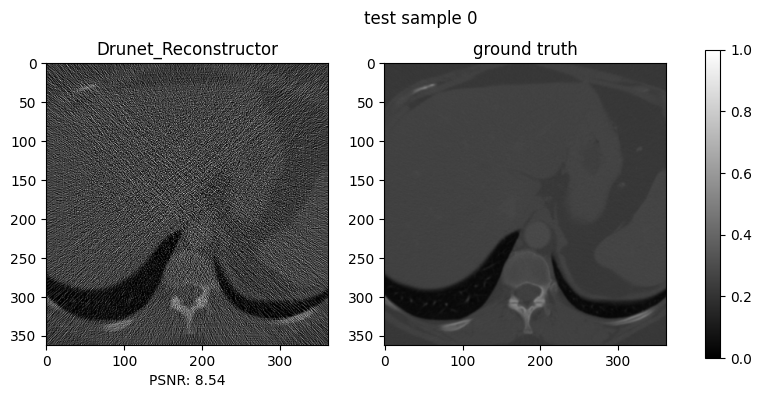

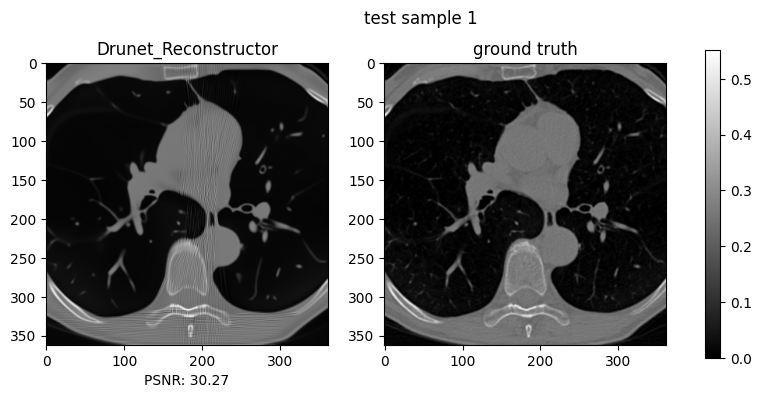

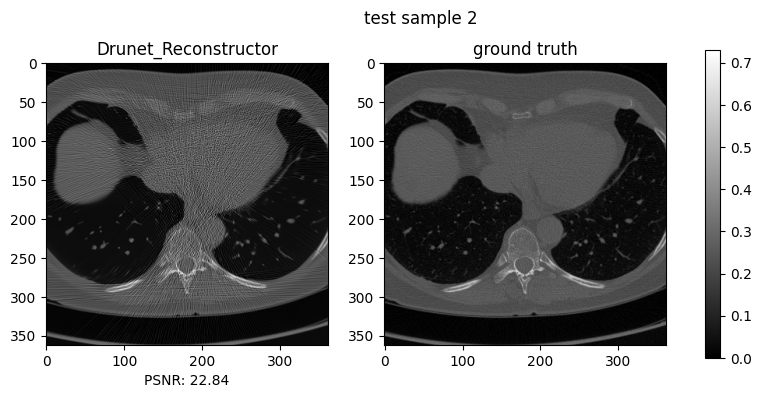

In [29]:
# testing pipeline

weightsU8 = '/home/hiran/model_zoo/drunet_gray.pth'
nameU8 = 'Hybrid UNet Residual model sigma 8'

hybrid_model_u8 = hybrid_model_UNetRes(weightsU8, nameU8, sigma = 8)

try:
  del recos2
  del psnrs2
except:
  print('no recos2')
finally:
  recos2 = []
  psnrs2 = []

for obs, gt in test_data_10:
    torch.cuda.ipc_collect() # collects unnecessary inter-process comm.s and free VRAM
    torch.cuda.empty_cache()
    # reco = reconstructor.reconstruct(obs) # return odl elem H,W with normalized pixel vals
    # hybrid_model_1.reconstruct(reco)

    # locate new model in class directly to projection
    reco2 = hybrid_model_u8.reconstruct(obs)

    # resume default pipeline
    recos2.append(reco2)
    psnrs2.append(PSNR(reco2, gt))

print('mean psnr: {:f}'.format(np.mean(psnrs2)))

for i in range(3):
    _, ax = plot_images([recos2[i], test_data_10.ground_truth[i]],
                        fig_size=(10, 4))
    ax[0].set_xlabel('PSNR: {:.2f}'.format(psnrs2[i]))
    ax[0].set_title('Drunet_Reconstructor')
    ax[1].set_title('ground truth')
    ax[0].figure.suptitle('test sample {:d}'.format(i))

# Experimenting a Hybrid NN - Transformer/ Real Image Denoising on top of FBP Model

#### Restormer SOTA (CVPR-2022) Real Image Denoising Neural Network

In [ ]:
# original work by Syed Waqas Zamir, Aditya Arora
# https://github.com/swz30/Restormer.git

#### 1. Setup
- First, in the **Runtime** menu -> **Change runtime type**, make sure to have ```Hardware Accelerator = GPU```
- Clone repo and install dependencies.


In [ ]:
%cd Restormer/Denoising
if os.getcwd() != '/home/hiran/Restormer/Denoising':
  raise ImportError

# Clone Restormer
# !git clone https://github.com/swz30/Restormer.git

/home/hiran/Restormer/Denoising


#### 2. Define Task and Download Pre-trained Models
Uncomment the task you would like to perform

In [ ]:
task = 'Real_Denoising'
# task = 'Single_Image_Defocus_Deblurring'
# task = 'Motion_Deblurring'
# task = 'Deraining'

# Download the pre-trained models
# if task is 'Real_Denoising':
#   !wget https://github.com/swz30/Restormer/releases/download/v1.0/real_denoising.pth -P Denoising/pretrained_models
if task is 'Single_Image_Defocus_Deblurring':
  !wget https://github.com/swz30/Restormer/releases/download/v1.0/single_image_defocus_deblurring.pth -P Defocus_Deblurring/pretrained_models
if task is 'Motion_Deblurring':
  !wget https://github.com/swz30/Restormer/releases/download/v1.0/motion_deblurring.pth -P Motion_Deblurring/pretrained_models
if task is 'Deraining':
  !wget https://github.com/swz30/Restormer/releases/download/v1.0/deraining.pth -P Deraining/pretrained_models


<>:9: SyntaxWarning: "is" with a literal. Did you mean "=="?
<>:11: SyntaxWarning: "is" with a literal. Did you mean "=="?
<>:13: SyntaxWarning: "is" with a literal. Did you mean "=="?
<>:9: SyntaxWarning: "is" with a literal. Did you mean "=="?
<>:11: SyntaxWarning: "is" with a literal. Did you mean "=="?
<>:13: SyntaxWarning: "is" with a literal. Did you mean "=="?
/tmp/ipykernel_479/4256543054.py:9: SyntaxWarning: "is" with a literal. Did you mean "=="?
  if task is 'Single_Image_Defocus_Deblurring':
/tmp/ipykernel_479/4256543054.py:11: SyntaxWarning: "is" with a literal. Did you mean "=="?
  if task is 'Motion_Deblurring':
/tmp/ipykernel_479/4256543054.py:13: SyntaxWarning: "is" with a literal. Did you mean "=="?
  if task is 'Deraining':


#### 3. Upload Images
Either download the sample images or upload your own images

In [ ]:
# # from google.colab import files

# Download sample images
# !rm -r demo/*
# !wget https://github.com/swz30/Restormer/releases/download/v1.0/sample_images.zip -P demo
# shutil.unpack_archive('demo/sample_images.zip', 'demo/')
# os.remove('demo/sample_images.zip')

# OR Uncomment the following block if you would like to upload your own images.

# !rm -r demo/*
# input_dir = 'demo/sample_images/'+task+'/degraded'
# os.makedirs(input_dir, exist_ok=True)
# uploaded = files.upload()
# for filename in uploaded.keys():
#   input_path = os.path.join(input_dir, filename)
#   shutil.move(filename, input_path)

--2025-09-07 09:30:08--  https://github.com/swz30/Restormer/releases/download/v1.0/sample_images.zip
Resolving github.com (github.com)... 20.26.156.215
Connecting to github.com (github.com)|20.26.156.215|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://release-assets.githubusercontent.com/github-production-release-asset/418793252/ac90e9f3-ee13-4c5f-b4ee-5e057f2b7c43?sp=r&sv=2018-11-09&sr=b&spr=https&se=2025-09-07T09%3A09%3A24Z&rscd=attachment%3B+filename%3Dsample_images.zip&rsct=application%2Foctet-stream&skoid=96c2d410-5711-43a1-aedd-ab1947aa7ab0&sktid=398a6654-997b-47e9-b12b-9515b896b4de&skt=2025-09-07T08%3A09%3A22Z&ske=2025-09-07T09%3A09%3A24Z&sks=b&skv=2018-11-09&sig=7Jte42ikcR08G82jTxB%2F9R%2FYJf9nHYHVpaP2rDQTQWQ%3D&jwt=eyJ0eXAiOiJKV1QiLCJhbGciOiJIUzI1NiJ9.eyJpc3MiOiJnaXRodWIuY29tIiwiYXVkIjoicmVsZWFzZS1hc3NldHMuZ2l0aHVidXNlcmNvbnRlbnQuY29tIiwia2V5Ijoia2V5MSIsImV4cCI6MTc1NzIzNDEwNiwibmJmIjoxNzU3MjMzODA2LCJwYXRoIjoicmVsZWFzZWFzc2V0cHJvZHVjdGlvbi

#### 4. Prepare Model and Load Checkpoint

In [ ]:
def get_weights_and_parameters(task, parameters):
    if task == 'Motion_Deblurring':
        weights = os.path.join('Motion_Deblurring', 'pretrained_models', 'motion_deblurring.pth')
    elif task == 'Single_Image_Defocus_Deblurring':
        weights = os.path.join('Defocus_Deblurring', 'pretrained_models', 'single_image_defocus_deblurring.pth')
    elif task == 'Deraining':
        weights = os.path.join('Deraining', 'pretrained_models', 'deraining.pth')
    elif task == 'Real_Denoising': # this attempt
        weights = os.path.join('pretrained_models', 'real_denoising.pth') # 'Denoising',
        parameters['LayerNorm_type'] =  'BiasFree'
    return weights, parameters


# Get model weights and parameters
parameters = {'inp_channels':3, 'out_channels':3, 'dim':48, 'num_blocks':[4,6,6,8], 'num_refinement_blocks':4, 'heads':[1,2,4,8], 'ffn_expansion_factor':2.66, 'bias':False, 'LayerNorm_type':'WithBias', 'dual_pixel_task':False}
weights, parameters = get_weights_and_parameters(task, parameters)

load_arch = run_path('/home/hiran/Restormer/basicsr/models/archs/restormer_arch.py')
    # os.path.join('basicsr', 'models', 'archs', 'restormer_arch.py'))
model = load_arch['Restormer'](**parameters)
model.cuda()

checkpoint = torch.load(weights)
model.load_state_dict(checkpoint['params'])
model.eval() # disable dropout, batch norm by changing the mode of the model

Restormer(
  (patch_embed): OverlapPatchEmbed(
    (proj): Conv2d(3, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  )
  (encoder_level1): Sequential(
    (0): TransformerBlock(
      (norm1): LayerNorm(
        (body): BiasFree_LayerNorm()
      )
      (attn): Attention(
        (qkv): Conv2d(48, 144, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (qkv_dwconv): Conv2d(144, 144, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=144, bias=False)
        (project_out): Conv2d(48, 48, kernel_size=(1, 1), stride=(1, 1), bias=False)
      )
      (norm2): LayerNorm(
        (body): BiasFree_LayerNorm()
      )
      (ffn): FeedForward(
        (project_in): Conv2d(48, 254, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (dwconv): Conv2d(254, 254, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=254, bias=False)
        (project_out): Conv2d(127, 48, kernel_size=(1, 1), stride=(1, 1), bias=False)
      )
    )
    (1): TransformerBlock(
 

#### 5. Inference - stock photos

In [ ]:
input_dir = '/home/hiran/Restormer/demo/sample_images/'+task+'/degraded'
out_dir = '/home/hiran/Restormer/demo/sample_images/'+task+'/restored'
os.makedirs(out_dir, exist_ok=True)
extensions = ['jpg', 'JPG', 'png', 'PNG', 'jpeg', 'JPEG', 'bmp', 'BMP']
files = natsorted(glob(os.path.join(input_dir, '*')))

img_multiple_of = 8

print(f"\n ==> Running {task} with weights {weights}\n ")
with torch.no_grad(): # save memory by not calc gradient
  for filepath in tqdm(files):
      # print(file_)
      torch.cuda.ipc_collect() # collects unnecessary inter-process comm.s and free VRAM
      torch.cuda.empty_cache()
      img = cv2.cvtColor(cv2.imread(filepath), cv2.COLOR_BGR2RGB) # shape H,W,C #3darr
      input_ = torch.from_numpy(img).float().div(255.).permute(2,0,1).unsqueeze(0).cuda() # png to uint8 tensor to flt/12 to shape is x,C,H,W

      # Pad the input if not_multiple_of 8 # pad height and width
      h,w = input_.shape[2], input_.shape[3]
      H,W = ((h+img_multiple_of)//img_multiple_of)*img_multiple_of, ((w+img_multiple_of)//img_multiple_of)*img_multiple_of
      padh = H-h if h%img_multiple_of!=0 else 0
      padw = W-w if w%img_multiple_of!=0 else 0
      input_ = F.pad(input_, (0,padw,0,padh), 'reflect')

      # input shape torch.Size([1, 3, 400, 496]) # pixels normalized 0,1
      restored_ = model(input_)
      # out shape torch.Size([1, 3, 400, 496]) # pixels normalized 0,1
      restored = torch.clamp(restored_, 0, 1) # set floor ceiling for pix vals

      # Unpad the output
      restored = restored[:,:,:h,:w]

      restored = restored.permute(0, 2, 3, 1).cpu().detach().numpy() # change shape to B, H, W, C then move to CPU since tensor to numpy later, conf no gradients hitched
      restored = img_as_ubyte(restored[0]) # select the first img from the batch of one, scale pixels to 0,255 and then array to uint8

      filename = os.path.split(filepath)[-1]
      cv2.imwrite(os.path.join(out_dir, filename),cv2.cvtColor(restored, cv2.COLOR_RGB2BGR))


 ==> Running Real_Denoising with weights pretrained_models/real_denoising.pth
 


100%|█████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:02<00:00,  2.34it/s]


In [ ]:
print(img.shape)
print(type(img))
print((torch.from_numpy(img).float()).shape)
print(torch.from_numpy(img)[0,0,0])
print(type(torch.from_numpy(img).float()[0,0,0]))
print(torch.from_numpy(img).float()[0,0,0].div(255.))
print(input_.shape)
print(input_.unsqueeze(0).shape)
print(restored_[0,0,0,0])

(400, 496, 3)
<class 'numpy.ndarray'>
torch.Size([400, 496, 3])
tensor(55, dtype=torch.uint8)
<class 'torch.Tensor'>
tensor(0.2157)
torch.Size([1, 3, 400, 496])
torch.Size([1, 1, 3, 400, 496])
tensor(0.1440, device='cuda:0')


#### 6. Visualize Results - stock photos


In [ ]:
import matplotlib.pyplot as plt
inp_filenames = natsorted(glob(os.path.join(input_dir, '*')))
out_filenames = natsorted(glob(os.path.join(out_dir, '*')))

## Will display only first 5 images
num_display_images = 5
if len(inp_filenames)>num_display_images:
  inp_filenames = inp_filenames[:num_display_images]
  out_filenames = out_filenames[:num_display_images]

print(f"Results: {task}")
for inp_file, out_file in zip(inp_filenames, out_filenames):
  degraded = cv2.cvtColor(cv2.imread(inp_file), cv2.COLOR_BGR2RGB)
  restored = cv2.cvtColor(cv2.imread(out_file), cv2.COLOR_BGR2RGB)
  ## Display Images
  fig, axes = plt.subplots(nrows=1, ncols=2)
  dpi = fig.get_dpi()
  fig.set_size_inches(900/ dpi, 448 / dpi)
  plt.subplots_adjust(left=0, right=1, bottom=0, top=1)
  axes[0].axis('off')
  axes[0].imshow(degraded)
  axes[1].axis('off')
  axes[1].imshow(restored)
  plt.show()

Output hidden; open in https://colab.research.google.com to view.

#### 7. Download Results - stock photos

In [ ]:
# from google.colab import files
# zip_filename = f"Restormer_{task}.zip"
# os.system(f"zip -r {zip_filename} demo/sample_images/{task}")
# files.download(zip_filename)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### Apply Transformer model - Real noise Restormer on top of the FBP model

In [ ]:
# if os.getcwd() != '/home/hiran/Restormer':
#   raise ImportError
# %cd /Restormer

"""
Implement 'Restormer' - model on Real img Noise on dataset 'lodopab'.
"""
LOG_DIR2 = './logs/lodopab_restormer_real'
SAVE_BEST_LEARNED_PARAMS_PATH2 = './params/lodopab_restormer_real'

In [ ]:
# ----------------------------
# load FBP model
# ----------------------------

# from ctexample section
reconstructor = FBPReconstructor(ray_trafo_lodopab, hyper_params={
    'filter_type': 'Hann',
    'frequency_scaling': 0.8})

mean psnr: 30.146599


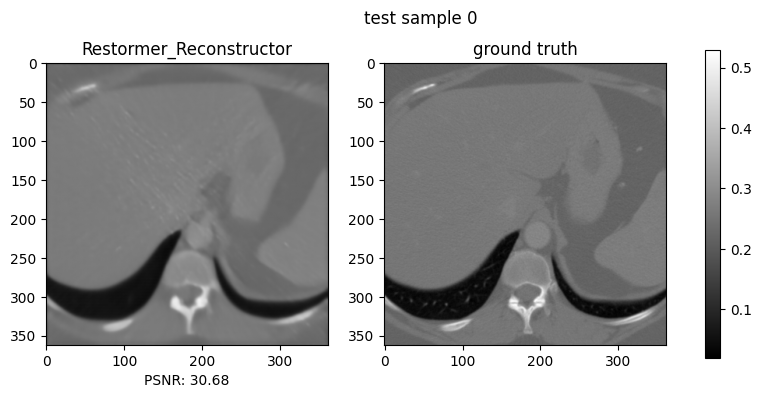

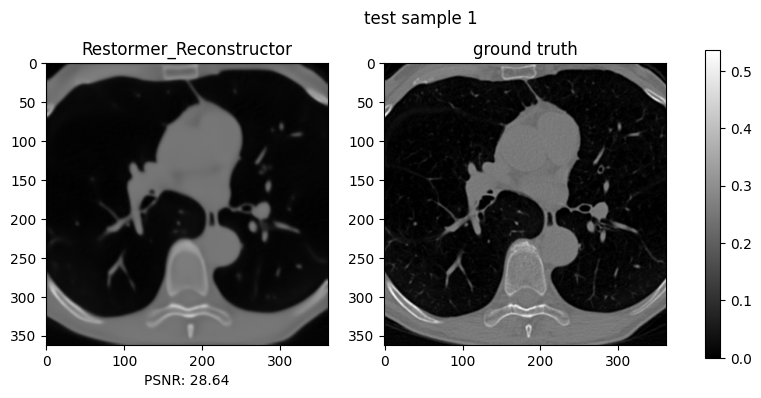

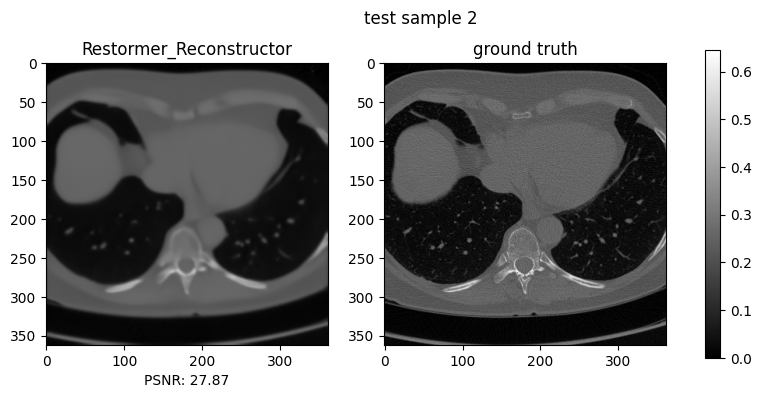

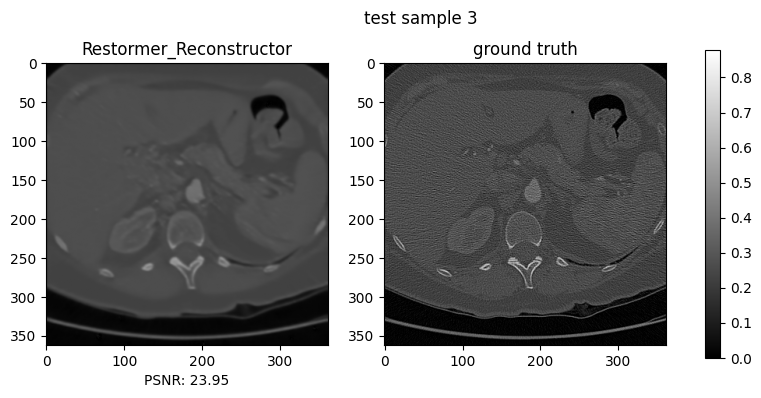

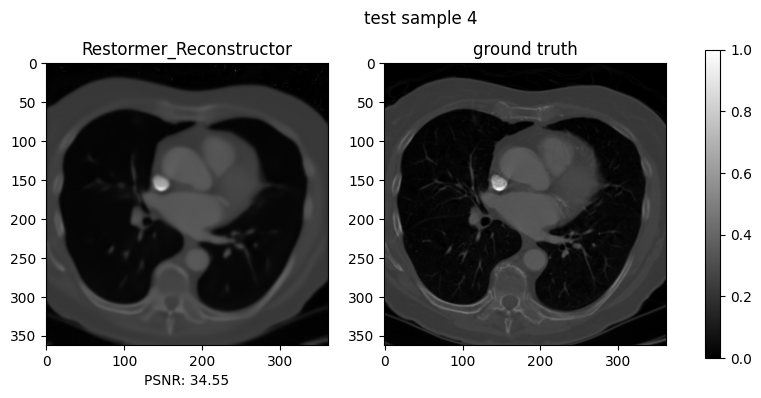

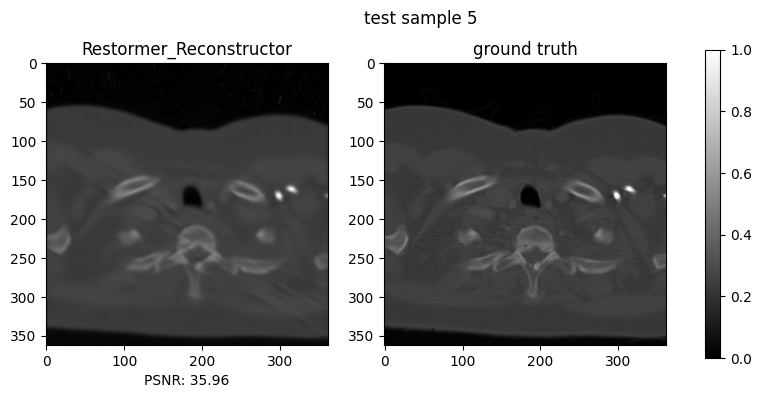

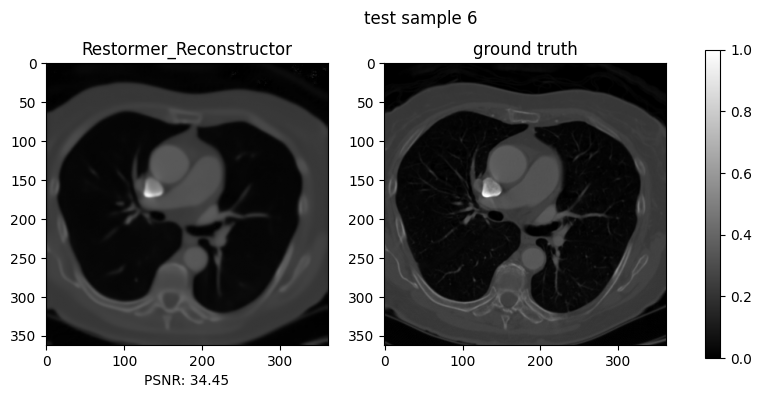

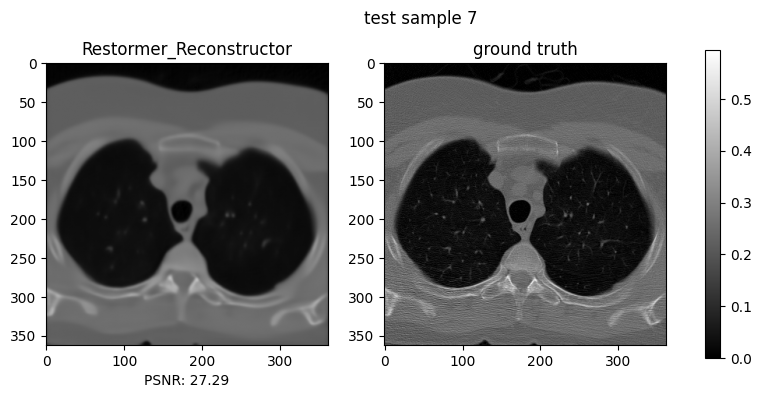

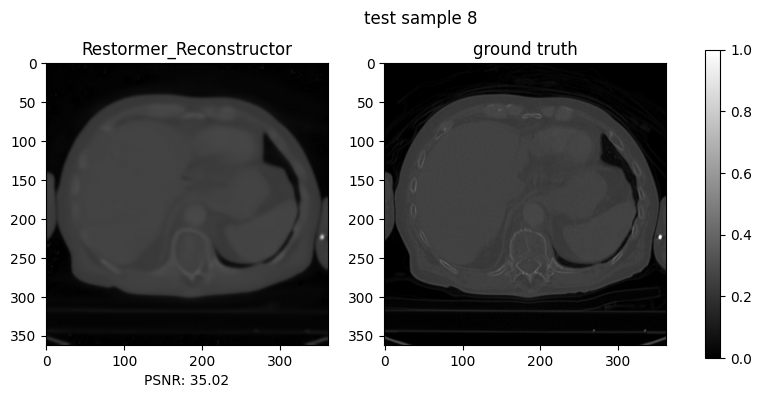

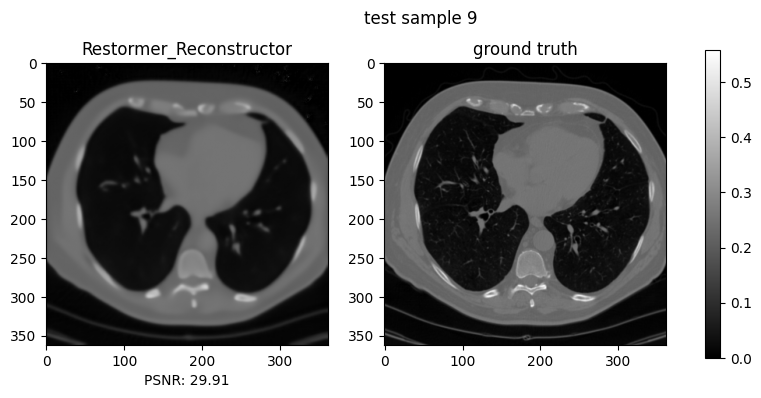

In [ ]:
#%% evaluate
img_multiple_of = 8

try:
  del recos2
  del psnrs2
except:
  print('no recos2')
finally:
  recos2 = []
  psnrs2 = []

with torch.no_grad(): # save memory by not calc gradient
  for obs, gt in test_data:
      torch.cuda.ipc_collect() # collects unnecessary inter-process comm.s and free VRAM
      torch.cuda.empty_cache()
      reco = reconstructor.reconstruct(obs) # return odl elem H,W

      # testing black imagese from Restormer -start

      # applying the transition layer and Denoicing model on top
      # print(reco[0,0])
      # print(reco.shape)
      reco = odl_to_single(reco) # return 3d np arr H,W,C

      # print(reco[0,0])
      # print(reco.shape)
      # print(reco.size)
      reco_ = reco[:,:,0]
      # print(reco_[0,0])
      # print(reco_.shape)
      # print(reco_.size)

      reco1 = np.stack( (reco_, np.zeros_like(reco_), np.zeros_like(reco_)), axis=-1) # shape 3C,H,W
      # print(reco1[0,0])
      # print(reco1.shape)
      # print(reco1.size)

      input_ = torch.from_numpy(reco1).permute(2,0,1).unsqueeze(0).cuda() # shape is 1B,3C,H,W

      # print(input_[0,0])
      # print(input_.shape)

      # Pad the input if not_multiple_of 8 # pad height and width
      h,w = input_.shape[2], input_.shape[3]
      H,W = ((h+img_multiple_of)//img_multiple_of)*img_multiple_of, ((w+img_multiple_of)//img_multiple_of)*img_multiple_of
      padh = H-h if h%img_multiple_of!=0 else 0
      padw = W-w if w%img_multiple_of!=0 else 0
      input_ = F.pad(input_, (0,padw,0,padh), 'reflect')

      # inpput shape torch.Size([1, 3, 368, 368]) # pixels normalized 0,1
      restored_ = model(input_)
      # out shape torch.Size([1, 3, 368, 368]) # pixels normalized 0,1
      restored = torch.clamp(restored_, 0, 1) # set floor ceiling for pix vals

      # Unpad the output
      # print(restored[0,0])
      # print(restored.numel())
      # print(restored.shape)
      restored2 = restored[0,0,:h,:w] # discard RGB channel, Batch dim will suffice for evaluation
      # print(restored2[0])
      # print(restored2.numel())
      # print(restored2.shape)

      reco = restored2.cpu().detach().numpy() # change shape from B,C,H,W to B, H, W, C then move to CPU since tensor to numpy later, conf no gradients still attached
      # print(reco2.shape)
      # print(reco2.size)
      # reco = img_as_ubyte(reco) # scale pixels to 0,255 and then array to uint8
      # print(reco2.shape)
      # print(reco2.size)

      # testing black imagese from Restormer -end

      # resume default pipeline reco2 can be H,W,1
      recos2.append(reco)
      # gt = utilsImg.modcrop(gt, 8) # match shape of reco2 modcropped in DruNet
      psnrs2.append(PSNR(reco, gt))

print('mean psnr: {:f}'.format(np.mean(psnrs2)))

for i in range(10):
    _, ax = plot_images([recos2[i], test_data.ground_truth[i]],
                        fig_size=(10, 4))
    ax[0].set_xlabel('PSNR: {:.2f}'.format(psnrs2[i]))
    ax[0].set_title('Restormer_Reconstructor')
    ax[1].set_title('ground truth')
    ax[0].figure.suptitle('test sample {:d}'.format(i))


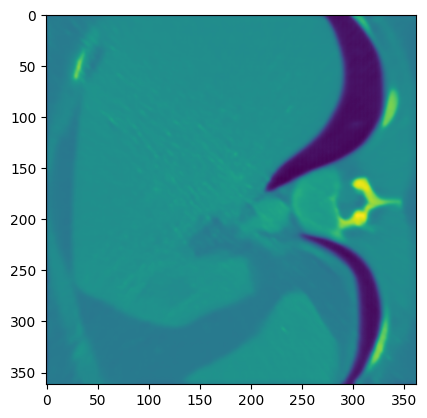

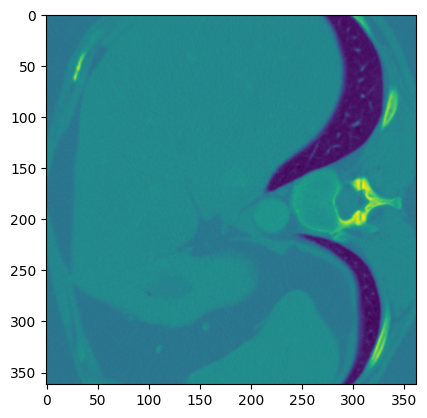

In [ ]:
plt.imshow(recos2[0])
plt.show()
plt.imshow(test_data_2.ground_truth[0])
plt.show()

# for i in range(3):
#   plot_images(test_data_2.ground_truth[i])

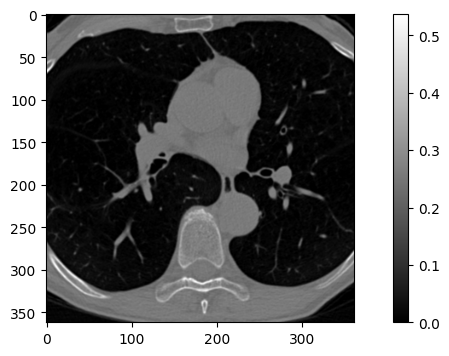

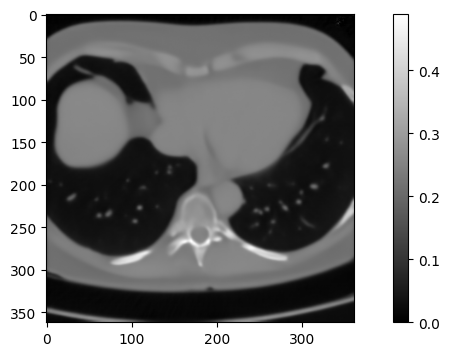

In [ ]:
a = plot_images([test_data_2.ground_truth[1]], fig_size=(10, 4))
b = plot_images([recos2[2]], fig_size=(10, 4))

In [ ]:
type(test_data_2)

dival.data.DataPairs

In [ ]:
# Real world Denoising doesn't work well on CT reconstructions.
# Let's build up on the transformer restormer on gaussian noise.

# Experimenting a Hybrid NN -> Transformer/ Gaussian Denoising NN on top of FBP Model

#### Modifying the Gaussian Denoiser

- Restormer: Efficient Transformer for High-Resolution Image Restoration
- Syed Waqas Zamir, Aditya Arora, Salman Khan, Munawar Hayat, Fahad Shahbaz Khan, and Ming-Hsuan Yang
- https://arxiv.org/abs/2111.09881


In [ ]:
# if running in local setup
# %cd Restormer/
# if os.getcwd() != '/home/hiran/Restormer':
#   raise ImportError

# %cd Denoising/
# if os.getcwd() != '/home/hiran/Restormer/Denoising':
#   raise ImportError
# import utils
# if utils.__file__ != '/home/hiran/Restormer/Denoising/utils.py':
#   raise ImportError

In [ ]:
# Define the necessary variables directly
input_dir = './Datasets/test/'  # Update with actual path if needed
result_dir = './results/Gaussian_Gray_Denoising/' # Update with actual path if needed
weights_path = './pretrained_models/gaussian_gray_denoising' # Update with actual path if needed
model_type = 'blind' # or 'non_blind'
sigmas_str = '15' #,25,50' # Define sigma values as a string

####### Load yaml #######
if model_type == 'blind':
    yaml_file = 'Options/GaussianGrayDenoising_Restormer.yml'
else:
    # Assuming sigma for non_blind is the first one if multiple are given
    yaml_file = f'Options/GaussianGrayDenoising_RestormerSigma{sigmas_str.split(",")[0]}.yml'

try:
    from yaml import CLoader as Loader
except ImportError:
    from yaml import Loader

x = yaml.load(open(yaml_file, mode='r'), Loader=Loader)

s = x['network_g'].pop('type')
##########################

sigmas = np.int_(sigmas_str.split(','))

factor = 8

datasets = ['Set12'] # ['Set12', 'BSD68', 'Urban100']

for sigma_test in sigmas:
    print("Compute results for noise level",sigma_test)
    model_restoration = Restormer(**x['network_g'])
    if model_type == 'blind':
        weights = weights_path+'_blind.pth'
    else:
        weights = weights_path + '_sigma' + str(sigma_test) +'.pth'
    checkpoint = torch.load(weights)
    model_restoration.load_state_dict(checkpoint['params'])

    print("===>Testing using weights: ",weights)
    print("------------------------------------------------")
    model_restoration.cuda()
    model_restoration = nn.DataParallel(model_restoration)
    model_restoration.eval()

    for dataset in datasets:
        inp_dir = os.path.join(input_dir, dataset)
        files = natsorted(glob(os.path.join(inp_dir, '*.png')) + glob(os.path.join(inp_dir, '*.tif')))
        result_dir_tmp = os.path.join(result_dir, model_type, dataset, str(sigma_test))
        os.makedirs(result_dir_tmp, exist_ok=True)

        with torch.no_grad():
            for file_ in tqdm(files):
                torch.cuda.ipc_collect()
                torch.cuda.empty_cache()
                img = np.float32(utilsDn.load_gray_img(file_))/255. # normalised pixel vals in single precision # shape C?,H,W

                np.random.seed(seed=0)  # for reproducibility
                img += np.random.normal(0, sigma_test/255., img.shape)

                img = torch.from_numpy(img).permute(2,0,1)
                input_ = img.unsqueeze(0).cuda() # shape B:1?, C:1?,H,W

                # Padding in case images are not multiples of 8
                h,w = input_.shape[2], input_.shape[3]
                H,W = ((h+factor)//factor)*factor, ((w+factor)//factor)*factor
                padh = H-h if h%factor!=0 else 0
                padw = W-w if w%factor!=0 else 0
                input_ = F.pad(input_, (0,padw,0,padh), 'reflect')

                restored = model_restoration(input_) # output normalised pixel vals in shape BCHW

                # Unpad images to original dimensions
                restored = restored[:,:,:h,:w]

                restored = torch.clamp(restored,0,1).cpu().detach().permute(0, 2, 3, 1).squeeze(0).numpy() # clamped normalised pixel vals in 3d array with shape H,W,C:1

                save_file = os.path.join(result_dir_tmp, os.path.split(file_)[-1])
                utilsDn.save_gray_img(save_file, img_as_ubyte(restored))

Compute results for noise level 15
===>Testing using weights:  ./pretrained_models/gaussian_gray_denoising_blind.pth
------------------------------------------------


100%|███████████████████████████████████████████████████████████████████████████████████| 13/13 [00:03<00:00,  4.08it/s]


#### Apply Transformer NN - Blind Gausian Restormer on top of the FBP model

In [ ]:
# if os.getcwd() != '/home/hiran/Restormer/Denoising':
#   raise ImportError
# # %cd Denoising
"""
Implement  Gaussian Restormer on 'lodopab'.
"""
IMPL = 'astra_cuda'
LOG_DIR2 = '../../logs/lodopab_restormer_Gaussian'
SAVE_BEST_LEARNED_PARAMS_PATH2 = '../../params/lodopab_restormer_Gaussian'

In [ ]:
# ----------------------------
# load FBP model
# ----------------------------

# from ctexample section
reconstructor = FBPReconstructor(ray_trafo_lodopab, hyper_params={
    'filter_type': 'Hann',
    'frequency_scaling': 0.8})

mean psnr: 30.315838


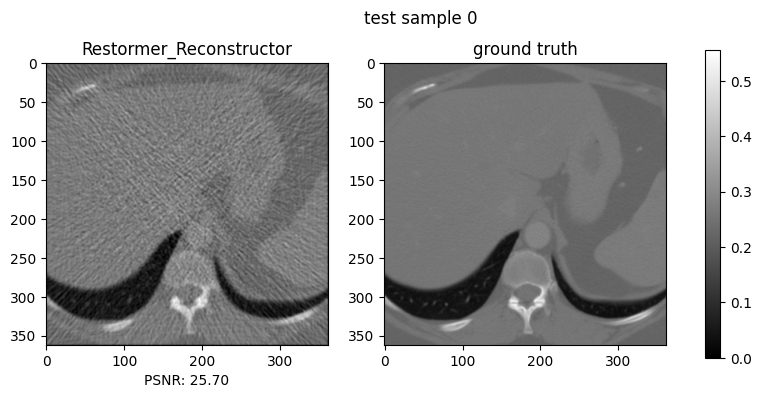

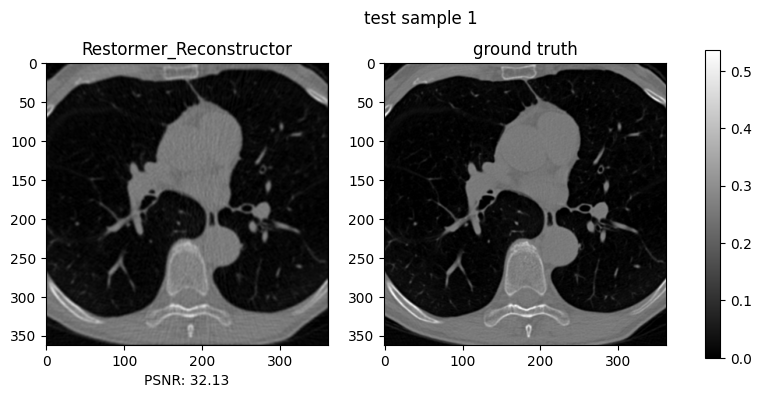

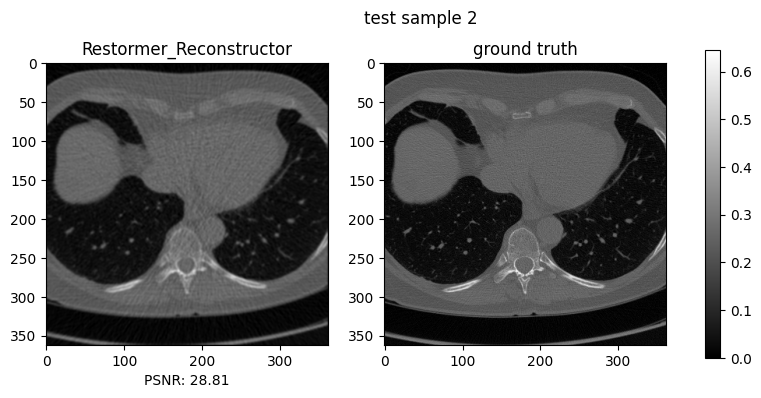

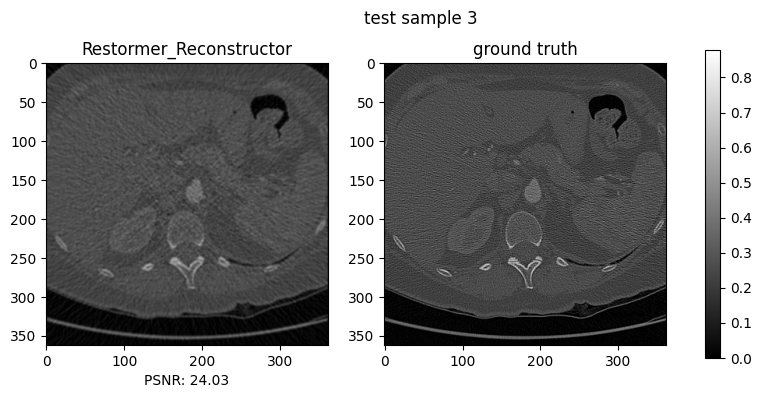

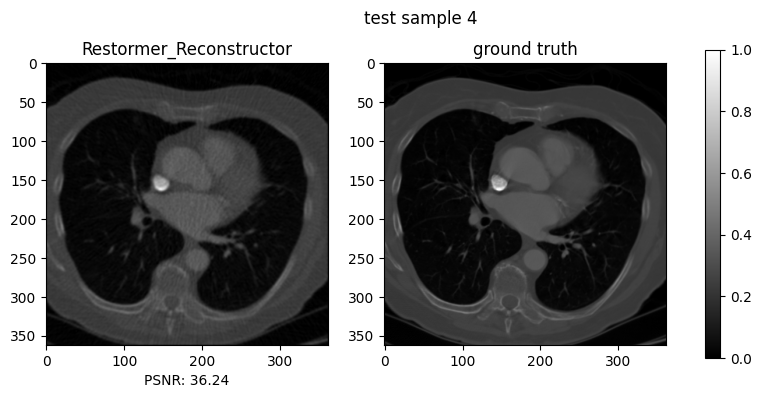

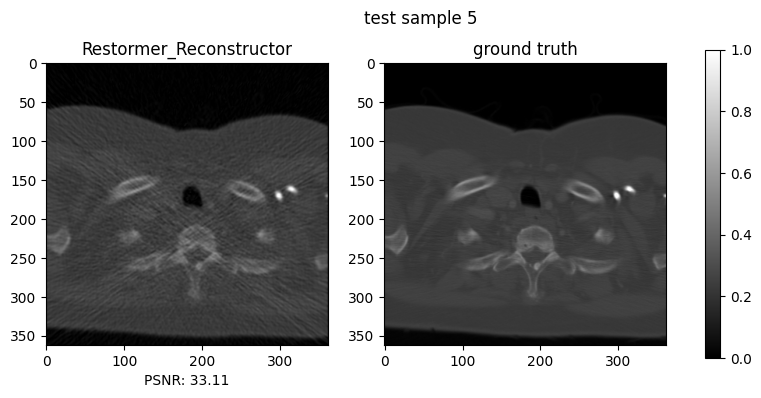

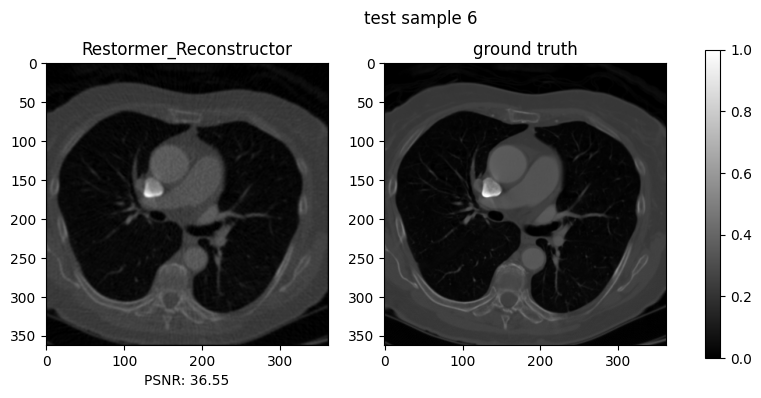

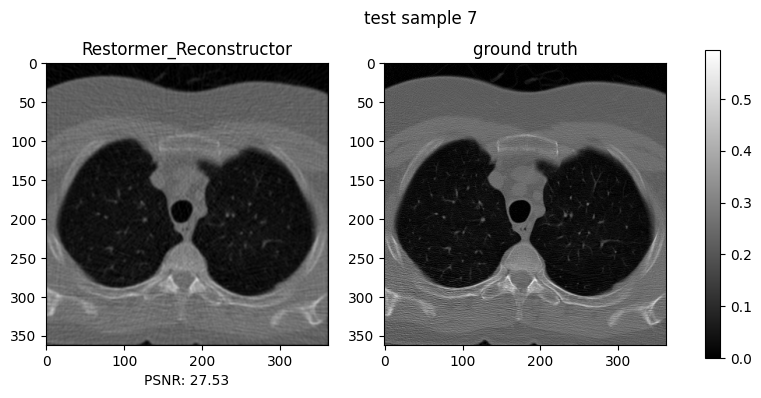

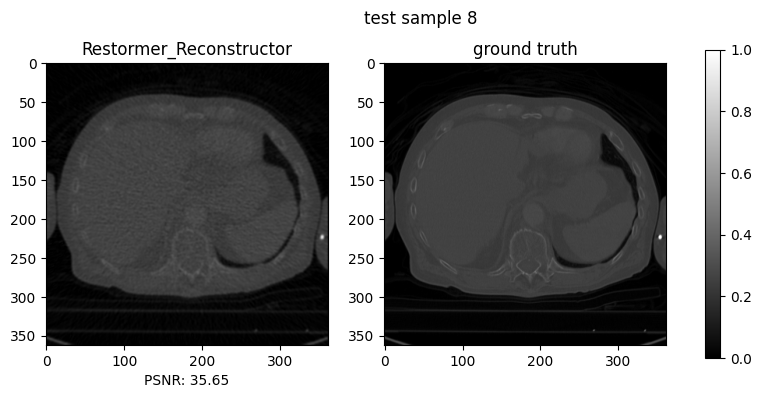

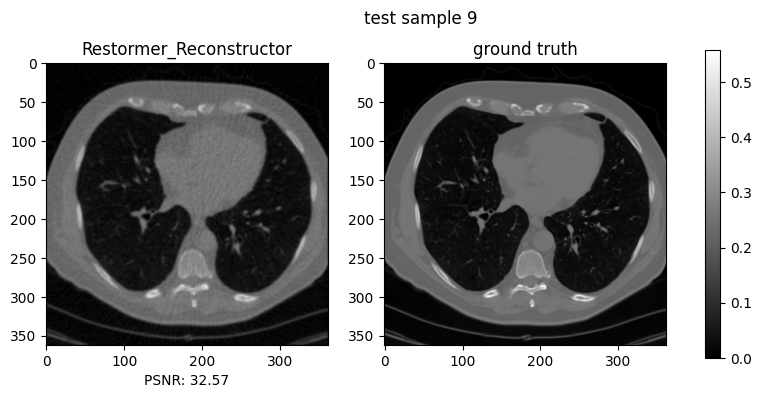

In [ ]:
#%% evaluate
img_multiple_of = 8

try:
  del recos2
  del psnrs2
except:
  print('no recos2')
finally:
  recos2 = []
  psnrs2 = []

with torch.no_grad(): # save memory by not calc gradient
  for obs, gt in test_data:
      torch.cuda.ipc_collect() # collects unnecessary inter-process comm.s and free VRAM
      torch.cuda.empty_cache()

      reco = reconstructor.reconstruct(obs) # return odl elem H,W with normalized pixel vals

      # testing black imagese from Restormer -start

      # applying the transition layer and Denoicing model on top
      reco = odl_to_single(reco) # return 3d np arr H,W,C:1
      # print(reco.mean())
      # print(reco.min())
      # print(reco.max())
      # print(reco.std())

      # reco_ = reco[:,:,0] # shape H,W
      # print(reco_[0,0])
      # print(reco_.shape)
      # print(reco_.size)

      # reco1 = np.stack( (reco_, np.zeros_like(reco_), np.zeros_like(reco_)), axis=-1)
      # print(reco1[0,0])
      # print(reco1.shape)
      # print(reco1.size)

      input_ = torch.from_numpy(reco).permute(2,0,1).unsqueeze(0).cuda() # shape is 1B,3or1C,H,W

      # Pad the input if not_multiple_of 8 # pad height and width
      h,w = input_.shape[2], input_.shape[3]
      H,W = ((h+img_multiple_of)//img_multiple_of)*img_multiple_of, ((w+img_multiple_of)//img_multiple_of)*img_multiple_of
      padh = H-h if h%img_multiple_of!=0 else 0
      padw = W-w if w%img_multiple_of!=0 else 0
      input_ = F.pad(input_, (0,padw,0,padh), 'reflect')

      # inpput shape torch.Size([1B, 3or1C, 368, 368]) # pixels normalized 0,1
      restored_ = model_restoration(input_)
      # out shape torch.Size([1, 3, 368, 368]) # pixels normalized 0,1
      # print('restored_', restored_.mean())
      # print('restored_', restored_.min())
      # print('restored_', restored_.max())
      # print('restored_', restored_.std())

      restored_ = torch.clamp(restored_, 0, 1) # set floor ceiling for pix vals

      # Unpad the output
      # print(restored[0,0])
      # print(restored.numel())
      # print(restored.shape)
      restored_ = restored_[0,0,:h,:w] # discard RGB channel, Batch dim will suffice for evaluation
      # print(restored2[0])
      # print(restored2.numel())
      # print(restored2.shape)

      reco2 = restored_.cpu().detach().numpy() # change shape from B,C,H,W to B, H, W, C then move to CPU since tensor to numpy later, conf no gradients still attached
      # print('reco', reco.mean())
      # print('reco', reco.min())
      # print('reco', reco.max())
      # print('reco', reco.std(),'\n\n')
      # print(reco2.shape)
      # print(reco2.size)
      # reco = img_as_ubyte(reco) # scale pixels to 0,255 and then array to uint8 # not needed
      # print(reco2.shape)
      # print(reco2.size)

      # testing black imagese from Restormer -end

      # resume default pipeline reco2 can be H,W,1
      recos2.append(reco2)
      # gt = utilsImg.modcrop(gt, 8) # match shape of reco2 modcropped in DruNet
      psnrs2.append(PSNR(reco2, gt))

print('mean psnr: {:f}'.format(np.mean(psnrs2)))

for i in range(10):
    _, ax = plot_images([recos2[i], test_data.ground_truth[i]],
                        fig_size=(10, 4))
    ax[0].set_xlabel('PSNR: {:.2f}'.format(psnrs2[i]))
    ax[0].set_title('Restormer_Reconstructor')
    ax[1].set_title('ground truth')
    ax[0].figure.suptitle('test sample {:d}'.format(i))

# mean psnr: 31.231878 # 25.7, 32.12, .. 35.65

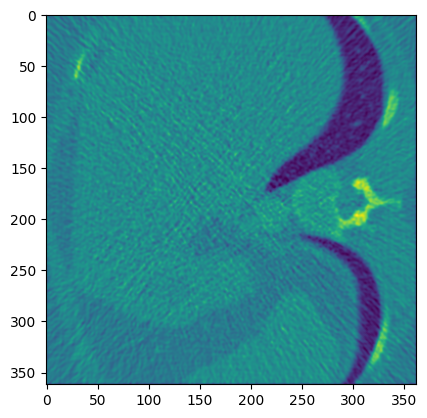

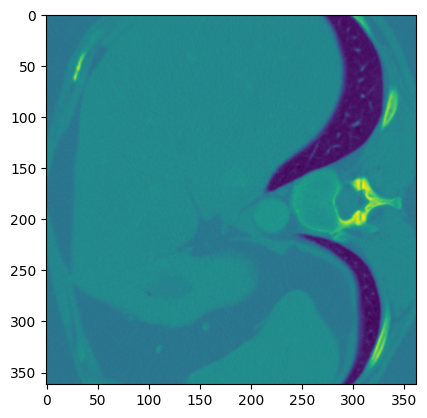

In [ ]:
plt.imshow(recos2[0])
plt.show()
plt.imshow(test_data_2.ground_truth[0])
plt.show()

# for i in range(3):
#   plot_images(test_data_2.ground_truth[i])

In [ ]:
print(_)

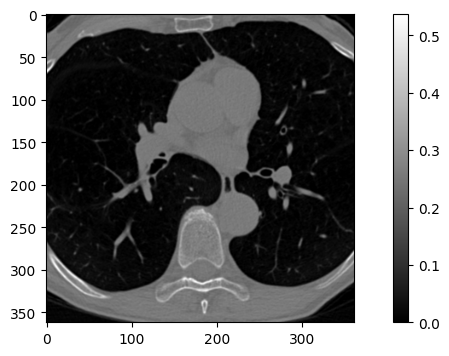

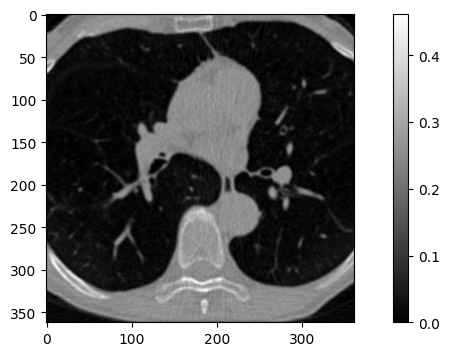

In [ ]:
a = plot_images([test_data_2.ground_truth[1]], fig_size=(10, 4))
b = plot_images([recos2[1]], fig_size=(10, 4))

In [ ]:
# Display the input to the model
# print("Input to model:")
# print(input_)
# print(input_.shape)
# print(input_.min(), input_.max())

# Display the output of the model before clamping
# print("\nOutput of model before clamping:")
# print(restored_)
# print(restored_.shape)
# print(restored_.min(), restored_.max())

# Display the model parameters
# print("\nModel parameters:")

# for name, param in model_restoration.named_parameters():
#     if param.requires_grad:
#         print(name, param.data)

# Building a Novel Hybrid -> Training the Transformer NN on 70K Images dataset

Images from
- Div2K
- WaterlooED
- Flickr2K
- BSD400

In [ ]:
# os.getcwd()
# %cd Restormer/Denoising

import datetime
import logging
import math
import time
# import os # Import the os module
from os import path as osp

from torch.utils import data as data
from torchvision.transforms.functional import normalize
# %cd Denoising/
# sys.path.append('/home/hiran/Restormer')

# direct basicsr if in ./Denoising
from basicsr.data import create_dataloader, create_dataset
from basicsr.data.data_sampler import EnlargedSampler
from basicsr.data.prefetch_dataloader import CPUPrefetcher, CUDAPrefetcher
from basicsr.models import create_model
from basicsr.utils import (MessageLogger, check_resume, get_env_info,
                           get_root_logger, get_time_str, init_tb_logger,
                           init_wandb_logger, make_exp_dirs, mkdir_and_rename,
                           set_random_seed)
from basicsr.utils.dist_util import get_dist_info, init_dist
from basicsr.utils.options import dict2str, parse

from basicsr.data.data_util import (paired_paths_from_folder,paired_DP_paths_from_folder,paired_paths_from_lmdb,paired_paths_from_meta_info_file,paths_from_lmdb)
from basicsr.data.transforms import augment, paired_random_crop, paired_random_crop_DP,random_augmentation
from basicsr.utils import FileClient, imfrombytes, img2tensor, padding, padding_DP,imfrombytesDP,scandir
import importlib
# importlib.reload(basicr.utils.scandir) # not a module, error

In [ ]:
# how to run train.sh for single gpu in bash
# chmod +x train_single_gpu.sh
# ./train_single_gpu.sh path/to/your_config.yml

In [ ]:
########### Downloading the Dataset ~30GB+

# !pip install gdown
# import gdown

# !python download_data.py --data train-test --noise gaussian

# shutil.unpack_archive('Datasets/Downloads/Flickr2K.zip', 'Datasets/Downloads')

# shutil.unpack_archive('Datasets/Downloads/DIV2K.zip', 'Datasets/Downloads')
# os.remove('Datasets/Downloads/DIV2K.zip')
# os.remove('Datasets/Downloads/Flickr2K.zip')

# !python generate_patches_dfwb.py
# shutil.rmtree('Datasets/Downloads') # REMEMBER to del and save 30GB+ # deleted

# gaussian_test = '1mwMLt-niNqcQpfN_ZduG9j4k6P_ZkOl0'   ## https://drive.google.com/file/d/1mwMLt-niNqcQpfN_ZduG9j4k6P_ZkOl0/view?usp=sharing

# print('Gaussian Denoising Testing Data!')
# gdown.download(id=gaussian_test, output='Datasets/test.zip', quiet=False)
# os.system(f'gdrive download {gaussian_test} --path Datasets/')
# print('Extracting Data...')
# shutil.unpack_archive('Datasets/test.zip', 'Datasets')
# os.remove('Datasets/test.zip')

#### Model Parameters

In [ ]:
########### _parameters_in_YAML

# this is a settings file, no use in running in plain colab. for hyper parameter tuning in YML
# sync changes from colab to YML periodically at ./Options/GaussianGrayDenoising_Restormer.YML

# general settings
name: GaussianGrayDenoising_Restormer
model_type: ImageCleanModel
scale: 1
num_gpu: 1 # 8  # set num_gpu: 0 for cpu mode
manual_seed: 100

# dataset and data loader settings
datasets:
  train:
    phase: train # added since, missing param for def train dataloader
    name: TrainSet
    type: Dataset_GaussianDenoising
    sigma_type: random
    sigma_range: [0,50]
    in_ch: 1    ## Grayscale image
    dataroot_gt: ./Datasets/train/DFWB
    dataroot_lq: none
    geometric_augs: true

    filename_tmpl: '{}'
    io_backend:
      type: disk

    # data loader
    use_shuffle: true
    num_worker_per_gpu: 4 # 8
    batch_size_per_gpu: 2 # 8

    ### -------------Progressive training--------------------------
    mini_batch_sizes: [2,1,1,1,1,1] # [8,5,4,2,1,1]             # Batch size per gpu
    iters: [92000,64000,48000,36000,36000,24000]
    gt_size: 320 # 384   # Max patch size for progressive training
    gt_sizes: [128,160,192,256,320] # [128,160,192,256,320,384]  # Patch sizes for progressive training.
    ### ------------------------------------------------------------

    ### ------- Training on single fixed-patch size 128x128---------
    # mini_batch_sizes: [8]
    # iters: [300000]
    # gt_size: 128
    # gt_sizes: [128]
    ### ------------------------------------------------------------

    dataset_enlarge_ratio: 1
    prefetch_mode: ~

  val:
    phase: val # added since, missing param for def train dataloader
    name: ValSet
    type: Dataset_GaussianDenoising
    sigma_test: 25
    in_ch: 1  ## Grayscale image
    dataroot_gt: ./Datasets/test/BSD68
    dataroot_lq: none
    io_backend:
      type: disk

# network structures
network_g:
  type: Restormer
  inp_channels: 1
  out_channels: 1
  dim: 48
  num_blocks: [4,6,6,8]
  num_refinement_blocks: 4
  heads: [1,2,4,8]
  ffn_expansion_factor: 2.66
  bias: False
  LayerNorm_type: BiasFree
  dual_pixel_task: False


# path
path:
  pretrain_network_g: ~
  strict_load_g: true
  resume_state: ~

# training settings
train:
  total_iter: 300000
  warmup_iter: -1 # no warm up
  use_grad_clip: true

  # Split 300k iterations into two cycles.
  # 1st cycle: fixed 3e-4 LR for 92k iters.
  # 2nd cycle: cosine annealing (3e-4 to 1e-6) for 208k iters.
  scheduler:
    type: CosineAnnealingRestartCyclicLR
    periods: [92000, 208000]
    restart_weights: [1,1]
    eta_mins: [0.0003,0.000001]

  mixing_augs:
    mixup: true
    mixup_beta: 1.2
    use_identity: true

  optim_g:
    type: AdamW
    lr: !!float 3e-4
    weight_decay: !!float 1e-4
    betas: [0.9, 0.999]

  # losses
  pixel_opt:
    type: L1Loss
    loss_weight: 1
    reduction: mean

# validation settings
val:
  window_size: 8
  val_freq: !!float 4e3
  save_img: false
  rgb2bgr: true
  use_image: false
  max_minibatch: 8

  metrics:
    psnr: # metric name, can be arbitrary
      type: calculate_psnr
      crop_border: 0
      test_y_channel: false

# logging settings
logger:
  print_freq: 1000
  save_checkpoint_freq: !!float 4e3
  use_tb_logger: true
  wandb:
    project: ~
    resume_id: ~

# dist training settings
dist_params:
  backend: nccl
  port: 29500

########### End_of_Params

In [ ]:
def parse_(opt_path: str, is_train: bool = True, launcher='none', local_rank=0) -> dict:
    """
    Read the YAML at opt_path and return a dict-like `opt`.
    is intentionally simple: it loads YAML via yaml.safe_load and returns the dict.
    can extend this to validate required fields, set defaults, or convert types.
    """
    p = Path(opt_path)
    if not p.exists():
        raise FileNotFoundError(f"YAML options file not found: {opt_path}")
    with p.open('r') as f:
        opt = yaml.safe_load(f)
    # ensure we have a dict
    if not isinstance(opt, dict):
        raise ValueError("Parsed YAML is not a mapping (dict).")
    # attach the is_train flag for convenience
    # opt['_is_train'] = bool(is_train)
    opt['is_train'] = bool(is_train)
    opt['launcher'] = launcher
    opt['local_rank'] = local_rank

    # distributed settings
    if opt['launcher']== 'none':
        opt['dist'] = False
        print('Disable distributed.', flush=True)
    else:
        opt['dist'] = True
        if opt['launcher'] == 'slurm' and 'dist_params' in opt:
            init_dist(opt['launcher'], **opt['dist_params'])
        else:
            init_dist(opt['launcher'])
            print('init dist .. ', opt['launcher'])

    opt['rank'], opt['world_size'] = get_dist_info()

    # random seed
    seed = opt.get('manual_seed')
    if seed is None:
        seed = random.randint(1, 10000)
        opt['manual_seed'] = seed
    set_random_seed(seed + opt['rank'])

    return opt

opt_path = './Options/GaussianGrayDenoising_Restormer.yml'
opt = parse_(opt_path, is_train=True, launcher='none', local_rank=0 )
opt

Disable distributed.


{'name': 'GaussianGrayDenoising_Restormer',
 'model_type': 'ImageCleanModel',
 'scale': 1,
 'num_gpu': 1,
 'manual_seed': 100,
 'datasets': {'train': {'phase': 'train',
   'name': 'TrainSet',
   'type': 'Dataset_GaussianDenoising',
   'sigma_type': 'random',
   'sigma_range': [0, 50],
   'in_ch': 1,
   'dataroot_gt': './Datasets/train/DFWB',
   'dataroot_lq': 'none',
   'geometric_augs': True,
   'filename_tmpl': '{}',
   'io_backend': {'type': 'disk'},
   'use_shuffle': True,
   'num_worker_per_gpu': 4,
   'batch_size_per_gpu': 2,
   'mini_batch_sizes': [2, 1, 1, 1, 1, 1],
   'iters': [92000, 64000, 48000, 36000, 36000, 24000],
   'gt_size': 320,
   'gt_sizes': [128, 160, 192, 256, 320],
   'dataset_enlarge_ratio': 1,
   'prefetch_mode': None},
  'val': {'phase': 'val',
   'name': 'ValSet',
   'type': 'Dataset_GaussianDenoising',
   'sigma_test': 25,
   'in_ch': 1,
   'dataroot_gt': './Datasets/test/BSD68',
   'dataroot_lq': 'none',
   'io_backend': {'type': 'disk'}}},
 'network_g': {

#### Training the Novel Hybrid Network

In [ ]:
# def parse_options(is_train=True): # parsed config from section 'Model Param'
#     parser = argparse.ArgumentParser()
#     parser.add_argument(
#         '-opt', type=str, required=True, help='Path to option YAML file.')
#     parser.add_argument(
#         '--launcher',
#         choices=['none', 'pytorch', 'slurm'],
#         default='none',
#         help='job launcher')
#     parser.add_argument('--local_rank', type=int, default=0)
#     args = parser.parse_args()
#     opt = parse(args.opt, is_train=is_train)

#     # distributed settings
#     if args.launcher == 'none':
#         opt['dist'] = False
#         print('Disable distributed.', flush=True)
#     else:
#         opt['dist'] = True
#         if args.launcher == 'slurm' and 'dist_params' in opt:
#             init_dist(args.launcher, **opt['dist_params'])
#         else:
#             init_dist(args.launcher)
#             print('init dist .. ', args.launcher)

#     opt['rank'], opt['world_size'] = get_dist_info()

#     return opt


def init_loggers(opt):
    log_file = osp.join('./experiments/logs/',
                        f"train_{opt['name']}_{get_time_str()}.log") # opt['path']['log'] was first argument
    logger = get_root_logger(
        logger_name='basicsr', log_level=logging.INFO, log_file=log_file)
    logger.info(get_env_info())
    logger.info(dict2str(opt))

    # initialize wandb logger before tensorboard logger to allow proper sync:
    if (opt['logger'].get('wandb')
            is not None) and (opt['logger']['wandb'].get('project')
                              is not None) and ('debug' not in opt['name']):
        assert opt['logger'].get('use_tb_logger') is True, (
            'should turn on tensorboard when using wandb')
        init_wandb_logger(opt)
    tb_logger = None
    if opt['logger'].get('use_tb_logger') and 'debug' not in opt['name']:
        tb_logger = init_tb_logger(log_dir=osp.join('tb_logger', opt['name']))
    return logger, tb_logger

# Dataset_GaussianDenoising
def create_train_val_dataloader(opt, logger):
    # create train and val dataloaders
    train_loader, val_loader = None, None
    for phase, dataset_opt in opt['datasets'].items():
        if phase == 'train':
            dataset_enlarge_ratio = dataset_opt.get('dataset_enlarge_ratio', 1)

            # generalisation tool - scale automatically alongside flipping, padding (bool)
            dataset_opt['scale'] = opt['scale']

            train_set = create_dataset(dataset_opt)
            train_sampler = EnlargedSampler(train_set, opt['world_size'],
                                            opt['rank'], dataset_enlarge_ratio)
            train_loader = create_dataloader(
                train_set,
                dataset_opt,
                num_gpu=opt['num_gpu'],
                dist=opt['dist'],
                sampler=train_sampler,
                seed=opt['manual_seed'])

            num_iter_per_epoch = math.ceil(
                len(train_set) * dataset_enlarge_ratio /
                (dataset_opt['batch_size_per_gpu'] * opt['world_size']))
            total_iters = int(opt['train']['total_iter'])
            total_epochs = math.ceil(total_iters / (num_iter_per_epoch))
            logger.info(
                'Training statistics:'
                f'\n\tNumber of train images: {len(train_set)}'
                f'\n\tDataset enlarge ratio: {dataset_enlarge_ratio}'
                f'\n\tBatch size per gpu: {dataset_opt["batch_size_per_gpu"]}'
                f'\n\tWorld size (gpu number): {opt["world_size"]}'
                f'\n\tRequire iter number per epoch: {num_iter_per_epoch}'
                f'\n\tTotal epochs: {total_epochs}; iters: {total_iters}.')

        elif phase == 'val':
            val_set = create_dataset(dataset_opt)
            val_loader = create_dataloader(
                val_set,
                dataset_opt,
                num_gpu=opt['num_gpu'],
                dist=opt['dist'],
                sampler=None,
                seed=opt['manual_seed'])
            logger.info(
                f'Number of val images/folders in {dataset_opt["name"]}: '
                f'{len(val_set)}')
        else:
            raise ValueError(f'Dataset phase {phase} is not recognized.')

    return train_loader, train_sampler, val_loader, total_epochs, total_iters


# def main(): # indent again when complete

# parse options, set distributed setting, set ramdom seed
# opt = parse_options(is_train=True) # opt dict created earlier in this section

# random seed
seed = opt.get('manual_seed')
if seed is None:
    seed = random.randint(1, 10000)
    opt['manual_seed'] = seed
set_random_seed(seed + opt['rank'])

# Add the missing 'experiments_root' key to the 'path' dictionary
if 'experiments_root' not in opt['path']:
  opt['path']['experiments_root'] = './experiments/experiments'

# Add the missing 'log' key to the 'path' dictionary
if 'log' not in opt['path']:
  opt['path']['log'] = './experiments/logs'

# Add the missing 'models' key to the 'path' dictionary
if 'models' not in opt['path']:
   opt['path']['models'] = './model_zoo'

# Add the missing 'training_states' key to the 'path' dictionary
if 'training_states' not in opt['path']:
   opt['path']['training_states'] = './experiments/training_states'

# Add the missing 'train val dataset' augmentation scaling factor
opt['datasets']['train']['scale'] = opt['scale']
opt['datasets']['val']['scale'] = opt['scale']

torch.backends.cudnn.benchmark = True
# torch.backends.cudnn.deterministic = True

# automatic resume ..
state_folder_path = 'experiments/{}/training_states/'.format(opt['name'])
import os
try:
    states = os.listdir(state_folder_path)
except:
    states = []

resume_state = None
if len(states) > 0:
    max_state_file = '{}.state'.format(max([int(x[0:-6]) for x in states]))
    resume_state = os.path.join(state_folder_path, max_state_file)
    opt['path']['resume_state'] = resume_state

# load resume states if necessary
if opt['path'].get('resume_state'):
    device_id = torch.cuda.current_device()
    resume_state = torch.load(
        opt['path']['resume_state'],
        map_location=lambda storage, loc: storage.cuda(device_id))
else:
    resume_state = None

# mkdir for experiments and logger # if error confirm that experiment path doesn't end with /
# sys.path.append('/home/hiran/Restormer')
# sys.path.remove('/home/hiran/Restormer')
# %cd Denoising/
# os.getcwd()

if resume_state is None:
    # # Modified mkdir_and_rename to handle non-existent directories
    # def mkdir_and_rename_modified(path):
    #     if os.path.exists(path):
    #         new_name = path + '_archived_' + get_time_str()
    #         print(f'Path already exists. Rename it to {new_name}', flush=True)
    #         os.rename(path, new_name)
    #     os.makedirs(path, exist_ok=True)

    # # Replace the original mkdir_and_rename with the modified one
    # original_mkdir_and_rename = mkdir_and_rename
    # mkdir_and_rename = mkdir_and_rename_modified

    make_exp_dirs(opt)

    # # Restore the original mkdir_and_rename
    # mkdir_and_rename = original_mkdir_and_rename

    if opt['logger'].get('use_tb_logger') and 'debug' not in opt[
            'name'] and opt['rank'] == 0:
        mkdir_and_rename(osp.join('tb_logger', opt['name']))

# initialize loggers
logger, tb_logger = init_loggers(opt)

# create train and validation dataloaders
result = create_train_val_dataloader(opt, logger) # if scandir error pls. import from above
train_loader, train_sampler, val_loader, total_epochs, total_iters = result

# create model
if resume_state:  # resume training
    check_resume(opt, resume_state['iter'])
    model = create_model(opt)
    model.resume_training(resume_state)  # handle optimizers and schedulers
    logger.info(f"Resuming training from epoch: {resume_state['epoch']}, "
                f"iter: {resume_state['iter']}.")
    start_epoch = resume_state['epoch']
    current_iter = resume_state['iter']
else:
    model = create_model(opt)
    start_epoch = 0
    current_iter = 0

# create message logger (formatted outputs)
msg_logger = MessageLogger(opt, current_iter, tb_logger)

# dataloader prefetcher
prefetch_mode = opt['datasets']['train'].get('prefetch_mode')
if prefetch_mode is None or prefetch_mode == 'cpu':
    prefetcher = CPUPrefetcher(train_loader)
elif prefetch_mode == 'cuda':
    prefetcher = CUDAPrefetcher(train_loader, opt)
    logger.info(f'Use {prefetch_mode} prefetch dataloader')
    if opt['datasets']['train'].get('pin_memory') is not True:
        raise ValueError('Please set pin_memory=True for CUDAPrefetcher.')
else:
    raise ValueError(f'Wrong prefetch_mode {prefetch_mode}.'
                      "Supported ones are: None, 'cuda', 'cpu'.")

# training
logger.info(
    f'Start training from epoch: {start_epoch}, iter: {current_iter}')
data_time, iter_time = time.time(), time.time()
start_time = time.time()

# for epoch in range(start_epoch, total_epochs + 1):

iters = opt['datasets']['train'].get('iters')
batch_size = opt['datasets']['train'].get('batch_size_per_gpu')
mini_batch_sizes = opt['datasets']['train'].get('mini_batch_sizes')
gt_size = opt['datasets']['train'].get('gt_size')
mini_gt_sizes = opt['datasets']['train'].get('gt_sizes')

groups = np.array([sum(iters[0:i + 1]) for i in range(0, len(iters))])

logger_j = [True] * len(groups)

scale = opt['scale']

epoch = start_epoch
while current_iter <= total_iters:
    train_sampler.set_epoch(epoch)
    prefetcher.reset()
    train_data = prefetcher.next()

    while train_data is not None:
        data_time = time.time() - data_time

        current_iter += 1
        if current_iter > total_iters:
            break
        # update learning rate
        model.update_learning_rate(
            current_iter, warmup_iter=opt['train'].get('warmup_iter', -1))


        ### ------Progressive learning ---------------------
        j = ((current_iter>groups) !=True).nonzero()[0]
        if len(j) == 0:
            bs_j = len(groups) - 1
        else:
            bs_j = j[0]

        mini_gt_size = mini_gt_sizes[bs_j]
        mini_batch_size = mini_batch_sizes[bs_j]

        if logger_j[bs_j]:
            logger.info('\n Updating Patch_Size to {} and Batch_Size to {} \n'.format(mini_gt_size, mini_batch_size*torch.cuda.device_count()))
            logger_j[bs_j] = False

        lq = train_data['lq']
        gt = train_data['gt']

        if mini_batch_size < batch_size:
            indices = random.sample(range(0, batch_size), k=mini_batch_size)
            lq = lq[indices]
            gt = gt[indices]

        if mini_gt_size < gt_size:
            x0 = int((gt_size - mini_gt_size) * random.random())
            y0 = int((gt_size - mini_gt_size) * random.random())
            x1 = x0 + mini_gt_size
            y1 = y0 + mini_gt_size
            lq = lq[:,:,x0:x1,y0:y1]
            gt = gt[:,:,x0*scale:x1*scale,y0*scale:y1*scale]
        ###-------------------------------------------


        model.feed_train_data({'lq': lq, 'gt':gt})
        model.optimize_parameters(current_iter)

        iter_time = time.time() - iter_time
        # log
        if current_iter % opt['logger']['print_freq'] == 0:
            log_vars = {'epoch': epoch, 'iter': current_iter}
            log_vars.update({'lrs': model.get_current_learning_rate()})
            log_vars.update({'time': iter_time, 'data_time': data_time})
            log_vars.update(model.get_current_log())
            msg_logger(log_vars)

        # save models and training states
        if current_iter % opt['logger']['save_checkpoint_freq'] == 0:
            logger.info('Saving models and training states.')
            model.save(epoch, current_iter)

        # validation
        if opt.get('val') is not None and (current_iter %
                                            opt['val']['val_freq'] == 0):
            rgb2bgr = opt['val'].get('rgb2bgr', True)
            # wheather use uint8 image to compute metrics
            use_image = opt['val'].get('use_image', True)
            model.validation(val_loader, current_iter, tb_logger,
                              opt['val']['save_img'], rgb2bgr, use_image )

        data_time = time.time()
        iter_time = time.time()
        train_data = prefetcher.next()
    # end of iter
    epoch += 1

# end of epoch

consumed_time = str(
    datetime.timedelta(seconds=int(time.time() - start_time)))
logger.info(f'End of training. Time consumed: {consumed_time}')
logger.info('Save the latest model.')
model.save(epoch=-1, current_iter=-1)  # -1 stands for the latest
if opt.get('val') is not None:
    model.validation(val_loader, current_iter, tb_logger,
                      opt['val']['save_img'])
if tb_logger:
    tb_logger.close()


# if __name__ == '__main__':
#     main()

'/home/hiran/Restormer/Denoising'

# Training Transformer NN on real CT scans - Lodopab dataset (80K 362x362 CT scans)

#### Creating the low density CT dataset

In [ ]:
LOG_DIR2 = '../../logs/lodopab_restormer_Gaussian'
SAVE_BEST_LEARNED_PARAMS_PATH2 = '../../params/lodopab_restormer_Gaussian'

In [ ]:
# load FBP model

# from ctexample section
reconstructor = FBPReconstructor(ray_trafo_lodopab, hyper_params={
    'filter_type': 'Hann',
    'frequency_scaling': 0.8})

In [ ]:
lq_path = '/home/hiran/Restormer/Denoising/Datasets/train_RetrainCT/lq/'
gt_path = '/home/hiran/Restormer/Denoising/Datasets/train_RetrainCT/gt/'

def create_LD_ds(train_ds, lq_path, gt_path):
  idx = 0
  with torch.no_grad(): # save memory by not calc gradient
    for obs, gt in train_ds:
      torch.cuda.ipc_collect() # collects unnecessary inter-process comm.s and free VRAM
      torch.cuda.empty_cache()

      # return odl elem H,W 362, 362 with normalized pixel vals
      reco = reconstructor.reconstruct(obs)

      reco_arr = odl_to_single(reco) # return 3d np arr H,W,C:1
      reco_uint = utilsImg.single2uint(reco_arr)
      lq_nm = lq_path+str(idx)+'.png'
      utilsImg.imsave(reco_uint, lq_nm ) # input 3d - np arr

      gt_3d = odl_to_single( gt ) # return 3d np arr H,W,C:1
      gt_uint = utilsImg.single2uint(gt_3d)
      gt_2d = gt_uint.squeeze()
      gt_nm = gt_path+str(idx)+'.png'
      cv2.imwrite(gt_nm, gt_2d) # input 2d - arr
      idx +=1

# create_LD_ds(train_ds,lq_path,gt_path)

val_lq_path = '/home/hiran/Restormer/Denoising/Datasets/validation_RetrainCT/lq/'
val_gt_path = '/home/hiran/Restormer/Denoising/Datasets/validation_RetrainCT/gt/'

# create_LD_ds(validation_data, val_lq_path, val_gt_path)


#### Some Preprocessing steps

In [ ]:
# Many incompatibilities in git, better sync with my gdrive
# Clone Restormer
# !git clone https://github.com/swz30/Restormer.git

In [ ]:
# if running in gdrive

# %cd # for cd root
# from google.colab import drive # or use left panel UI
# drive.mount('/content/gdrive')
# os.getcwd()
# %cd /content/drive/MyDrive/Colab Notebooks/Restormer_1209/Denoising

# if in a local setup

if os.getcwd() != '/home/hiran/Restormer/Denoising':
  raise ImportError
# %cd Restormer/Denoising

In [ ]:
# !pip install gdown
# import gdown
# !pip install gdrive
# import gdrive

# !python download_data.py --data train-test --noise gaussian

# shutil.unpack_archive('Datasets/Downloads/Flickr2K.zip', 'Datasets/Downloads')

# shutil.unpack_archive('Datasets/Downloads/DIV2K.zip', 'Datasets/Downloads')
# os.remove('Datasets/Downloads/DIV2K.zip')
# os.remove('Datasets/Downloads/Flickr2K.zip')

# !python generate_patches_dfwb.py
# os.remove('Datasets/Downloads') # REMEMBER to del and save 30GB+

# gaussian_test = '1mwMLt-niNqcQpfN_ZduG9j4k6P_ZkOl0'   ## https://drive.google.com/file/d/1mwMLt-niNqcQpfN_ZduG9j4k6P_ZkOl0/view?usp=sharing

# print('Gaussian Denoising Testing Data!')
# gdown.download(id=gaussian_test, output='Datasets/test.zip', quiet=False)
# os.system(f'gdrive download {gaussian_test} --path Datasets/')
# print('Extracting Data...')
# shutil.unpack_archive('Datasets/test.zip', 'Datasets')
# os.remove('Datasets/test.zip')

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.3/8.3 MB 97.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 952.6/952.6 kB 53.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.8/46.8 kB 3.3 MB/s eta 0:00:00
  Attempting uninstall: wheel
    Found existing installation: wheel 0.45.1
    Uninstalling wheel-0.45.1:
      Successfully uninstalled wheel-0.45.1
  Attempting uninstall: setuptools
    Found existing installation: setuptools 75.2.0
    Uninstalling setuptools-75.2.0:
      Successfully uninstalled setuptools-75.2.0
  Attempting uninstall: google-auth-oauthlib
    Found existing installation: google-auth-oauthlib 1.2.2
    Uninstalling google-auth-oauthlib-1.2.2:
      Successfully uninstalled google-auth-oauthlib-1.2.2
  Attempting uninstall: google-api-python-client
    Found existing installation: google-api-python-client 2.181.0
    Uninstalling google-api-python-client-2.181.0:
      Successfully uninstalled google-api-python-client-2.181.0
ERRO

#### Parameters - For Training Hybrid Transformer Model

In [ ]:
# this is a settings file, no use in running in plain colab. it's hyperparam, param in a .YML
# sync changes from below cell to .YML at ./Options/GaussianGrayDenoising_Restormer_RetrainCT.YML

# general settings
name: GrayDenoising_Restormer_RetrainCT4
model_type: ImageCleanModel
scale: 1
num_gpu: 1 # 8  # set num_gpu: 0 for cpu mode
manual_seed: 100

# dataset and data loader settings
datasets:
  train:
    phase: train # added since, missing param for def train dataloader
    name: TrainSet
    type: Dataset_GaussianDenoising
    sigma_type: random
    sigma_range: [0,50]
    in_ch: 1    ## Grayscale image
    dataroot_gt: ./Datasets/train_RetrainCT/gt # ct loc
    dataroot_lq: ./Datasets/train_RetrainCT/lq # ct loc
    geometric_augs: true

    filename_tmpl: '{}'
    io_backend:
      type: disk

    # data loader
    use_shuffle: true
    num_worker_per_gpu: 4 # 8
    batch_size_per_gpu: 4 # 2 # 8

    ### -------------Progressive training--------------------------
    mini_batch_sizes: [4,2,1,1] # [2,1,1,1,1,1] # [8,5,4,2,1,1] # for 40GB VRAM? Batch size per gpu
    iters: [12000,8000,4000,2000] # [92000,64000,48000,36000] # [92000,64000,48000,36000,36000,24000]
    gt_size: 256 # 320 OOM err # 384   # Max patch size for progressive training
    gt_sizes: [128,160,192,256] # [128,160,192,256,320] OOM err # [128,160,192,256,320,384]  # Patch sizes for progressive training.
    ### ------------------------------------------------------------

    ### ------- Training on single fixed-patch size 128x128---------
    # mini_batch_sizes: [4] # [8] for 40GB VRAM?
    # iters: [12000] # [24000]for experimenting # [300000] # original setup
    # gt_size: 128
    # gt_sizes: [128]
    ### ------------------------------------------------------------

    dataset_enlarge_ratio: 1
    prefetch_mode: ~ # cuda # ~
    # pin_memory: true # new experiment

  val:
    phase: val # added since, missing param for def train dataloader
    name: ValSet
    type: Dataset_GaussianDenoising
    sigma_test: 25
    in_ch: 1  ## Grayscale image
    dataroot_gt: ./Datasets/validation_RetrainCT/gt # ./Datasets/test/BSD68
    dataroot_lq: ./Datasets/validation_RetrainCT/lq # none
    io_backend:
      type: disk

# network structures
network_g:
  type: Restormer
  inp_channels: 1
  out_channels: 1
  dim: 48
  num_blocks: [4,6,6,8]
  num_refinement_blocks: 4
  heads: [1,2,4,8]
  ffn_expansion_factor: 2.66
  bias: False
  LayerNorm_type: BiasFree
  dual_pixel_task: False


# path
path:
  pretrain_network_g: ~
  strict_load_g: true
  resume_state: ~

# training settings
train:
  total_iter: 26000 # 26K for progressive 12000 for fixed patch # 24000 # for experimenting single fixed-patch # 240000 for 16GB VRAM progressive # 300000 # Original setup
  warmup_iter: -1 # no warm up
  use_grad_clip: true

  # Split 300k iterations into two cycles.
  # 1st cycle: fixed 3e-4 LR for 92k iters.
  # 2nd cycle: cosine annealing (3e-4 to 1e-6) for 208k iters.
  scheduler:
    type: CosineAnnealingRestartCyclicLR
    periods: [8000, 18000] # [3680, 8320] # [7360, 16640] # for experimenting single patch # [92000, 208000] # original setup
    restart_weights: [1,1]
    eta_mins: [0.0003,0.000001]

  mixing_augs:
    mixup: true
    mixup_beta: 1.2
    use_identity: true

  optim_g:
    type: AdamW
    lr: !!float 3e-4
    weight_decay: !!float 1e-4
    betas: [0.9, 0.999]

  # losses
  pixel_opt:
    type: L1Loss
    loss_weight: 1
    reduction: mean

# validation settings
val:
  window_size: 8
  val_freq: !!float 4e3
  save_img: false # true
  rgb2bgr: true
  use_image: true # false original
  max_minibatch: 4 # 3 # 8

  metrics:
    psnr: # metric name, can be arbitrary
      type: calculate_psnr
      crop_border: 0
      test_y_channel: false

# logging settings
logger:
  print_freq: 1000
  save_checkpoint_freq: !!float 6e3 # 4e3
  use_tb_logger: true
  wandb:
    project: ~
    resume_id: ~

# dist training settings
dist_params:
  backend: nccl
  port: 29500

In [ ]:
# function to bypass argparse since training in Colab

sys.path.append('/home/hiran/Restormer') # local
# sys.path.append('/content/drive/MyDrive/Colab Notebooks/Restormer_1209') # gdrive

import datetime
import logging
import math
import time
# import os # Import the os module
from os import path as osp

from torch.utils import data as data
from torchvision.transforms.functional import normalize
# %cd Denoising/

# direct basicsr if in ./Denoising
# !pip install lmdb
from basicsr.data import create_dataloader, create_dataset
from basicsr.data.data_sampler import EnlargedSampler
from basicsr.data.prefetch_dataloader import CPUPrefetcher, CUDAPrefetcher
from basicsr.models import create_model
from basicsr.utils import (MessageLogger, check_resume, get_env_info,
                           get_root_logger, get_time_str, init_tb_logger,
                           init_wandb_logger, make_exp_dirs, mkdir_and_rename,
                           set_random_seed)
from basicsr.utils.dist_util import get_dist_info, init_dist
from basicsr.utils.options import dict2str, parse

from basicsr.data.data_util import (paired_paths_from_folder,paired_DP_paths_from_folder,paired_paths_from_lmdb,paired_paths_from_meta_info_file,paths_from_lmdb)
from basicsr.data.transforms import augment, paired_random_crop, paired_random_crop_DP,random_augmentation
from basicsr.utils import FileClient, imfrombytes, img2tensor, padding, padding_DP,imfrombytesDP,scandir
import importlib
# importlib.reload(basicr.utils.scandir) # not a module, error

def parse_(opt_path: str, is_train: bool = True, launcher='none', local_rank=0) -> dict:
    """
    Read the YAML at opt_path and return a dict-like `opt`.
    is intentionally simple: it loads YAML via yaml.safe_load and returns the dict.
    can extend this to validate required fields, set defaults, or convert types.
    """
    p = Path(opt_path)
    if not p.exists():
        raise FileNotFoundError(f"YAML options file not found: {opt_path}")
    with p.open('r') as f:
        opt = yaml.safe_load(f)
    # ensure we have a dict
    if not isinstance(opt, dict):
        raise ValueError("Parsed YAML is not a mapping (dict).")
    # attach the is_train flag for convenience
    # opt['_is_train'] = bool(is_train)
    opt['is_train'] = bool(is_train)
    opt['launcher'] = launcher
    opt['local_rank'] = local_rank

    # distributed settings
    if opt['launcher']== 'none':
        opt['dist'] = False
        # print('Disable distributed.', flush=True)
    else:
        opt['dist'] = True
        if opt['launcher'] == 'slurm' and 'dist_params' in opt:
            init_dist(opt['launcher'], **opt['dist_params'])
        else:
            init_dist(opt['launcher'])
            print('init dist .. ', opt['launcher'])

    opt['rank'], opt['world_size'] = get_dist_info()

    # random seed
    seed = opt.get('manual_seed')
    if seed is None:
        seed = random.randint(1, 10000)
        opt['manual_seed'] = seed
    set_random_seed(seed + opt['rank'])

    return opt

opt_path = './Options/GrayDenoising_Restormer_RetrainCT4.yml'
del opt
opt = parse_(opt_path, is_train=True, launcher='none', local_rank=0 )
opt

{'name': 'GrayDenoising_Restormer_RetrainCT4',
 'model_type': 'ImageCleanModel',
 'scale': 1,
 'num_gpu': 1,
 'manual_seed': 100,
 'datasets': {'train': {'phase': 'train',
   'name': 'TrainSet',
   'type': 'Dataset_GaussianDenoising',
   'sigma_type': 'random',
   'sigma_range': [0, 50],
   'in_ch': 1,
   'dataroot_gt': './Datasets/train_RetrainCT/gt',
   'dataroot_lq': './Datasets/train_RetrainCT/lq',
   'geometric_augs': True,
   'filename_tmpl': '{}',
   'io_backend': {'type': 'disk'},
   'use_shuffle': True,
   'num_worker_per_gpu': 4,
   'batch_size_per_gpu': 4,
   'mini_batch_sizes': [4, 2, 1, 1],
   'iters': [12000, 8000, 4000, 2000],
   'gt_size': 256,
   'gt_sizes': [128, 160, 192, 256],
   'dataset_enlarge_ratio': 1,
   'prefetch_mode': None},
  'val': {'phase': 'val',
   'name': 'ValSet',
   'type': 'Dataset_GaussianDenoising',
   'sigma_test': 25,
   'in_ch': 1,
   'dataroot_gt': './Datasets/validation_RetrainCT/gt',
   'dataroot_lq': './Datasets/validation_RetrainCT/lq',
 

In [ ]:
# some new configs specific to below setup which we didn't place inside YML

# Add the missing 'experiments_root' key to the 'path' dictionary
if 'experiments_root' not in opt['path']:
  opt['path']['experiments_root'] = f'./experiments/{opt["name"]}'

# Add the missing 'log' key to the 'path' dictionary
if 'log' not in opt['path']:
  opt['path']['log'] = f"{opt['path']['experiments_root']}/logs"

# Add the missing 'models' key to the 'path' dictionary
if 'models' not in opt['path']:
   opt['path']['models'] = f"./model_zoo/{opt['name']}"

# Add the missing 'training_states' key to the 'path' dictionary
if 'training_states' not in opt['path']:
   opt['path']['training_states'] = f"{opt['path']['experiments_root']}/training_states"

if 'visualization' not in opt['path']:
    opt['path']['visualization'] = f"{opt['path']['experiments_root']}/visuals"

# Add the missing augmentation scaling factor parameter specified to 'train & val dataset'
opt['datasets']['train']['scale'] = opt['scale']
opt['datasets']['val']['scale'] = opt['scale']

#### Training the Novel Hybrid Network

In [ ]:
def init_loggers(opt):
    log_file = osp.join(opt['path']['log'],
                        f"train_{opt['name']}_{get_time_str()}.log") # for first argument './experiments/logs/' works as well
    logger = get_root_logger(
        logger_name='basicsr', log_level=logging.INFO, log_file=log_file)
    logger.info(get_env_info())
    logger.info(dict2str(opt))

    # initialize wandb logger before tensorboard logger to allow proper sync:
    if (opt['logger'].get('wandb')
            is not None) and (opt['logger']['wandb'].get('project')
                              is not None) and ('debug' not in opt['name']):
        assert opt['logger'].get('use_tb_logger') is True, (
            'should turn on tensorboard when using wandb')
        init_wandb_logger(opt)
    tb_logger = None
    if opt['logger'].get('use_tb_logger') and 'debug' not in opt['name']:
        tb_logger = init_tb_logger(log_dir=osp.join('tb_logger', opt['name']))
    return logger, tb_logger

# Dataset_GaussianDenoising
def create_train_val_dataloader(opt, logger):
    # create train and val dataloaders
    train_loader, val_loader = None, None
    for phase, dataset_opt in opt['datasets'].items():
        if phase == 'train':
            dataset_enlarge_ratio = dataset_opt.get('dataset_enlarge_ratio', 1)

            # generalisation tool - scale automatically alongside flipping, padding (bool)
            dataset_opt['scale'] = opt['scale']

            train_set = create_dataset(dataset_opt)
            train_sampler = EnlargedSampler(train_set, opt['world_size'],
                                            opt['rank'], dataset_enlarge_ratio)
            train_loader = create_dataloader(
                train_set,
                dataset_opt,
                num_gpu=opt['num_gpu'],
                dist=opt['dist'],
                sampler=train_sampler,
                seed=opt['manual_seed'])

            num_iter_per_epoch = math.ceil(
                len(train_set) * dataset_enlarge_ratio /
                (dataset_opt['batch_size_per_gpu'] * opt['world_size']))
            total_iters = int(opt['train']['total_iter'])
            total_epochs = math.ceil(total_iters / (num_iter_per_epoch))
            logger.info(
                'Training statistics:'
                f'\n\tNumber of train images: {len(train_set)}'
                f'\n\tDataset enlarge ratio: {dataset_enlarge_ratio}'
                f'\n\tBatch size per gpu: {dataset_opt["batch_size_per_gpu"]}'
                f'\n\tWorld size (gpu number): {opt["world_size"]}'
                f'\n\tRequire iter number per epoch: {num_iter_per_epoch}'
                f'\n\tTotal epochs: {total_epochs}; iters: {total_iters}.')

        elif phase == 'val':
            val_set = create_dataset(dataset_opt)
            val_loader = create_dataloader(
                val_set,
                dataset_opt,
                num_gpu=opt['num_gpu'],
                dist=opt['dist'],
                sampler=None,
                seed=opt['manual_seed'])
            logger.info(
                f'Number of val images/folders in {dataset_opt["name"]}: '
                f'{len(val_set)}')
        else:
            raise ValueError(f'Dataset phase {phase} is not recognized.')

    return train_loader, train_sampler, val_loader, total_epochs, total_iters


# def main(): # indent again when complete

# parse options, set distributed setting, set ramdom seed
# opt = parse_options(is_train=True) # opt dict created earlier in this section
# random seed
seed = opt.get('manual_seed')
if seed is None:
    seed = random.randint(1, 10000)
    opt['manual_seed'] = seed
set_random_seed(seed + opt['rank'])

torch.backends.cudnn.benchmark = True
# torch.backends.cudnn.deterministic = True

# automatic resume ..
# state_folder_path = 'experiments/{}/training_states/'.format(opt['name'])
state_folder_path = '{}/{}/'.format(opt['path']['training_states'],opt['name'])

# import os
try:
    states = os.listdir(state_folder_path)
except:
    states = []

resume_state = None
if len(states) > 0:
    max_state_file = '{}.state'.format(max([int(x[0:-6]) for x in states]))
    resume_state = os.path.join(state_folder_path, max_state_file)
    opt['path']['resume_state'] = resume_state

# load resume states if necessary
if opt['path'].get('resume_state'):
    device_id = torch.cuda.current_device()
    resume_state = torch.load(
        opt['path']['resume_state'],
        map_location=lambda storage, loc: storage.cuda(device_id))
else:
    resume_state = None

if resume_state is None:
    # # Modified mkdir_and_rename to handle non-existent directories
    # def mkdir_and_rename_modified(path):
    #     if os.path.exists(path):
    #         new_name = path + '_archived_' + get_time_str()
    #         print(f'Path already exists. Rename it to {new_name}', flush=True)
    #         os.rename(path, new_name)
    #     os.makedirs(path, exist_ok=True)

    # # Replace the original mkdir_and_rename with the modified one
    # original_mkdir_and_rename = mkdir_and_rename
    # mkdir_and_rename = mkdir_and_rename_modified

    make_exp_dirs(opt)

    # # Restore the original mkdir_and_rename
    # mkdir_and_rename = original_mkdir_and_rename

    if opt['logger'].get('use_tb_logger') and 'debug' not in opt[
            'name'] and opt['rank'] == 0:
        mkdir_and_rename(osp.join('tb_logger', opt['name']))

# initialize loggers
logger, tb_logger = init_loggers(opt)

# create train and validation dataloaders
result = create_train_val_dataloader(opt, logger) # if scandir error pls. import from above
train_loader, train_sampler, val_loader, total_epochs, total_iters = result

# create model
if resume_state:  # resume training
    check_resume(opt, resume_state['iter'])
    model = create_model(opt)
    model.resume_training(resume_state)  # handle optimizers and schedulers
    logger.info(f"Resuming training from epoch: {resume_state['epoch']}, "
                f"iter: {resume_state['iter']}.")
    start_epoch = resume_state['epoch']
    current_iter = resume_state['iter']
else:
    model = create_model(opt)
    start_epoch = 0
    current_iter = 0

# create message logger (formatted outputs)
msg_logger = MessageLogger(opt, current_iter, tb_logger)

# dataloader prefetcher
prefetch_mode = opt['datasets']['train'].get('prefetch_mode')
if prefetch_mode is None or prefetch_mode == 'cpu':
    prefetcher = CPUPrefetcher(train_loader)
elif prefetch_mode == 'cuda':
    prefetcher = CUDAPrefetcher(train_loader, opt)
    logger.info(f'Use {prefetch_mode} prefetch dataloader')
    if opt['datasets']['train'].get('pin_memory') is not True:
        raise ValueError('Please set pin_memory=True for CUDAPrefetcher.')
else:
    raise ValueError(f'Wrong prefetch_mode {prefetch_mode}.'
                      "Supported ones are: None, 'cuda', 'cpu'.")

# training
logger.info(
    f'Start training from epoch: {start_epoch}, iter: {current_iter}')
data_time, iter_time = time.time(), time.time()
start_time = time.time()

# for epoch in range(start_epoch, total_epochs + 1):

iters = opt['datasets']['train'].get('iters')
batch_size = opt['datasets']['train'].get('batch_size_per_gpu')
mini_batch_sizes = opt['datasets']['train'].get('mini_batch_sizes')
gt_size = opt['datasets']['train'].get('gt_size')
mini_gt_sizes = opt['datasets']['train'].get('gt_sizes')

groups = np.array([sum(iters[0:i + 1]) for i in range(0, len(iters))])

logger_j = [True] * len(groups)

scale = opt['scale']

epoch = start_epoch
while current_iter <= total_iters:
    train_sampler.set_epoch(epoch)
    prefetcher.reset()
    train_data = prefetcher.next()

    while train_data is not None:
        data_time = time.time() - data_time

        current_iter += 1
        if current_iter > total_iters:
            break
        # update learning rate
        model.update_learning_rate(
            current_iter, warmup_iter=opt['train'].get('warmup_iter', -1))


        ### ------Progressive learning ---------------------
        j = ((current_iter>groups) !=True).nonzero()[0]
        if len(j) == 0:
            bs_j = len(groups) - 1
        else:
            bs_j = j[0]

        mini_gt_size = mini_gt_sizes[bs_j]
        mini_batch_size = mini_batch_sizes[bs_j]

        if logger_j[bs_j]:
            logger.info('\n Updating Patch_Size to {} and Batch_Size to {} \n'.format(mini_gt_size, mini_batch_size*torch.cuda.device_count()))
            logger_j[bs_j] = False

        lq = train_data['lq']
        gt = train_data['gt']

        if mini_batch_size < batch_size:
            indices = random.sample(range(0, batch_size), k=mini_batch_size)
            lq = lq[indices]
            gt = gt[indices]

        if mini_gt_size < gt_size:
            x0 = int((gt_size - mini_gt_size) * random.random())
            y0 = int((gt_size - mini_gt_size) * random.random())
            x1 = x0 + mini_gt_size
            y1 = y0 + mini_gt_size
            lq = lq[:,:,x0:x1,y0:y1]
            gt = gt[:,:,x0*scale:x1*scale,y0*scale:y1*scale]
        ###-------------------------------------------


        model.feed_train_data({'lq': lq, 'gt':gt})
        model.optimize_parameters(current_iter)

        iter_time = time.time() - iter_time
        # log
        if current_iter % opt['logger']['print_freq'] == 0:
            log_vars = {'epoch': epoch, 'iter': current_iter}
            log_vars.update({'lrs': model.get_current_learning_rate()})
            log_vars.update({'time': iter_time, 'data_time': data_time})
            log_vars.update(model.get_current_log())
            msg_logger(log_vars)

        # save models and training states
        if current_iter % opt['logger']['save_checkpoint_freq'] == 0:
            logger.info('Saving models and training states.')
            model.save(epoch, current_iter)

        # validation
        if opt.get('val') is not None and (current_iter %
                                            opt['val']['val_freq'] == 0):
            rgb2bgr = opt['val'].get('rgb2bgr', True)
            # wheather use uint8 image to compute metrics
            use_image = opt['val'].get('use_image', True)
            model.validation(val_loader, current_iter, tb_logger,
                              opt['val']['save_img'], rgb2bgr, use_image )

        data_time = time.time()
        iter_time = time.time()
        train_data = prefetcher.next()
    # end of iter
    epoch += 1

# end of epoch

consumed_time = str(
    datetime.timedelta(seconds=int(time.time() - start_time)))
logger.info(f'End of training. Time consumed: {consumed_time}')
logger.info('Save the latest model.')
model.save(epoch=-1, current_iter=-1)  # -1 stands for the latest
if opt.get('val') is not None:
    model.validation(val_loader, current_iter, tb_logger,
                      opt['val']['save_img'])
if tb_logger:
    tb_logger.close()


# if __name__ == '__main__':
#     main()

# Saving and Inferencing Hybrid Trasnformer Model

#### Apply Complete Hybrid Blind Gausian Restormer on top of the FBP model

#### Saving as a Class & Compile the 2nd Hybrid Neural Network

In [30]:
if os.getcwd() != '/home/hiran/Restormer/Denoising':
  %cd '/home/hiran/Restormer/Denoising'

/home/hiran/Restormer/Denoising


In [31]:
# Compile Model

##############

class hybrid_model_cls(Restormer):
    def __init__(self, weights, yaml_file, name='not_defined', sigma_level = None):
        # Restormer.__init__()
        super(hybrid_model_cls, self).__init__()

        self.name = name
        self.weights = weights
        self.yaml_file = yaml_file
        model_type = 'blind' # or 'non_blind'
        self.sigma_level = sigma_level

        try:
            from yaml import CLoader as Loader
        except ImportError:
            from yaml import Loader

        x = yaml.load(open(self.yaml_file, mode='r'), Loader=Loader) # Loader is just a yaml loader
        s = x['network_g'].pop('type') # Restormer class doesn't have a type param in cls init
        model_restoration = Restormer(**x['network_g'])
        checkpoint = torch.load(self.weights)
        model_restoration.load_state_dict(checkpoint['params'])
        model_restoration.cuda()
        model_restoration = nn.DataParallel(model_restoration)
        self.model = model_restoration.eval()

        ########## building the pipeline

    def reconstruct(self, obs, fbp_model = reconstructor_lodopab_tuned):
      # note that we are using the tuned fbp since, it was upgrading PSNR, contrary to Hybrid Unet
      # define _reconstruct if wwant to default to Restormer reconstruct attrib
      self.obs = obs
      self.fbp_model = fbp_model
      img_multiple_of = 8
      # from ctexample section

      with torch.no_grad(): # save memory by not calc gradient
        torch.cuda.ipc_collect() # collects unnecessary inter-process comm.s and free VRAM
        torch.cuda.empty_cache()

        reco = self.fbp_model.reconstruct(self.obs) # return odl elem H,W with normalized pixel vals
        # applying the transition layer and Denoicing model on top
        reco = odl_to_single(reco) # return 3d np arr H,W,C:1
        input_ = torch.from_numpy(reco).permute(2,0,1).unsqueeze(0).cuda() # shape is 1B,3or1C,H,W

        # Pad the input if not_multiple_of 8 # pad height and width
        h,w = input_.shape[2], input_.shape[3]
        H,W = ((h+img_multiple_of)//img_multiple_of)*img_multiple_of, ((w+img_multiple_of)//img_multiple_of)*img_multiple_of
        padh = H-h if h%img_multiple_of!=0 else 0
        padw = W-w if w%img_multiple_of!=0 else 0
        input_ = F.pad(input_, (0,padw,0,padh), 'reflect')

        ########## introducing inferencing with sigma before VIVA
        if self.sigma_level is not None:
          # print( f"sigma is {self.sigma_level}")
          np.random.seed(seed=0)  # for reproducibility
          input_ += torch.tensor( np.random.normal(0, self.sigma_level/255., input_.shape) ).cuda()
        ##########

        # inpput shape torch.Size([1B, 3or1C, 368, 368]) # pixels normalized 0,1
        restored_ = self.model(input_)
        # out shape torch.Size([1, 3, 368, 368]) # pixels normalized 0,1
        restored_ = torch.clamp(restored_, 0, 1) # set floor ceiling for pix vals
        restored_ = restored_[0,0,:h,:w] # discard RGB channel, Batch dim will suffice for evaluation
        reco2 = restored_.cpu().detach()
        # self.reco = reco2.numpy()

        # if you want the reconstruction as a DiscretizedSpaceElement, uncomment below
        # reco_space=ray_trafo.domain
        # self.reco = reco_space.element(reco2)
        self.reco = uniform_discr_element(reco2) # evaluation task table compliance
      return self.reco


mean psnr: 31.046551


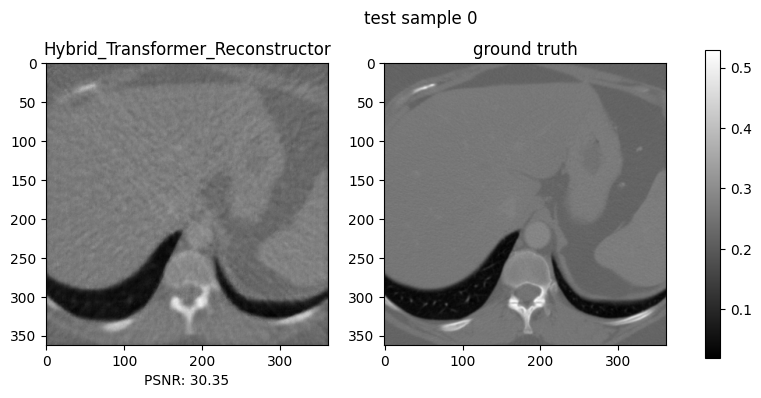

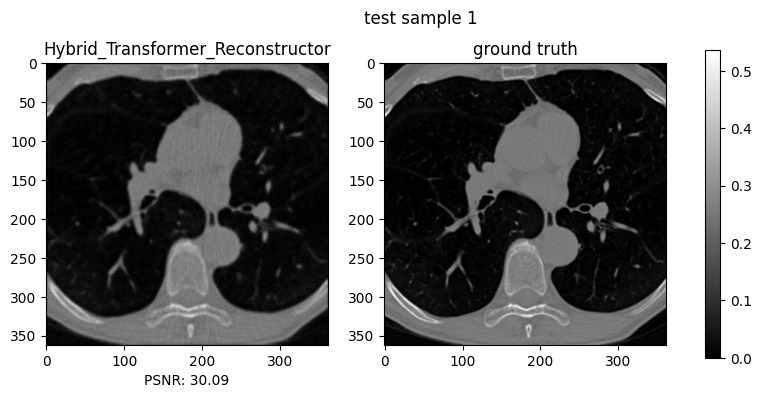

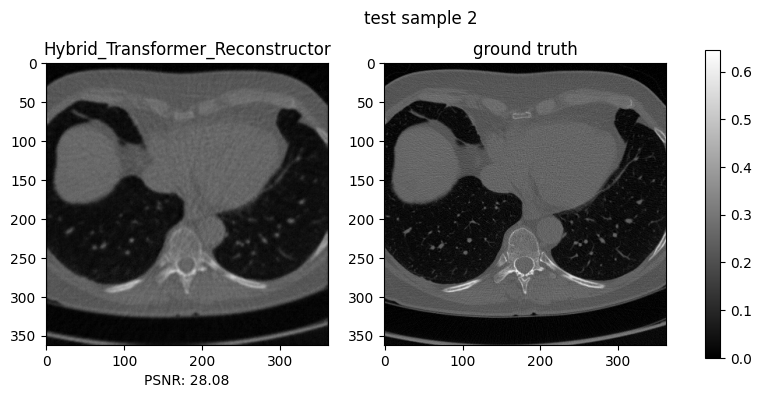

In [32]:
# testing pipeline

weights1 = './model_zoo/GrayDenoising_Restormer_RetrainCT/net_g_24000.pth'
yaml_file1 = 'Options/GrayDenoising_Restormer_RetrainCT.yml'

hybrid_model_t1 = hybrid_model_cls(weights1, yaml_file1, name= "Hybrid Transformer Model1")

try:
  del recos2
  del psnrs2
except:
  print('no recos2')
finally:
  recos2 = []
  psnrs2 = []

for obs, gt in test_data_10:
    torch.cuda.ipc_collect() # collects unnecessary inter-process comm.s and free VRAM
    torch.cuda.empty_cache()
    # reco = reconstructor.reconstruct(obs) # return odl elem H,W with normalized pixel vals
    # hybrid_model_1.reconstruct(reco)

    # locate new model in class directly to projection
    reco2 = hybrid_model_t1.reconstruct(obs)

    # resume default pipeline
    recos2.append(reco2)
    psnrs2.append(PSNR(reco2, gt))

print('mean psnr: {:f}'.format(np.mean(psnrs2)))

for i in range(3):
    _, ax = plot_images([recos2[i], test_data_10.ground_truth[i]],
                        fig_size=(10, 4))
    ax[0].set_xlabel('PSNR: {:.2f}'.format(psnrs2[i]))
    ax[0].set_title('Hybrid_Transformer_Reconstructor')
    ax[1].set_title('ground truth')
    ax[0].figure.suptitle('test sample {:d}'.format(i))

# del hybrid_model_cls

In [37]:
# alternative function for evaluation in u'd prefer it instead of a class

def hybrid_model(weights, yaml_file):
  model_type = 'blind' # or 'non_blind'
  sigmas_str = '15,25,50' # Define sigma values as a string

  # weights_path = './pretrained_models/gaussian_gray_denoising' # original weights
  # weights_path = './model_zoo/GrayDenoising_Restormer_RetrainCT4/' # retrained weights - specifying folder with /

  ####### Load yaml #######
  # if model_type == 'blind':
  #     # yaml_file = 'Options/GaussianGrayDenoising_Restormer.yml' # original
  #     yaml_file = 'Options/GrayDenoising_Restormer_RetrainCT4.yml' # retrained
  # else:
  #     # Assuming sigma for non_blind is the first one if multiple are given
  #     yaml_file = f'Options/GaussianGrayDenoising_RestormerSigma{sigmas_str.split(",")[0]}.yml'

  try:
      from yaml import CLoader as Loader
  except ImportError:
      from yaml import Loader

  x = yaml.load(open(yaml_file, mode='r'), Loader=Loader) # Loader is just a yaml loader
  s = x['network_g'].pop('type') # Restormer class doesn't have a type param in cls init
  model_restoration = Restormer(**x['network_g'])

  # if model_type == 'blind':
  #     # weights = weights_path+'_blind.pth' # original weights
  #     weights = weights_path+'net_g_24000.pth' # retrained weights net_g_12000
  # else:
  #     weights = weights_path + '_sigma' + str(sigma_test) +'.pth'

  checkpoint = torch.load(weights)
  model_restoration.load_state_dict(checkpoint['params'])
  model_restoration.cuda()
  # model_restoration = nn.DataParallel(model_restoration) # this changes model type to DataParallel
  model_restoration.eval()
  return model_restoration

def eval_ctrecn (test_data_, hybrid_model):
  """ input dataset, 2nd hybrid_model to put on top of FBP model returns 2 lists recos_, psnrs_ of whole ds"""
  recos_=[]
  psnrs_=[]
  #%% evaluate
  img_multiple_of = 8
  # from ctexample section
  reconstructor = FBPReconstructor(ray_trafo, hyper_params={
      'filter_type': 'Hann',
      'frequency_scaling': 0.8})

  with torch.no_grad(): # save memory by not calc gradient
    for obs, gt in test_data_:
        torch.cuda.ipc_collect() # collects unnecessary inter-process comm.s and free VRAM
        torch.cuda.empty_cache()

        reco = reconstructor.reconstruct(obs) # return odl elem H,W with normalized pixel vals
        # applying the transition layer and Denoicing model on top
        reco = odl_to_single(reco) # return 3d np arr H,W,C:1
        input_ = torch.from_numpy(reco).permute(2,0,1).unsqueeze(0).cuda() # shape is 1B,3or1C,H,W

        # Pad the input if not_multiple_of 8 # pad height and width
        h,w = input_.shape[2], input_.shape[3]
        H,W = ((h+img_multiple_of)//img_multiple_of)*img_multiple_of, ((w+img_multiple_of)//img_multiple_of)*img_multiple_of
        padh = H-h if h%img_multiple_of!=0 else 0
        padw = W-w if w%img_multiple_of!=0 else 0
        input_ = F.pad(input_, (0,padw,0,padh), 'reflect')

        # inpput shape torch.Size([1B, 3or1C, 368, 368]) # pixels normalized 0,1
        restored_ = hybrid_model(input_)
        # out shape torch.Size([1, 3, 368, 368]) # pixels normalized 0,1
        restored_ = torch.clamp(restored_, 0, 1) # set floor ceiling for pix vals
        restored_ = restored_[0,0,:h,:w] # discard RGB channel, Batch dim will suffice for evaluation
        reco2 = restored_.cpu().detach().numpy() # change shape from B,C,H,W to B, H, W, C then move to CPU since tensor to numpy later, conf no gradients still attached
        # resume default pipeline reco2 can be H,W,1
        recos_.append(reco2)
        # gt = utilsImg.modcrop(gt, 8) # match shape of reco2 modcropped in DruNet
        psnrs_.append(PSNR(reco2, gt))

  print('whole eval mean psnr: {:f}'.format(np.mean(psnrs_)))
  return recos_, psnrs_

# Evaluation

In [33]:
weightsU8 = '/home/hiran/model_zoo/drunet_gray.pth'
nameU8 = 'Hybrid UNet Residual model sigma 8'
hybrid_model_u8 = hybrid_model_UNetRes(weightsU8, nameU8, sigma = 8)

weightsU15 = '/home/hiran/model_zoo/drunet_gray.pth'
nameU15 = 'Hybrid UNet Residual model sigma 15'
hybrid_model_u15 = hybrid_model_UNetRes(weightsU15, nameU15, sigma = 15)

weightsU25 = '/home/hiran/model_zoo/drunet_gray.pth'
nameU25 = 'Hybrid UNet Residual model sigma 25'
hybrid_model_u25 = hybrid_model_UNetRes(weightsU25, nameU25, sigma = 25)

weightsU35 = '/home/hiran/model_zoo/drunet_gray.pth'
nameU35 = 'Hybrid UNet Residual model sigma 35'
hybrid_model_u35 = hybrid_model_UNetRes(weightsU35, nameU35, sigma = 35) # current best from HbrUnt

weightsU42 = '/home/hiran/model_zoo/drunet_gray.pth'
nameU42 = 'Hybrid UNet Residual model sigma 42'
hybrid_model_u42 = hybrid_model_UNetRes(weightsU42, nameU42, sigma = 42)

weightsU38 = '/home/hiran/model_zoo/drunet_gray.pth'
nameU38 = 'Hybrid UNet Residual model sigma 38'
hybrid_model_u38 = hybrid_model_UNetRes(weightsU38, nameU38, sigma = 38)

weights0 = '/home/hiran/Restormer/Denoising/model_zoo/net_g_240000.pth'
yaml_file0 = 'Options/GaussianGrayDenoising_Restormer.yml'

weights1 = '/home/hiran/Restormer/Denoising/model_zoo/GrayDenoising_Restormer_RetrainCT/net_g_24000.pth'
yaml_file1 = 'Options/GrayDenoising_Restormer_RetrainCT.yml'

weights4 = '/home/hiran/Restormer/Denoising/model_zoo/GrayDenoising_Restormer_RetrainCT4/net_g_12000.pth'
yaml_file4 = 'Options/GrayDenoising_Restormer_RetrainCT4.yml'

weights5 = '/home/hiran/Restormer/Denoising/pretrained_models/gaussian_gray_denoising_blind.pth'
yaml_file5 = 'Options/GaussianGrayDenoising_Restormer - original backup.yml'

# del weights, yaml_file

hybrid_model_t0 = hybrid_model_cls(weights0, yaml_file0, name= "Hbrd Transf_0-GreyImage Progr Training 300K Itr")
hybrid_model_t1 = hybrid_model_cls(weights1, yaml_file1, name= "Hbrd Transf_1-CT retrn fixPatch 240K Itr") # current best from blind Transformer
hybrid_model_t4 = hybrid_model_cls(weights4, yaml_file4, name= "Hbrd Transf_4-CT Progr Training 24K, 12Kth Itr select")
hybrid_model_t5 = hybrid_model_cls(weights5, yaml_file5, name= "Hbrd Transf_5-Pre_Trained_blind")

# plot_ctrecn(test_data_2, recos2, psnrs_, visuals = 2)

In [34]:
# adding nother models just before VIVA



weights6 = '/home/hiran/Restormer/Denoising/pretrained_models/gaussian_gray_denoising_sigma25.pth'
yaml_file6 = 'Options/GaussianGrayDenoising_Restormer - original backup.yml'
hybrid_model_t6 = hybrid_model_cls(weights6, yaml_file6, name= "Hbrd T_6-Img pretrn sigma25", sigma_level=25) # current best from non-blind Transformer

weights7 = '/home/hiran/Restormer/Denoising/pretrained_models/gaussian_gray_denoising_sigma25.pth'
yaml_file7 = 'Options/GaussianGrayDenoising_Restormer - original backup.yml'
hybrid_model_t7 = hybrid_model_cls(weights7, yaml_file7, name= "Hbrd T_7-Img pretrn sigma35", sigma_level=35) # not performant, too much noise for the model

weights8 = '/home/hiran/Restormer/Denoising/pretrained_models/gaussian_gray_denoising_sigma50.pth'
yaml_file8 = 'Options/GaussianGrayDenoising_Restormer - original backup.yml'
hybrid_model_t8 = hybrid_model_cls(weights8, yaml_file8, name= "Hbrd T_8-Img pretrn sigma50, inpSig35", sigma_level=35) # average

In [ ]:
# test_set_2
# psnr 29.048862 retrainCT4 12000 progressive 24K itr, but 12 is the best
# psnr 28.960581 retrainCT3 12000 fix patch quick
# psnr 30.221161 retrainCT 24000 fix patch
# best psnr seen - 31.39...

# test_set_10
# last psnr - 31.395075 retrainCT4 12000
# 32 or 31.251339 retrainCT3
# 31.046551,
# best psnr seen - 31.39...

#### All model Evaluation

In [ ]:
# experimenting to get the models perform on test_data, test_data_2

np.random.seed(0) # to make pois noise in obs is consistent throughout reconstructors; fair evaluation hence.

# obs0, gt0 = test_data [0]
# test_pair_0 = DataPairs(obs0, gt0, name='test_pair_0')

# lodopab, ellipses doesn't need to know reco space since ray_trafo obtainable .get_ra_trafo
# shepp-logan phantom
reco_space = odl.uniform_discr(min_pt=[-20, -20], max_pt=[20, 20], shape=[300, 300],dtype='float32')

#######  Ray transformations, uncomment according to dataset tested
# radon transform function ( build sinogram from a ct scan )

ray_trafo = dataset.get_ray_trafo(impl=IMPL) # - for Lodopab dataset
# ray_trafo = dataset_ellipses.get_ray_trafo(impl=IMPL) # - for ellipsis dataset
# ray_trafo = odl.tomo.RayTransform(reco_space, geometry, impl='astra_cuda') # shepp-logan

# phantom = odl.phantom.shepp_logan(reco_space, modified=True) # import standard scientific sample ct named shpp logan. that's our gt
# ground_truth = phantom

# geometry = odl.tomo.cone_beam_geometry(reco_space, 40, 40, 360) # build our ct machine geometry using odl # object = human cross section space, source = ray emmiter radius from origin = human , likewise radius from origin to detect, optional no.of angles in our geometry

# proj_data = ray_trafo(phantom) # call the function to build the sinogram aka projection
# observation = (proj_data + np.random.poisson(0.3, proj_data.shape)).asarray()
# test_data_shepp = DataPairs(observation, ground_truth, name='shepp-logan + pois')

# %% task table and reconstructors
eval_tt = TaskTable()
fbp_reconstructor = FBPReconstructor(ray_trafo)
cg_reconstructor = CGReconstructor(ray_trafo, ray_trafo.domain.zero(), 4)
gn_reconstructor = GaussNewtonReconstructor(ray_trafo, ray_trafo.domain.zero(), 2)
lw_reconstructor = LandweberReconstructor(ray_trafo, ray_trafo.domain.zero(), 8)
mlem_reconstructor = MLEMReconstructor(ray_trafo, 0.5*ray_trafo.domain.one(), 1)
ista_reconstructor = ISTAReconstructor(ray_trafo,ray_trafo.domain.zero(), 10) # works
pdhg_reconstructor = PDHGReconstructor(ray_trafo, ray_trafo.domain.zero(), 10) # operand issue
dougrach_reconstructor = DouglasRachfordReconstructor(ray_trafo,
                                                      ray_trafo.domain.zero(), 10) # operand issue
forwardbackward_reconstructor = ForwardBackwardReconstructor(ray_trafo,
                                                      ray_trafo.domain.zero(), 10) # operand issue
admm_reconstructor = ADMMReconstructor(ray_trafo, ray_trafo.domain.zero(), 10) # works
bfgs_reconstructor = BFGSReconstructor(ray_trafo, ray_trafo.domain.zero(), 10) # works

#,   pdhg_reconstructor, dougrach_reconstructor ,forwardbackward_reconstructor ]
                  # removed at 6-8 due to unsupported operand type(s) for +: 'MultiplyOperator' and 'DiscretizedSpaceElement'

reconstructors_tested = [fbp_reconstructor, admm_reconstructor, ista_reconstructor, mlem_reconstructor, gn_reconstructor, hybrid_model_u8, lw_reconstructor, hybrid_model_t0, hybrid_model_u15, hybrid_model_u25, hybrid_model_u35, hybrid_model_t4, cg_reconstructor, iradonmap_reconstructor, hybrid_model_t1, hybrid_model_t5] # , learnedpd_reconstructor, diptv_reconstructor - takes very long bfgs_reconstructor - negative PSNR

options = {'save_iterates': False, 'skip_training': True} # True original # addition skip_training': True

# eval_tt.append_all_combinations(reconstructors=reconstructors_tested, test_data= [test_data_ellipses], options=options)
eval_tt.append_all_combinations(reconstructors=reconstructors_tested, test_data=[test_data_10], options=options) # original

# testing one reconstructor
# eval_tt.append_all_combinations(reconstructors=[dougrach_reconstructor],
#                                 test_data=[test_data_shepp], options=options)

# %% run task table
results = eval_tt.run()
results.apply_measures([PSNR, SSIM])
# print(results.to_string)
print(results)

# # %% plot reconstructions
# fig = results.plot_all_reconstructions(fig_size=(9, 4), vrange='individual')

# # %% plot convergence of CG # comment out if testing one reconstructor
# results.plot_convergence(1, fig_size=(9, 6), gridspec_kw={'hspace': 0.5})

# # %% plot performance
# results.plot_performance(PSNR, figsize=(10, 4))

running task 0/16 ...
running task 1/16 ...
running task 2/16 ...
running task 3/16 ...
running task 4/16 ...
running task 5/16 ...
running task 6/16 ...
running task 7/16 ...
running task 8/16 ...
running task 9/16 ...
running task 10/16 ...
running task 11/16 ...
running task 12/16 ...
running task 13/16 ...
running task 14/16 ...
running task 15/16 ...
ResultTable(results=
                                                 reconstructor       test_data                     measure_values
task_ind sub_task_ind                                                                                            
0        0                                    FBPReconstructor  test part 0:10   mean: {psnr: 25.4, ssim: 0.4552}
1        0                                   ADMMReconstructor  test part 0:10  mean: {psnr: 11.6, ssim: 0.07373}
2        0                                   ISTAReconstructor  test part 0:10  mean: {psnr: 11.6, ssim: 0.07372}
3        0                                   MLEMRe

In [ ]:
ray_trafo = dataset.get_ray_trafo(impl=IMPL) # - for Lodopab dataset

eval_tt = TaskTable()
fbp_reconstructor = FBPReconstructor(ray_trafo)
cg_reconstructor = CGReconstructor(ray_trafo, ray_trafo.domain.zero(), 4)
gn_reconstructor = GaussNewtonReconstructor(ray_trafo, ray_trafo.domain.zero(), 2)
lw_reconstructor = LandweberReconstructor(ray_trafo, ray_trafo.domain.zero(), 8)
mlem_reconstructor = MLEMReconstructor(ray_trafo, 0.5*ray_trafo.domain.one(), 1)
ista_reconstructor = ISTAReconstructor(ray_trafo,ray_trafo.domain.zero(), 10) # works
pdhg_reconstructor = PDHGReconstructor(ray_trafo, ray_trafo.domain.zero(), 10) # operand issue
dougrach_reconstructor = DouglasRachfordReconstructor(ray_trafo,
                                                      ray_trafo.domain.zero(), 10) # operand issue
forwardbackward_reconstructor = ForwardBackwardReconstructor(ray_trafo,
                                                      ray_trafo.domain.zero(), 10) # operand issue
admm_reconstructor = ADMMReconstructor(ray_trafo, ray_trafo.domain.zero(), 10) # works
bfgs_reconstructor = BFGSReconstructor(ray_trafo, ray_trafo.domain.zero(), 10) # works


reconstructors_tested = [fbp_reconstructor, admm_reconstructor, ista_reconstructor, mlem_reconstructor, gn_reconstructor, hybrid_model_u8, lw_reconstructor, hybrid_model_t0, hybrid_model_u15, hybrid_model_u25, hybrid_model_u35, hybrid_model_t4, cg_reconstructor, iradonmap_reconstructor, hybrid_model_t1, hybrid_model_t5]

options = {'save_iterates': False, 'skip_training': True}
eval_tt.append_all_combinations(reconstructors=reconstructors_tested, test_data=[test_data_50], options=options)
results = eval_tt.run()
results.apply_measures([PSNR, SSIM])
print(results)

ResultTable(results=
                                                 reconstructor       test_data                     measure_values
task_ind sub_task_ind                                                                                            
0        0                                    FBPReconstructor  test part 0:50  mean: {psnr: 23.87, ssim: 0.4011}
1        0                                   ADMMReconstructor  test part 0:50  mean: {psnr: 10.2, ssim: 0.07581}
2        0                                   ISTAReconstructor  test part 0:50  mean: {psnr: 10.2, ssim: 0.07581}
3        0                                   MLEMReconstructor  test part 0:50  mean: {psnr: 17.09, ssim: 0.4496}
4        0                            GaussNewtonReconstructor  test part 0:50  mean: {psnr: 17.42, ssim: 0.4828}
5        0                  Hybrid UNet Residual model sigma 8  test part 0:50   mean: {psnr: 20.8, ssim: 0.4176}
6        0                              LandweberReconstructor  tes

In [ ]:
ray_trafo = dataset.get_ray_trafo(impl=IMPL) # - for Lodopab dataset

eval_tt = TaskTable()
fbp_reconstructor = FBPReconstructor(ray_trafo)
cg_reconstructor = CGReconstructor(ray_trafo, ray_trafo.domain.zero(), 4)
gn_reconstructor = GaussNewtonReconstructor(ray_trafo, ray_trafo.domain.zero(), 2)
lw_reconstructor = LandweberReconstructor(ray_trafo, ray_trafo.domain.zero(), 8)
mlem_reconstructor = MLEMReconstructor(ray_trafo, 0.5*ray_trafo.domain.one(), 1)
ista_reconstructor = ISTAReconstructor(ray_trafo,ray_trafo.domain.zero(), 10) # works
pdhg_reconstructor = PDHGReconstructor(ray_trafo, ray_trafo.domain.zero(), 10) # operand issue
dougrach_reconstructor = DouglasRachfordReconstructor(ray_trafo,
                                                      ray_trafo.domain.zero(), 10) # operand issue
forwardbackward_reconstructor = ForwardBackwardReconstructor(ray_trafo,
                                                      ray_trafo.domain.zero(), 10) # operand issue
admm_reconstructor = ADMMReconstructor(ray_trafo, ray_trafo.domain.zero(), 10) # works
bfgs_reconstructor = BFGSReconstructor(ray_trafo, ray_trafo.domain.zero(), 10) # works


reconstructors_tested = [fbp_reconstructor, admm_reconstructor, ista_reconstructor, mlem_reconstructor, gn_reconstructor, hybrid_model_u8, lw_reconstructor, hybrid_model_t0, hybrid_model_u15, hybrid_model_u25, hybrid_model_u35, hybrid_model_t4, cg_reconstructor, iradonmap_reconstructor, hybrid_model_t1, hybrid_model_t5]

options = {'save_iterates': False, 'skip_training': True}
eval_tt.append_all_combinations(reconstructors=reconstructors_tested, test_data=[test_data_all], options=options)
results = eval_tt.run()
results.apply_measures([PSNR, SSIM])
print(results)

running task 0/15 ...
running task 1/15 ...
running task 2/15 ...


In [48]:
oth_recons = [iradonmap_reconstructor, hybrid_model_t0, hybrid_model_t1, hybrid_model_t4, hybrid_model_t5, hybrid_model_u8,
             hybrid_model_u15, hybrid_model_u25, hybrid_model_u35, hybrid_model_u38, hybrid_model_u42]

In [ ]:
inference_by_mult_datasets_models( inf_published = True, oth_recons = oth_recons, dataset_list = [ dataset], test_data_list = [test_data_10] ) # have to config fbp ray trafo for all new models if we want to run inference for ellipses

running task 0/18 ...
running task 1/18 ...
running task 2/18 ...
running task 3/18 ...
running task 4/18 ...
running task 5/18 ...
running task 6/18 ...
running task 7/18 ...
running task 8/18 ...
running task 9/18 ...
running task 10/18 ...
running task 11/18 ...
running task 12/18 ...
running task 13/18 ...
running task 14/18 ...
running task 15/18 ...
running task 16/18 ...
running task 17/18 ...
ResultTable(results=
                                                 reconstructor       test_data                         measure_values
task_ind sub_task_ind                                                                                                
0        0                                    FBPReconstructor  test part 0:10       mean: {psnr: 25.4, ssim: 0.4552}
1        0                            GaussNewtonReconstructor  test part 0:10      mean: {psnr: 18.47, ssim: 0.4831}
2        0                                   ISTAReconstructor  test part 0:10      mean: {psnr: 11.6, 

In [ ]:
# inference_by_mult_datasets_models( inf_published = True, oth_recons = oth_recons, dataset_list = [ dataset], test_data_list = [test_data] )

running task 0/18 ...
running task 1/18 ...
running task 2/18 ...
running task 3/18 ...
running task 4/18 ...
running task 5/18 ...
running task 6/18 ...
running task 7/18 ...
running task 8/18 ...
running task 9/18 ...
running task 10/18 ...
running task 11/18 ...
running task 12/18 ...
running task 13/18 ...
running task 14/18 ...
running task 15/18 ...
running task 16/18 ...
running task 17/18 ...
ResultTable(results=
                                                 reconstructor        test_data                         measure_values
task_ind sub_task_ind                                                                                                 
0        0                                    FBPReconstructor  test part 0:256      mean: {psnr: 23.79, ssim: 0.4003}
1        0                            GaussNewtonReconstructor  test part 0:256      mean: {psnr: 17.49, ssim: 0.4707}
2        0                                   ISTAReconstructor  test part 0:256      mean: {psnr: 1

"""
Our model exceeds iRadonMap, GaussNewton, ISTA, CG, Landwerb, MLEM Reconstructor, ADMM, BFGS models
"""

In [ ]:
"""
Our model exceeds iRadonMap, GaussNewton, ISTA, CG, Landwerb, MLEM Reconstructor, ADMM, BFGS models
"""

extra work for VIVA

In [ ]:
inference_by_mult_datasets_models( inf_published = False, oth_recons = [hybrid_model_t0,reconstructor, hybrid_model_u38], dataset_list = [ dataset], test_data_list = [test_data_10] ) # have to config fbp ray trafo for all new models if we want to run inference for ellipses

running task 0/3 ...
running task 1/3 ...
running task 2/3 ...
ResultTable(results=
                                                        reconstructor       test_data                     measure_values
task_ind sub_task_ind                                                                                                   
0        0             Hbrd Transf0-GreyImage Progr Training 300K Itr  test part 0:10  mean: {psnr: 25.89, ssim: 0.4755}
1        0                                           FBPReconstructor  test part 0:10  mean: {psnr: 31.22, ssim: 0.7181}
2        0                        Hybrid UNet Residual model sigma 38  test part 0:10  mean: {psnr: 30.04, ssim: 0.7196}
)


In [ ]:
inference_by_mult_datasets_models( inf_published = False, oth_recons = [hybrid_model_t1, hybrid_model_t6,hybrid_model_u35], dataset_list = [ dataset], test_data_list = [test_data_10] )

running task 0/3 ...
running task 1/3 ...
running task 2/3 ...
ResultTable(results=
                                                                reconstructor       test_data                     measure_values
task_ind sub_task_ind                                                                                                           
0        0                            Hbrd Transf1-CT retrn fixPatch 240K Itr  test part 0:10  mean: {psnr: 31.05, ssim: 0.7198}
1        0             Hbrd Transf_6-CT retrn fixPatch 240K Itr with noise 25  test part 0:10  mean: {psnr: 30.64, ssim: 0.7202}
2        0                                Hybrid UNet Residual model sigma 35  test part 0:10  mean: {psnr: 29.88, ssim: 0.7117}
)


In [41]:
inference_by_mult_datasets_models( inf_published = True, oth_recons = oth_recons, dataset_list = [ dataset], test_data_list = [test_data_10] ) # have to config fbp ray trafo for all new models if we want to run inference for ellipses

running task 0/18 ...
running task 1/18 ...
running task 2/18 ...
running task 3/18 ...
running task 4/18 ...
running task 5/18 ...
running task 6/18 ...
running task 7/18 ...
running task 8/18 ...
running task 9/18 ...
running task 10/18 ...
running task 11/18 ...
running task 12/18 ...
running task 13/18 ...
running task 14/18 ...
running task 15/18 ...
running task 16/18 ...
running task 17/18 ...
ResultTable(results=
                                                               reconstructor       test_data                         measure_values
task_ind sub_task_ind                                                                                                              
0        0                                                  FBPReconstructor  test part 0:10       mean: {psnr: 25.4, ssim: 0.4552}
1        0                                          GaussNewtonReconstructor  test part 0:10      mean: {psnr: 18.47, ssim: 0.4831}
2        0                                     

In [72]:
inference_by_mult_datasets_models( inf_published = False, oth_recons = [hybrid_model_t4, hybrid_model_u35], dataset_list = [ dataset], test_data_list = [test_data_10], plot=True )

Output hidden; open in https://colab.research.google.com to view.

#### DEMO

Published learned models for DEMO:
- fbp_reconstructor,
- gn_reconstructor,
- ista_reconstructor,
- cg_reconstructor,
- lw_reconstructor,
- mlem_reconstructor,
- admm_reconstructor ,  
- bfgs_reconstructor,

Grand Challenge contestants (Winner, learnedpd)
- iradonmap_reconstructor,
- learnedpd_reconstructor

Novel hybrid model variants for DEMO: (best hybrid_model_t4)

- hybrid_model_t0,
- hybrid_model_t1,
- hybrid_model_t4,
- hybrid_model_t5,
- hybrid_model_u8,
- hybrid_model_u15,
- hybrid_model_u25,
- hybrid_model_u35,
- hybrid_model_u38,
- hybrid_model_u42

In [108]:
# initializing published models

ray_trafo = dataset.get_ray_trafo(impl=IMPL) # - for Lodopab dataset

# %% task table and reconstructors
# fbp_reconstructor = FBPReconstructor(ray_trafo)
cg_reconstructor = CGReconstructor(ray_trafo, ray_trafo.domain.zero(), 4)
gn_reconstructor = GaussNewtonReconstructor(ray_trafo, ray_trafo.domain.zero(), 2)
lw_reconstructor = LandweberReconstructor(ray_trafo, ray_trafo.domain.zero(), 8)
mlem_reconstructor = MLEMReconstructor(ray_trafo, 0.5*ray_trafo.domain.one(), 1)
ista_reconstructor = ISTAReconstructor(ray_trafo,ray_trafo.domain.zero(), 10) # works
admm_reconstructor = ADMMReconstructor(ray_trafo, ray_trafo.domain.zero(), 10) # usually in lodopab
bfgs_reconstructor = BFGSReconstructor(ray_trafo, ray_trafo.domain.zero(), 10) # works

<class 'tuple'>
psnr benchmark: 32.218120
psnr Hybrid: 32.365309


Text(0.5, 0.98, 'test sample 33000')

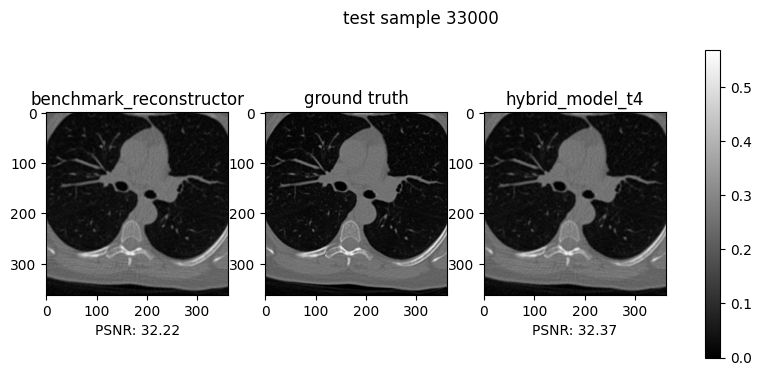

In [114]:
# Terminal cell

################

# DEMO

################

# define your sample
sample_no = 33000
print( type( dataset.get_sample(sample_no,part = 'train') ) )
fbp_img = hybrid_model_t5.reconstruct( dataset.get_sample(sample_no,part = 'train')[0] )
hybrid_img = hybrid_model_t4.reconstruct( dataset.get_sample(sample_no,part = 'train')[0] )
gt = dataset.get_sample(sample_no,part = 'train')[1]

psnr_fbp = PSNR(fbp_img, gt)
psnr_hybr_4 = PSNR(hybrid_img, gt)

print('psnr benchmark: {:f}'.format(psnr_fbp))
print('psnr Hybrid: {:f}'.format(psnr_hybr_4))

_, ax = plot_images([fbp_img, gt, hybrid_img],
                    fig_size=(10, 4))
ax[0].set_xlabel('PSNR: {:.2f}'.format(psnr_fbp))
ax[2].set_xlabel('PSNR: {:.2f}'.format(psnr_hybr_4))
ax[0].set_title(f'benchmark_reconstructor')
ax[2].set_title(f'hybrid_model_t4')
ax[1].set_title('ground truth')
ax[0].figure.suptitle('test sample {:d}'.format(sample_no))

# discuss Technologies & Tools Used / Key Challenges and Achievements /Resources and Future Work

In [ ]:
# !free -h # check WSL2 RAM